# Problem set 2 (40 + 36 + 35 = 111 pts)

In this problem set we also present some bonus problems that will be considered as in Problem Set 1.

## Problem 1. Segmentation. (40 pts)
In this task, you will need to solve the problem of semantic segmentation of the attributes of a person's face. You will work with [CelebAMask-HQ](https://github.com/switchablenorms/CelebAMask-HQ) dataset. You are free to solve and implement required steps on your own. However, there are several constraints and advices:
- To speed up and simplify experiments, you can transform images to 512x512 resolution and use this [train-test split](https://drive.google.com/file/d/1vO4mJ08FMdcom2-sNs4WHxPztIRYrFYI/view?usp=share_link), that has smaller number of images.
- (20 pts) Implement needed train-test pipeline (dataset, model, train and test loops), train and test the model. 
  - (10 pts) Bonus: your own model, not taken from libraries and not a Unet.
- (5 pts) Report IoU and Dice-scores of each class on the test set.
- (5 pts) Try to add augmentations (helpful [link1](https://albumentations.ai/) and [link2](https://kornia.github.io/)).
- (2 pts) Plot 4-6 examples of obtained results on the test set (show the best and the worst according to the loss/metrics).
- (3 pts) Explain why you solved the problem this way and not otherwise, provide description of experiments and their results. Analyze your metrics, are they suitable?
- (5 pts) Make additional function for inference that receives path to the image. Test your model on several photos not from the dataset (pick your own photo or any other from internet). Does your model work well on the new data?
- Do not use already pretrained on CelebAMask-HQ models.
- **Bonus**: 
  - **+10 points** for top-1 result
  - **+8 points** for 2-3 places
  - **+5 points** for 4-8 places 
according to reported mean Dice score on the provided test split.

Wandb report https://wandb.ai/darkdestiny/dl2_segmentation?workspace=user-benchm

Wgths https://drive.google.com/drive/folders/1jVVcCri-6i8E8zWVIPxqc_TiRLhLPtqS?usp=sharing

In [ ]:
!gdown 1eJFFt150X7czXTxotfqRSIWEozLHAPDy
!unzip CelebAMask-HQ.zip

In [1]:
import numpy as np
import cv2
import pandas as pd
import os
from tqdm.notebook import tqdm
import wandb

In [2]:
!wandb login 7ed66683ab734c5607259a94b5937616a911f67b

wandb: Appending key for api.wandb.ai to your netrc file: /homes/markn/.netrc


In [3]:
split = pd.read_csv('celeb_train_test_split.csv')
train_id, test_id = [s[:-4] for s in split[split.is_train].name.tolist()],  [s[:-4] for s in split[~split.is_train].name.tolist()]

In [4]:
relevenat_images = [int(s[:-4]) for s in split.name.tolist()] #we will consider only those images that are in train-test split
relevenat_images

[28929,
 1741,
 11349,
 14782,
 2129,
 20780,
 15868,
 17061,
 11367,
 9451,
 24871,
 17538,
 26860,
 4809,
 15338,
 8348,
 4759,
 22384,
 29411,
 406,
 3619,
 15111,
 24119,
 18959,
 799,
 14569,
 18623,
 23712,
 11613,
 14740,
 27759,
 21658,
 16178,
 71,
 10484,
 5719,
 3545,
 27638,
 26254,
 15272,
 13564,
 18634,
 23458,
 28323,
 1037,
 16637,
 11201,
 175,
 14018,
 13401,
 26526,
 2303,
 3354,
 9898,
 28653,
 820,
 25161,
 979,
 2706,
 20180,
 15505,
 12250,
 26901,
 19927,
 4411,
 9518,
 4017,
 17306,
 24681,
 1227,
 2314,
 7898,
 3593,
 5914,
 27029,
 9319,
 348,
 22422,
 20816,
 19138,
 28454,
 27161,
 8940,
 23298,
 6415,
 16578,
 8969,
 28479,
 27148,
 17464,
 24287,
 23918,
 10525,
 3626,
 20545,
 15667,
 12125,
 15927,
 20395,
 24085,
 1234,
 19105,
 5450,
 6016,
 12694,
 10858,
 28244,
 25600,
 29946,
 17513,
 20009,
 17298,
 4211,
 18178,
 11770,
 6788,
 29615,
 1018,
 21049,
 3196,
 2458,
 4808,
 21711,
 9053,
 21089,
 16021,
 1584,
 7686,
 15459,
 5251,
 20787,
 4942,


In [18]:
from shutil import copyfile


def make_folder(path):
    if not os.path.exists(os.path.join(path)):
        os.makedirs(os.path.join(path))


label_list = ['skin', 'nose', 'eye_g', 'l_eye', 'r_eye', 'l_brow', 'r_brow', 'l_ear', 'r_ear', 'mouth', 'u_lip', 'l_lip', 'hair', 'hat', 'ear_r', 'neck_l', 'neck', 'cloth']
folder_base = 'CelebAMask-HQ/CelebAMask-HQ-mask-anno'
folder_save = 'CelebAMaskHQ-mask'
imsize = 512
make_folder(folder_save)

for k in tqdm(relevenat_images):
    folder_num = k // 2000
    im_base = np.zeros((imsize, imsize))
    for idx, label in enumerate(label_list):
        filename = os.path.join(folder_base, str(folder_num), str(k).rjust(5, '0') + '_' + label + '.png')
        if (os.path.exists(filename)):

            im = cv2.imread(filename)
            im = im[:, :, 0]
            im_base[im != 0] = (idx + 1)


    filename_save = os.path.join(folder_save, str(k) + '.png')
    cv2.imwrite(filename_save, im_base)

  0%|          | 0/5000 [00:00<?, ?it/s]

In [28]:
s_label = 'CelebAMaskHQ-mask/'
s_img = 'CelebAMask-HQ/CelebA-HQ-img/'

d_train_label = 'train_label'
d_train_img = 'train_img'

d_test_label = 'test_label'
d_test_img = 'test_img'


#### make folder
make_folder(d_train_label)
make_folder(d_train_img)
make_folder(d_test_label)
make_folder(d_test_img)

train_count = 0
test_count = 0

for id_ in tqdm(train_id):
    copyfile(os.path.join(s_label, id_ +'.png'), os.path.join(d_train_label, str(train_count)+'.png'))
    copyfile(os.path.join(s_img, id_ + '.jpg'), os.path.join(d_train_img, str(train_count)+'.jpg'))
    train_count += 1  

for id_ in tqdm(test_id):
    copyfile(os.path.join(s_label, id_ +'.png'), os.path.join(d_test_label, str(test_count)+'.png'))
    copyfile(os.path.join(s_img, id_ + '.jpg'), os.path.join(d_test_img, str(test_count)+'.jpg'))
    test_count += 1  

  0%|          | 0/3750 [00:00<?, ?it/s]

  0%|          | 0/1250 [00:00<?, ?it/s]

In [2]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets
from torchvision.transforms import ToTensor
import cv2
import albumentations as A


class Segm_Dataset(Dataset):

    def __init__(self, im_path, mask_path, transform=None):
        self.im_path = im_path
        self.mask_path = mask_path
        self.transform = transform
        
    def __len__(self):
        return len(os.listdir(self.im_path))
    
    def __getitem__(self, idx):
        image = cv2.cvtColor(
            cv2.resize(
                cv2.imread(
                    self.im_path + str(idx) + '.jpg'
                ),
                (512, 512)
            ),
            cv2.COLOR_BGR2RGB
        )
        mask = cv2.imread(self.mask_path + str(idx) + '.png', 0)
        
        if self.transform is not None:
            transformed = self.transform(image=image, mask=mask)
            image = transformed['image']
            mask = transformed['mask']
            
        image = A.Normalize()(image=image)['image']
        return torch.tensor(np.transpose(image, [2, 0, 1])), torch.tensor(mask)

In [3]:
train_transform = A.Compose(
    [
        A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),
        A.augmentations.geometric.transforms.Flip(p=0.2),
        #A.RandomBrightnessContrast(p=0.1)
    ]
)

train_ds = Segm_Dataset('train_img/', 'train_label/', train_transform)
test_ds = Segm_Dataset('test_img/', 'test_label/')

train_loader = DataLoader(train_ds, batch_size=24)
test_loader = DataLoader(test_ds, batch_size=24)

In [4]:
def score(preds, gt, SMOOTH = 1e-7):
    preds = preds.squeeze(1)
    gt = gt.squeeze(1)
    iou = torch.zeros(19, preds.shape[0])
    dice = torch.zeros(19, preds.shape[0])
    for i in range(19): #iterate over all classes
        mask_pred = preds == i
        mask_gt = gt == i
        intersection = (mask_pred & mask_gt).sum((1, 2))
        union = (mask_pred | mask_gt).sum((1, 2))
        iou[i, :] = (intersection + SMOOTH) / (union + SMOOTH)
        dice[i, :] = (2 * intersection + SMOOTH) / (intersection + union + SMOOTH)
    
    return iou, dice

In [5]:
def epoch_train(loader, model, criterion, opt):
    model.train()
    losses, iou_scores, dice_scores = [], torch.empty((19, 0), dtype=torch.float32), torch.empty((19, 0), dtype=torch.float32)
    for batch, labels in tqdm(loader):
        opt.zero_grad()
        batch, labels = batch.cuda(), labels.long().cuda()
        preds = model(batch)['out']
        loss = criterion(preds, labels)
        preds = torch.argmax(preds, dim=1)
        losses += [loss.detach().cpu().numpy()]
        iou, dice = score(preds, labels)
        iou_scores = torch.cat((iou_scores, iou), 1)
        dice_scores = torch.cat((dice_scores, dice), 1)
        loss.backward()
        opt.step()
    return np.mean(losses), iou_scores.mean(), dice_scores.mean()


def epoch_test(loader, model, criterion):

    model.eval()
    with torch.no_grad():
        losses, iou_scores, dice_scores = [], torch.empty((19, 0), dtype=torch.float32), torch.empty((19, 0), dtype=torch.float32)
        for batch, labels in tqdm(loader):
            batch, labels = batch.cuda(), labels.long().cuda()
            preds = model(batch)['out']
            loss = criterion(preds, labels)
            preds = torch.argmax(preds, dim=1)
            losses += [loss.detach().cpu().numpy()]
            iou, dice = score(preds, labels)
            iou_scores = torch.cat((iou_scores, iou), 1)
            dice_scores = torch.cat((dice_scores, dice), 1)
    #print(np.array(iou_scores))
    return np.mean(losses), iou_scores.mean(), dice_scores.mean()


def train(train_loader, test_loader, model, criterion, opt, n_epochs=50):
    wandb.init(project="dl2_segmentation", name = "run_6")
    for epoch in tqdm(range(n_epochs)):
        train_loss, train_dice, train_iou = epoch_train(train_loader, model, criterion, opt)
        wandb.log({"train_loss": train_loss, "train_dice": train_dice, "train_iou": train_iou})

        test_loss, test_dice, test_iou = epoch_test(test_loader, model, criterion)
        wandb.log({"test_loss": test_loss, "test_dice": test_dice, "test_iou": test_iou})

        print(f'[Epoch {epoch + 1}] train loss: {train_loss:.3f}; train dice: {train_dice:.2f}; ' + 
              f'test loss: {test_loss:.3f}; test dice: {test_dice:.2f}')
    wandb.finish()

### Training 

In [6]:
from torchvision.models.segmentation import deeplabv3_resnet50

model = deeplabv3_resnet50(weights=None, num_classes=19)
model.cuda()
optimizer = torch.optim.AdamW(params = model.parameters(), lr=5e-4)
criterion = torch.nn.CrossEntropyLoss(weight = (50 * torch.ones(19)).cuda())

In [13]:
train(train_loader, test_loader, model, criterion, optimizer, 9)

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

[Epoch 1] train loss: 0.125; train dice: 0.81; test loss: 0.168; test dice: 0.83


  0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

[Epoch 2] train loss: 0.125; train dice: 0.81; test loss: 0.169; test dice: 0.83


  0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

[Epoch 3] train loss: 0.119; train dice: 0.81; test loss: 0.178; test dice: 0.83


  0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

[Epoch 4] train loss: 0.112; train dice: 0.82; test loss: 0.165; test dice: 0.83


  0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

[Epoch 5] train loss: 0.117; train dice: 0.81; test loss: 0.177; test dice: 0.83


  0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

[Epoch 6] train loss: 0.112; train dice: 0.81; test loss: 0.168; test dice: 0.83


  0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

[Epoch 7] train loss: 0.107; train dice: 0.82; test loss: 0.190; test dice: 0.83


  0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

[Epoch 8] train loss: 0.107; train dice: 0.82; test loss: 0.171; test dice: 0.84


  0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

[Epoch 9] train loss: 0.105; train dice: 0.82; test loss: 0.167; test dice: 0.83


test_dice,▂▂▁▆▂▅▁█▆
test_iou,▃▃▁▆▂▅▁█▆
test_loss,▂▂▅▁▄▂█▃▂
train_dice,▁▂▃▅▄▄█▇█
train_iou,▁▂▃▅▄▄█▆█
train_loss,██▆▃▅▄▂▂▁
test_dice,0.83296
test_iou,0.88441
test_loss,0.16712
train_dice,0.82251
train_iou,0.87039


In [14]:
torch.save(model.state_dict(), 'checkpoint/wgths_30')

In [7]:
model.load_state_dict(torch.load('checkpoint/wgths_30'))

<All keys matched successfully>

### Analyzing the results

In [15]:
model.cuda()
model.eval()
images = torch.empty((0, 3, 512, 512))
with torch.no_grad():
    losses, iou_scores, dice_scores = [], torch.empty((19, 0), dtype=torch.float32), torch.empty((19, 0), dtype=torch.float32)
    for batch, labels in tqdm(test_loader):
        images = torch.cat((images, batch), 0)
        batch, labels = batch.cuda(), labels.long().cuda()
        preds = model(batch.float())['out']
        loss = criterion(preds, labels)
        preds = torch.argmax(preds, dim=1)
        losses += [loss.detach().cpu().numpy()]
        iou, dice = score(preds, labels)
        iou_scores = torch.cat((iou_scores, iou), 1)
        dice_scores = torch.cat((dice_scores, dice), 1)

  0%|          | 0/53 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


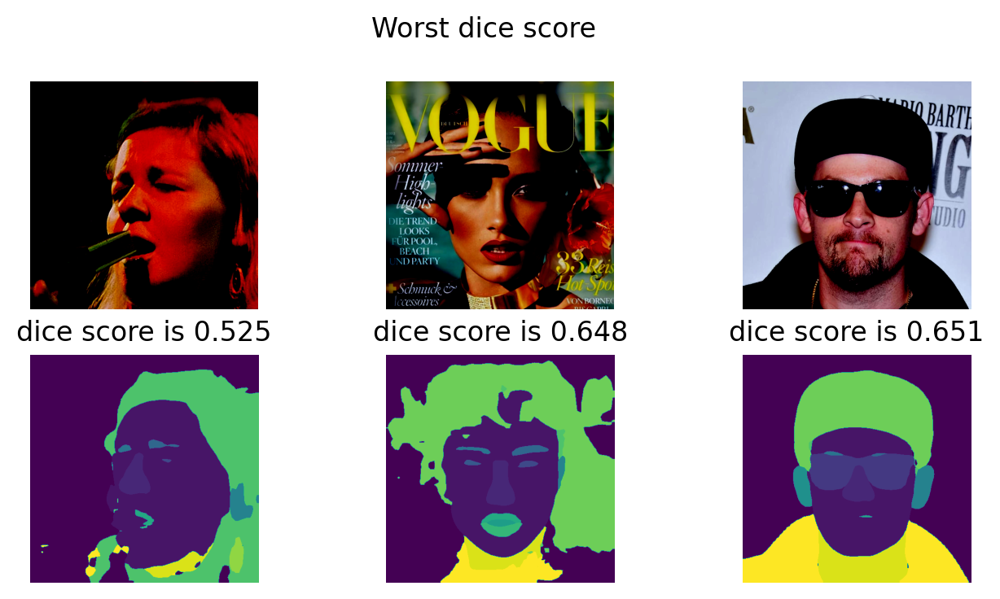

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


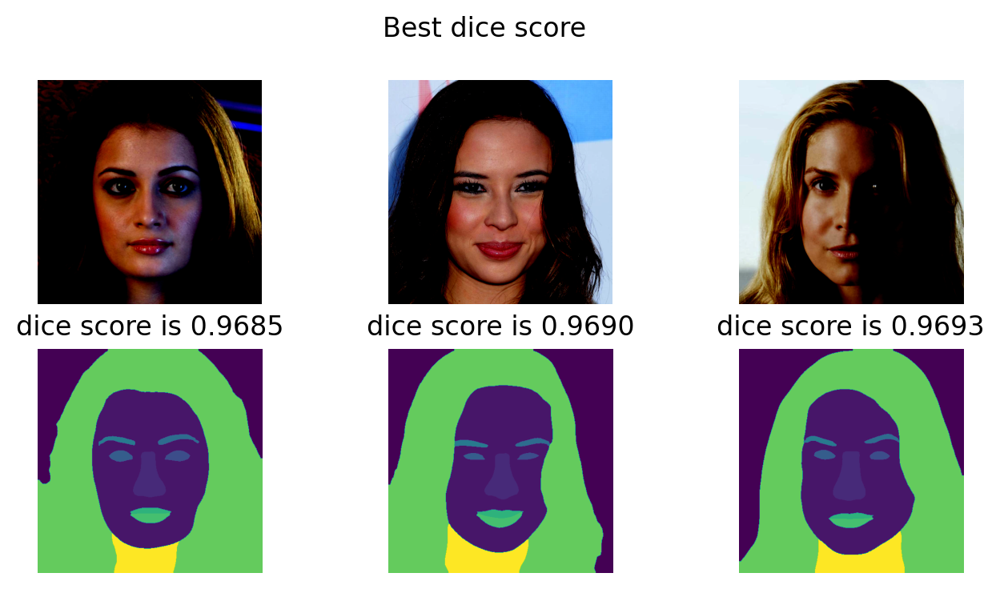

In [41]:
import matplotlib.pyplot as plt


def process_output(output): #function to convert model output to ndarray
    x = torch.argmax(output, dim=1)
    return x.numpy().transpose((1, 2, 0))
        
model.cpu()

avg_dice = dice_scores.mean(0)

worst_scores, worst_indx = dice_scores.mean(0).sort().values, dice_scores.mean(0).sort().indices
worst_pictures = [images[i] for i in worst_indx[:3]]
best_pictures = [images[i] for i in worst_indx[-4:]] 
best_scores = worst_scores[-4:]

fig = plt.figure(figsize=(8, 4), dpi=200)
columns = 3
rows = 2
for i in range(1, columns*rows +1):
    if i <= 3:
        img = worst_pictures[i - 1].numpy().transpose((1, 2, 0)) / worst_pictures[i - 1].max()
    else:
        img = torch.argmax(model(worst_pictures[i - 4][None, ...])['out'], dim=1).numpy().transpose((1, 2, 0))
        
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    if i > 3:
        plt.title(f'dice score is {worst_scores[i - 4]:.3f}')
    plt.axis('off')
fig.suptitle('Worst dice score')
plt.show()



fig = plt.figure(figsize=(8, 4), dpi=200)
columns = 3
rows = 2
for i in range(1, columns*rows +1):
    if i <= 3:
        img = best_pictures[i - 1].numpy().transpose((1, 2, 0)) / best_pictures[i - 1].max()
    else:
        img = torch.argmax(model(best_pictures[i - 4][None, ...])['out'], dim=1).numpy().transpose((1, 2, 0))
        
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    if i > 3:
        plt.title(f'dice score is {best_scores[i - 4]:.4f}')
    plt.axis('off')
fig.suptitle('Best dice score')
plt.show()

In [42]:
d = []
label_list = ['skin', 'nose', 'eye_g', 'l_eye', 'r_eye', 'l_brow', 'r_brow', 'l_ear', 'r_ear', 'mouth', 'u_lip', 'l_lip', 'hair', 'hat', 'ear_r', 'neck_l', 'neck', 'cloth']
avg_iou = iou_scores.mean(0)
for i in range(len(label_list)):
    d.append([label_list[i], round(float(avg_iou[i]), 5), round(float(avg_dice[i]), 5)])

print('Average metrics on test for every class')
    
format_row = "{:>12}" * 3
print(format_row.format('Label', 'IoU', 'Dice'))
for x in d:
    print(format_row.format(*x))


Average metrics on test for every class
       Label         IoU        Dice
        skin     0.82951      0.8905
        nose     0.85734     0.91529
       eye_g     0.89498      0.9302
       l_eye     0.85525     0.90739
       r_eye     0.63224     0.67257
      l_brow     0.86585     0.92394
      r_brow     0.81785     0.85332
       l_ear     0.84622     0.91203
       r_ear     0.91744     0.95502
       mouth     0.81792     0.87688
       u_lip     0.79975     0.85993
       l_lip     0.82925     0.89945
        hair      0.7872     0.83991
         hat     0.84113     0.88584
       ear_r     0.89895     0.94234
      neck_l     0.87806     0.92678
        neck     0.81251     0.86517
       cloth      0.8059     0.87226


I decided to take already existing architecture for segmentation. <br>
DeepLabv3 is a semantic segmentation architecture that improves upon DeepLabv2 with several modifications. To handle the problem of segmenting objects at multiple scales, modules are designed which employ atrous convolution in cascade or in parallel to capture multi-scale context by adopting multiple atrous rates. Furthermore, the Atrous Spatial Pyramid Pooling module from DeepLabv2 augmented with image-level features encoding global context and further boost performance. <br>
I thought that this model can overfit easily, so I used standard augmentations such as rotations, scalings and shifts. From the graphs I can say that it worked pretty well and model didn't overfit.

In [23]:
def predict(path, model):
    image = cv2.cvtColor(
            cv2.resize(
                cv2.imread(path),
                (512, 512)
            ),
            cv2.COLOR_BGR2RGB
        )
    image = A.Normalize()(image=image)['image']
    inp = torch.tensor(np.transpose(image, [2, 0, 1]))[None, ...]
    return image, process_output(model(inp)['out'])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


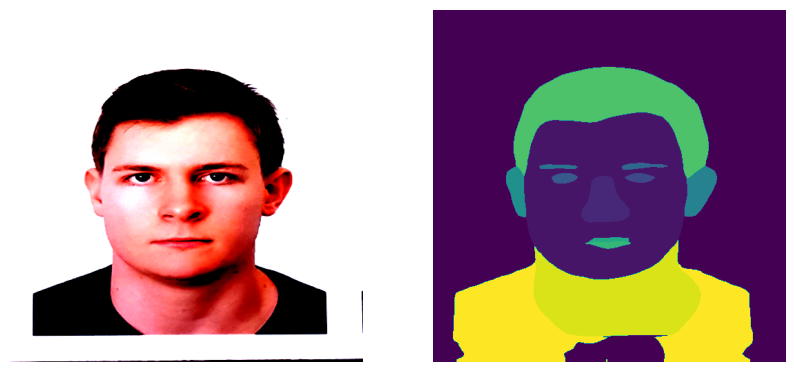

In [31]:
im, pred = predict('20180514_231412.jpg', model)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5), sharey=True)
ax1.axis('off')
ax1.imshow(im)
ax2.axis('off')
ax2.imshow(pred)
plt.show(fig)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


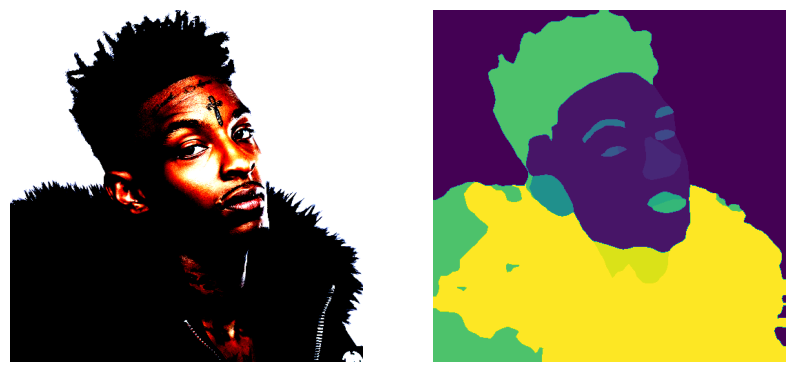

In [26]:
im, pred = predict('21savage.jpg', model)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5), sharey=True)
ax1.axis('off')
ax1.imshow(im)
ax2.axis('off')
ax2.imshow(pred)
plt.show(fig)



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


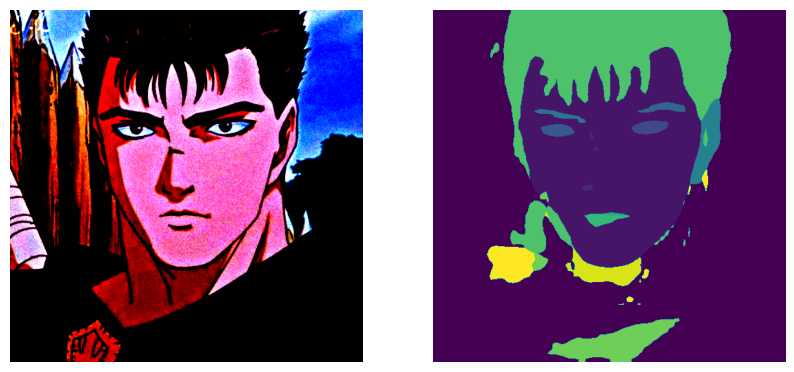

In [30]:
im, pred = predict('guts.jpg', model)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5), sharey=True)
ax1.axis('off')
ax1.imshow(im)
ax2.axis('off')
ax2.imshow(pred)
plt.show(fig)

Do not open

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


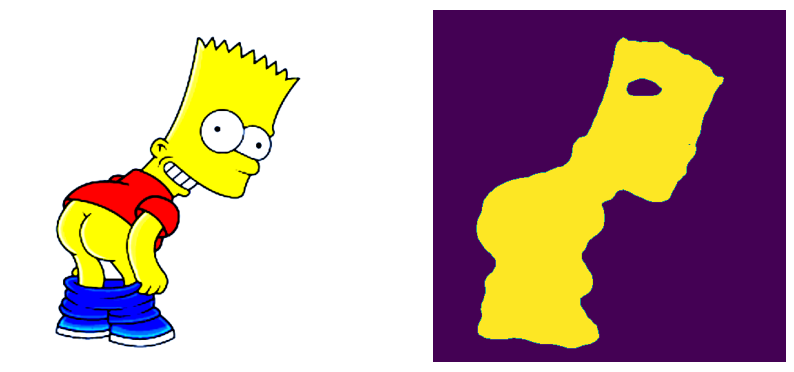

In [28]:
im, pred = predict('bart.png', model)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5), sharey=True)
ax1.axis('off')
ax1.imshow(im)
ax2.axis('off')
ax2.imshow(pred)
plt.show(fig)

## Problem 2. Deep image prior (36 pts)

In the deep prior framework, we aim to learn a prior distribution over the parameters $\theta$ of a generative model such that, given some observation $\hat{y}$, we can sample a plausible output $y$ from the learned prior distribution. The goal is to learn a posterior distribution $p(z,\theta|\hat{y})$ over the latent variable $z$ and the parameters $\theta$ such that, given some observation $\hat{y}$ (e.g., an image of a face), we can sample a plausible latent variable $z$ and generate a corresponding output image $y= f_\theta(z)$ that is similar to the observation. The conditional distribution of $y$ given $\hat{y}$ can be written as an integral over $z$ and $\theta$:

$$p(y|\hat{y}) = \int p(y|z,\theta,\hat{y})p(z,\theta|\hat{y})dzd\theta$$

Unfortunately, in practice, it is difficult to compute this integral exactly, since we don't know the conditional distribution $p(y|z,\theta,\hat{y})$ and the posterior distribution $p(z,\theta|\hat{y})$. Instead, we can use an optimization approach to learn the prior distribution $p(z,\theta)$ and the network $f_\theta(z)$ that best approximate the true conditional distribution.

Specifically, we first assume that the latent variable $z$ is independent of the observation $\hat{y}$, i.e., $p(z,\theta|\hat{y}) = p(\theta|\hat{y})p(z)$. This allows us to rewrite the conditional distribution of $y$ as:

$$p(y|\hat{y}) = \int p(y|z,\theta,\hat{y})p(\theta|\hat{y})p(z)dzd\theta$$

Next, we use an optimization approach to learn the parameters $\theta$ of the network to minimize the expected distance between the generated output $y=f_\theta(z)$ and the observation $\hat{y}$:

$$\min_\theta E(f_\theta(z),\hat{y})$$

To perform this optimization, we can apply a stochastic gradient descent approach where we sample random values of $z$ from the prior distribution $p(z)$ and compute the gradients of the loss function with respect to $\theta$ using backpropagation. This way, we can iteratively update the parameters of the network to improve its ability to generate realistic outputs given the observed data.

This approach is used to perform denoising, inpainting and super resolution. The basic architecture for the task is UNet, which we will use in our experiments.

wandb report https://wandb.ai/darkdestiny/deep%20image%20prior?workspace=user-benchm

## Implementation

In [6]:
import torch
import torch.nn.functional as F
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
import torchvision
from torchvision import transforms
import gdown
from tqdm import tqdm
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from torchmetrics import TotalVariation as TV

In [4]:
class Encoder_Block(torch.nn.Module):
    def __init__(self,inp_channels,out_channels):
        super().__init__()
        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
        )
        self.downsample = torch.nn.MaxPool2d(2)
    def forward(self,x):
        int_out = self.model(x)
        return self.downsample(int_out), int_out

class Decoder_Block(torch.nn.Module):
    def __init__(self,inp_channels,out_channels):
        super().__init__()
        self.upsample = torch.nn.ConvTranspose2d(inp_channels,out_channels,kernel_size=2,stride=2)
        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
        )
    def forward(self,x,enc_x):
        x = self.upsample(x)
        x = torch.cat([x,enc_x],dim=1)
        return self.model(x)

In [5]:
class Unet(torch.nn.Module):
    def __init__(self,inc,outc,hidden_size=16):
        super().__init__()
        self.Encoder = torch.nn.ModuleList([
            Encoder_Block(inc,hidden_size),
            Encoder_Block(hidden_size,hidden_size*2),
            Encoder_Block(hidden_size*2,hidden_size*4),
            Encoder_Block(hidden_size*4,hidden_size*8),
        ])
        self.bottleneck = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size*8,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU(),
            torch.nn.Conv2d(hidden_size*16,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU()
        )
        self.Decoder = torch.nn.ModuleList([
            Decoder_Block(hidden_size*16,hidden_size*8),
            Decoder_Block(hidden_size*8,hidden_size*4),
            Decoder_Block(hidden_size*4,hidden_size*2),
            Decoder_Block(hidden_size*2,hidden_size*1),
        ])
        self.last_layer = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size,outc,kernel_size=3,padding="same"),
            torch.nn.Sigmoid()
        )
    def forward(self,x):
        enc_xs = []
        for module in self.Encoder:
            x, enc_x= module(x)
            enc_xs.append(enc_x)

        enc_xs = enc_xs[::-1]
        x = self.bottleneck(x)

        for i,module in enumerate(self.Decoder):
            x = module(x,enc_xs[i])
        return self.last_layer(x)

In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [41]:
sharing_link = "https://drive.google.com/file/d/1QMZ9_XdFRfj-arUvW_hlG5Mw8vjzTLsU/view?usp=share_link"
gdown.download(url=sharing_link, output="./data.zip", quiet=False, fuzzy=True)
!unzip ./data.zip

Downloading...
From: https://drive.google.com/uc?id=1QMZ9_XdFRfj-arUvW_hlG5Mw8vjzTLsU
To: /homes/markn/trash/data.zip
100%|██████████| 1.60M/1.60M [00:02<00:00, 755kB/s]


Archive:  ./data.zip
   creating: data/
   creating: data/denoising/
  inflating: data/denoising/F16_GT.png  
  inflating: data/denoising/snail.jpg  
   creating: data/inpainting/
  inflating: data/inpainting/kate.png  
  inflating: data/inpainting/kate_mask.png  
  inflating: data/inpainting/library.png  
  inflating: data/inpainting/library_mask.png  
  inflating: data/inpainting/vase.png  
  inflating: data/inpainting/vase_mask.png  


In [7]:
transform = transforms.Compose([
    transforms.ToTensor(),
])

In [8]:
img = transform(Image.open("./data/denoising/F16_GT.png"))[None].to(device)

## Your work starts here

In [9]:
noise_strength = 0.1
corrupted_img = (img + torch.randn_like(img)*noise_strength).clamp(0,1)

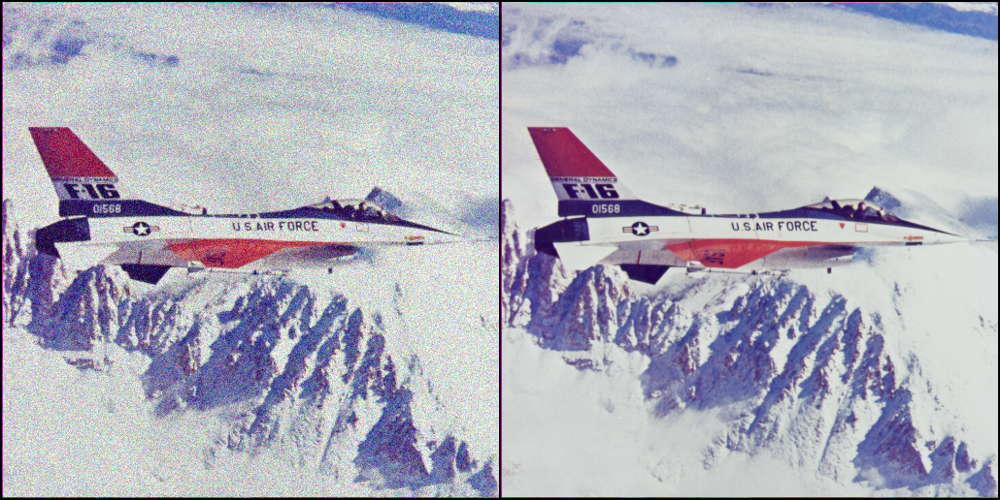

In [10]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img],dim=0),nrow=2,normalize=True))

## Optimization (6 pts)

Task: Implement an optimization function that takes a model, input image, corrupted image, original image, and the number of iterations as arguments.

Steps:

1. Initialize an optimizer (Adam optimizer with learning rate $10^{-4}$).
2. Write a cycle for optimization using the specified loss function (criterion).
3. In each step of the cycle, add a certain amount of noise (reg_noise=0.01) to the input $z$ to ensure computational stability.

**We have provided baseline values for hyperparameters in this and future tasks, but feel free to make adjustments if needed.**

In [11]:
def optimization(model,z,corrupted_img,orig_img,iters,criterion=torch.nn.MSELoss(),reg_noise=0.01):
    optimizer = torch.optim.Adam(params = model.parameters(), lr=1e-4)
    tv = TV()
    total = 0
    model.train()
    for _ in tqdm(range(iters)):
        optimizer.zero_grad()
        z_stable = z + torch.randn_like(z) * reg_noise
        output = model(z_stable)
        loss = criterion(output, corrupted_img)
        loss_orig = criterion(output, orig_img)
        total_variation = tv(output.detach().cpu())
        
        wandb.log(
            {
                'predicted2corrupted loss': loss, 
                'predicted2orig loss': loss_orig,
                'total variation':total_variation
            }
        )
        loss.backward()
        optimizer.step()
    return model
        
    # your code is here

### Run the optimization (6 pts):

1. Start by initializing the UNet model with 32 input channels, 3 output channels, and a hidden size of 16.
2. Create a model input of size (1, 32, img.size(2), img.size(3)) by sampling from a normal distribution with a mean of 0 and standard deviation of 0.1.
3. Train the model for 3000 iterations.
4. Plot the training convergence with the loss computed for both generated and corrupted images.
5. Plot the training convergence with the loss computed for both generated and original images.
6. Visualize the results, including the original image, the corrupted image, and the restored image.
7. Explain obtained results (**Hint: look closely at the plot from step 5**)

In [ ]:
# your code is here
n_iters=3000
wandb.init(project="test_image_prior", name = "no_stopping", tags = ["Unet", "LA"])
model = Unet(inc=32, outc=3, hidden_size=16).to(device)
model_input = (0.1 * torch.randn((1, 32, img.size(2), img.size(3)))).to(device)
model = optimization(
    model=model,
    z=model_input,
    corrupted_img=corrupted_img,
    orig_img=img,
    iters=n_iters
)

wandb.finish()

## Early stopping (3 pts)

One solution to prevent the recurrence of past issues is by terminating the training process at an optimal point. However, determining the ideal number of iterations can be a challenging task. Therefore, your objective is to:

1. Find out appropriate number of iterations (the best reconstruction of original image)
2. Suggest stopping criteria for the denoising task in real case (when you do not know ground truth) (**Hint: use Total Variation metric to measure the amount of noise in the image**)
3. Compare the result of your strategy with found number of iterations in the first step

In [ ]:
# your code is here, find out appropriate number of iterations

In [12]:
def optimization_modified(model,z,corrupted_img,orig_img,iters,criterion=torch.nn.MSELoss(),reg_noise=0.01,frac=0.05, threshold=0.1):
    #duplicate your previous code and stop optimization according to stopping criteria
    optimizer = torch.optim.Adam(params = model.parameters(), lr=1e-4)
    tv = TV()
    total = 0
    model.train()
    min_tv = tv(model(z + torch.randn_like(z)*reg_noise).detach().cpu())
    for _ in tqdm(range(iters)):
        optimizer.zero_grad()
        z_stable = z + torch.randn_like(z) * reg_noise
        output = model(z_stable)
        loss = criterion(output, corrupted_img)
        loss_orig = criterion(output, orig_img)
        total_variation = tv(output.detach().cpu())
        
        min_tv = min(total_variation, min_tv)
        
        wandb.log(
            {
                'predicted2corrupted loss': loss, 
                'predicted2orig loss': loss_orig,
                'total variation':total_variation
            }
        )
        
        if total_variation > (1 + threshold) * min_tv:
            break
        
        loss.backward()
        optimizer.step()
        
    return model, loss_orig #return best loss_orig

  0%|          | 0/3000 [00:00<?, ?it/s]

wandb: ERROR Dropped streaming file chunk (see wandb/debug-internal.log)
wandb: ERROR Dropped streaming file chunk (see wandb/debug-internal.log)
wandb: ERROR Dropped streaming file chunk (see wandb/debug-internal.log)
wandb: ERROR Dropped streaming file chunk (see wandb/debug-internal.log)
wandb: ERROR Dropped streaming file chunk (see wandb/debug-internal.log)
wandb: ERROR Dropped streaming file chunk (see wandb/debug-internal.log)
wandb: ERROR Dropped streaming file chunk (see wandb/debug-internal.log)
wandb: ERROR Dropped streaming file chunk (see wandb/debug-internal.log)
wandb: ERROR Dropped streaming file chunk (see wandb/debug-internal.log)
wandb: ERROR Dropped streaming file chunk (see wandb/debug-internal.log)
wandb: ERROR Dropped streaming file chunk (see wandb/debug-internal.log)
wandb: ERROR Dropped streaming file chunk (see wandb/debug-internal.log)
wandb: ERROR Dropped streaming file chunk (see wandb/debug-internal.log)


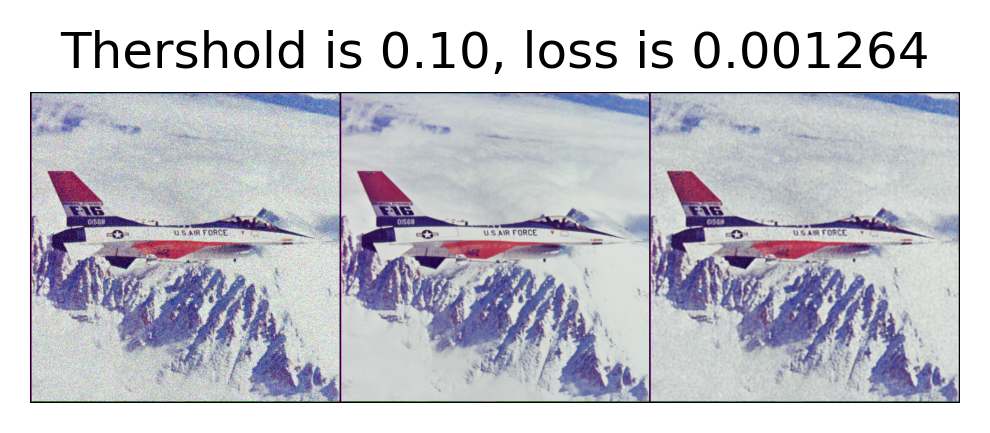

predicted2corrupted loss,█▇▅▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
predicted2orig loss,█▇▅▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
total variation,█▇▆▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
predicted2corrupted loss,0.00966
predicted2orig loss,0.00126
total variation,40091.375


  0%|          | 0/3000 [00:00<?, ?it/s]

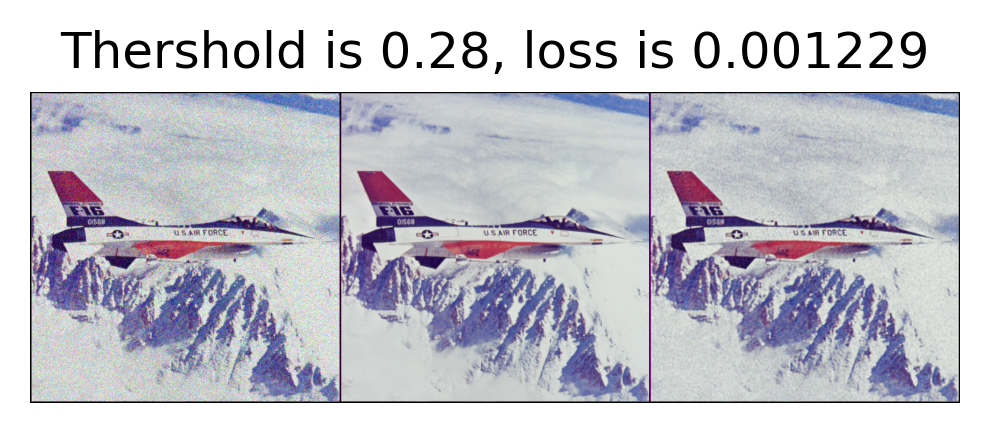

predicted2corrupted loss,█▇▅▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
predicted2orig loss,█▇▅▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
total variation,█▇▄▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂
predicted2corrupted loss,0.00955
predicted2orig loss,0.00123
total variation,40209.10547


  0%|          | 0/3000 [00:00<?, ?it/s]

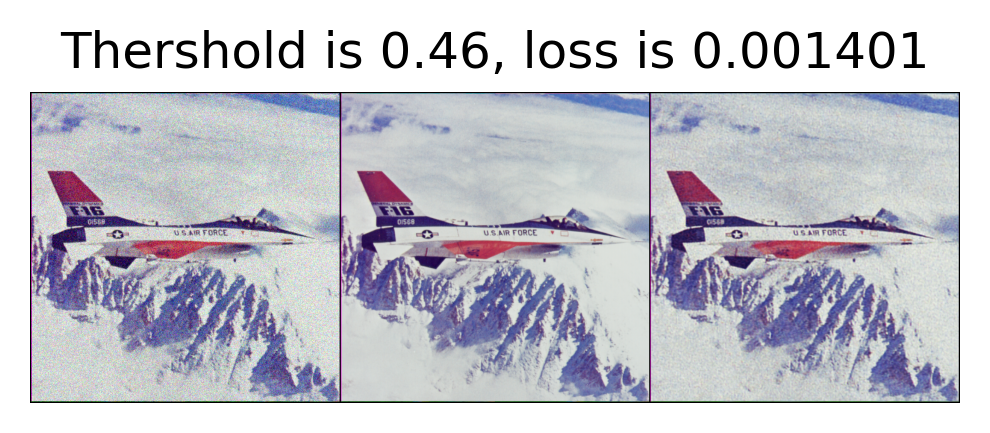

predicted2corrupted loss,█▆▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
predicted2orig loss,█▆▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
total variation,█▆▄▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂
predicted2corrupted loss,0.00909
predicted2orig loss,0.0014
total variation,48682.60938


  0%|          | 0/3000 [00:00<?, ?it/s]

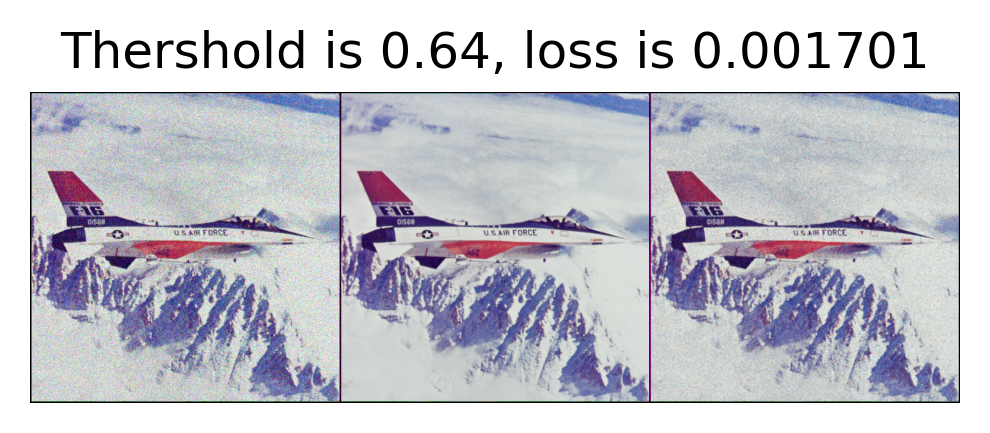

predicted2corrupted loss,█▅▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
predicted2orig loss,█▅▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
total variation,█▆▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▃
predicted2corrupted loss,0.00847
predicted2orig loss,0.0017
total variation,58270.66797


  0%|          | 0/3000 [00:00<?, ?it/s]

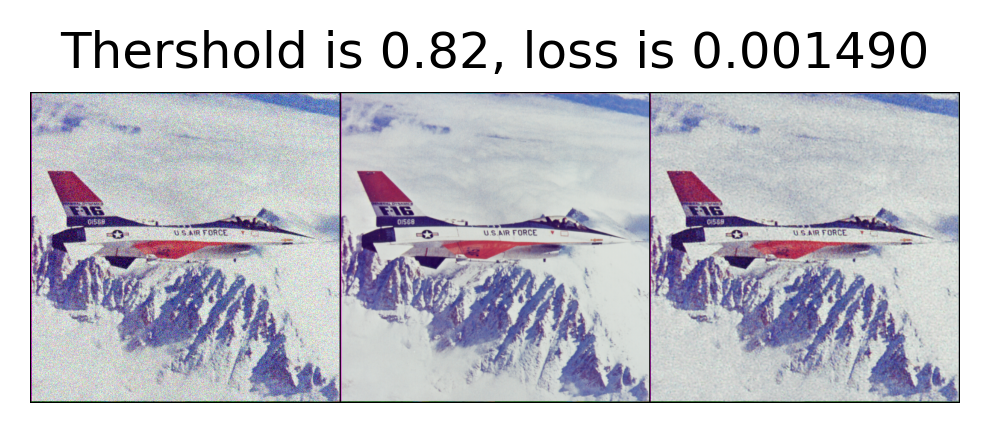

predicted2corrupted loss,█▅▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
predicted2orig loss,█▅▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
total variation,█▅▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▃▃
predicted2corrupted loss,0.00866
predicted2orig loss,0.00149
total variation,51538.35938


  0%|          | 0/3000 [00:00<?, ?it/s]

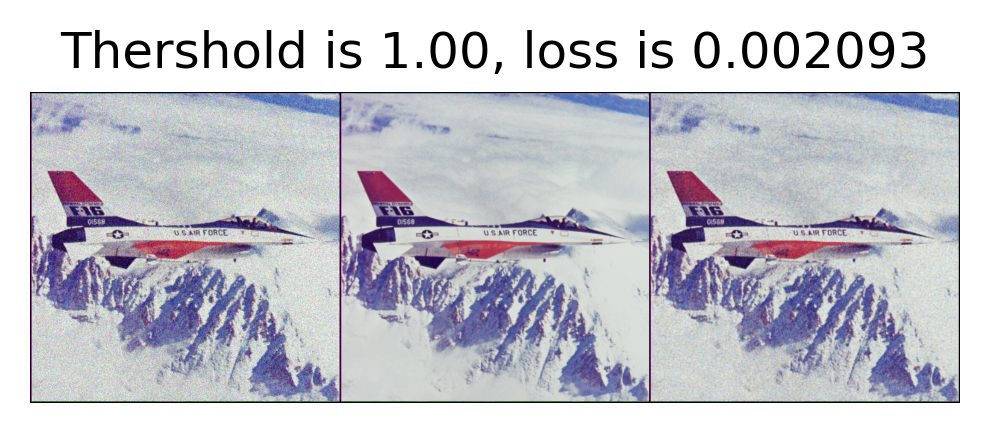

predicted2corrupted loss,█▆▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
predicted2orig loss,█▆▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
total variation,█▇▄▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄
predicted2corrupted loss,0.00795
predicted2orig loss,0.00209
total variation,68654.17969


In [35]:
n_iters=3000

for th in np.linspace(0.1, 1, 6):
    model = Unet(inc=32, outc=3, hidden_size=16).to(device)
    model_input = (0.1 * torch.randn((1, 32, img.size(2), img.size(3)))).to(device)
    wandb.init(project="deep image prior", name = f"early stop, th {th:.3f}")
    cur_model, cur_loss = optimization_modified(
        model=model,
        z=model_input,
        corrupted_img=corrupted_img,
        orig_img=img,
        iters=n_iters,
        threshold=th
    )
    plt.figure(figsize=(4,2), dpi=300)
    results = transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,model(model_input)],dim=0),nrow=3,normalize=True))
    plt.imshow(results)
    plt.title(f'Thershold is {th:.2f}, loss is {cur_loss:.6f}')
    plt.axis('off')
    plt.show();
    
    wandb.finish()

## Stochastic gradient Langevin dynamics (SGLD) optimization 

Another way to solve the problem of increasing the loss function over iterations is to adopt optimization procedure. In the explanations above we have already mentioned that the goal of deep prior is to evaluate the integral:

$$p(y|\hat{y}) = \int p(y|z,\theta,\hat{y})p(\theta|\hat{y})p(z)dzd\theta$$

Instead of directly solving the integral, we can use the Markov chain Monte Carlo (MCMC) method to estimate the posterior. This involves generating a sequence of correlated samples from the target distribution, which can converge to the true posterior during iterations. However, the MCMC approach can be slow and inefficient, and hence, using gradient-based optimization with noise can be a more effective solution. This involves minimizing the objective function and introducing noise to the gradient updates:

$$\theta_{i+1} = \theta_{i} + \mathrm{lr}\cdot\Delta_{i}^{\mathrm{standard}} + s\cdot\mathrm{lr}\cdot\epsilon$$

where $\Delta_{i}^{\mathrm{standard}}$ standard optimization update, $\mathrm{lr}$ - learning rate, $\epsilon \sim N(0,1)$, $s$ - strength of added noise.

More details of how and why it works described in [paper](https://arxiv.org/pdf/1904.07457.pdf)

### Implement SGLD (5 pts)

1. Take the previous implementation of the optimization procedure and adjust it to add noise to the model parameters after each iteration, but **only for convolutional layers**.
2. Set the strength of added noise to 4.
3. Plot the training convergence with the loss computed for generated and corrupted images.
4. Plot the training convergence with the loss computed for generated and original images.
5. Analyze and explain the results in comparison to the Early Stopping approach.
6. Try different values for the strength of added noise $s$ and comment the results.

In [13]:
from itertools import chain


def SGLD(model,z,corrupted_img,orig_img,iters,criterion=torch.nn.MSELoss(), lr=1e-4, reg_noise=0.01, noise_strength=4):
    # your code is here
    optimizer = torch.optim.Adam(params = model.parameters())
    tv = TV()
    model.train()
    for iter in tqdm(range(iters)):
        optimizer.zero_grad()
        z_stable = z + torch.randn_like(z) * reg_noise
        output = model(z_stable)
        loss = criterion(output, corrupted_img)
        loss_orig = criterion(output, orig_img)
        total_variation = tv(output.detach().cpu())
        
        wandb.log(
            {
                'predicted2corrupted loss': loss, 
                'predicted2orig loss': loss_orig,
                'total variation':total_variation
            }
        )
        loss.backward()
        optimizer.step()
        
        with torch.no_grad():
            for layer in chain(model.last_layer, model.bottleneck):
                if isinstance(layer, torch.nn.modules.conv.Conv2d):
                    layer.weight += torch.nn.Parameter(lr * noise_strength * torch.randn_like(layer.weight))
                    
            for block in chain(model.Encoder, model.Decoder):
                for layer in block.model:
                    if isinstance(layer, torch.nn.modules.conv.Conv2d):
                        layer.weight += torch.nn.Parameter(lr * noise_strength * torch.randn_like(layer.weight))
                        

    return model
    

predicted2corrupted loss,▁
predicted2orig loss,▁
total variation,▁
predicted2corrupted loss,0.093
predicted2orig loss,0.08421
total variation,146760.70312


  0%|          | 0/3000 [00:00<?, ?it/s]

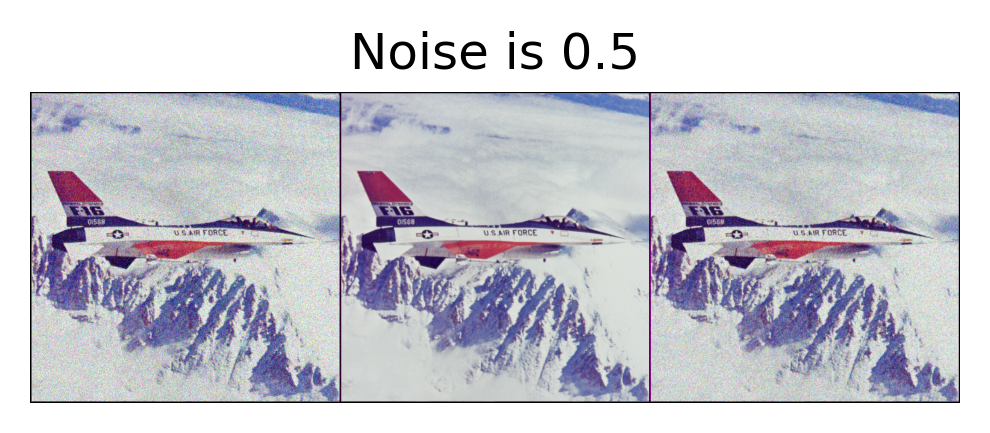

predicted2corrupted loss,█▆▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
predicted2orig loss,█▃▁▁▁▁▂▂▂▃▃▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇
total variation,▁▁▁▂▂▂▃▃▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇██████████████
predicted2corrupted loss,0.00366
predicted2orig loss,0.00617
total variation,141399.0625


  0%|          | 0/3000 [00:00<?, ?it/s]

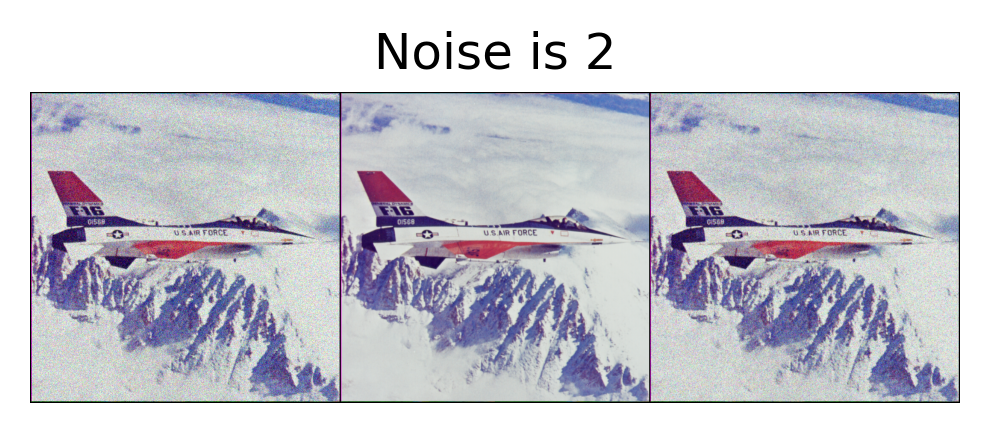

predicted2corrupted loss,█▅▅▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
predicted2orig loss,█▃▂▁▁▁▂▂▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇
total variation,▁▁▁▂▂▂▃▄▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇███████████████
predicted2corrupted loss,0.00361
predicted2orig loss,0.00621
total variation,141882.15625


  0%|          | 0/3000 [00:00<?, ?it/s]

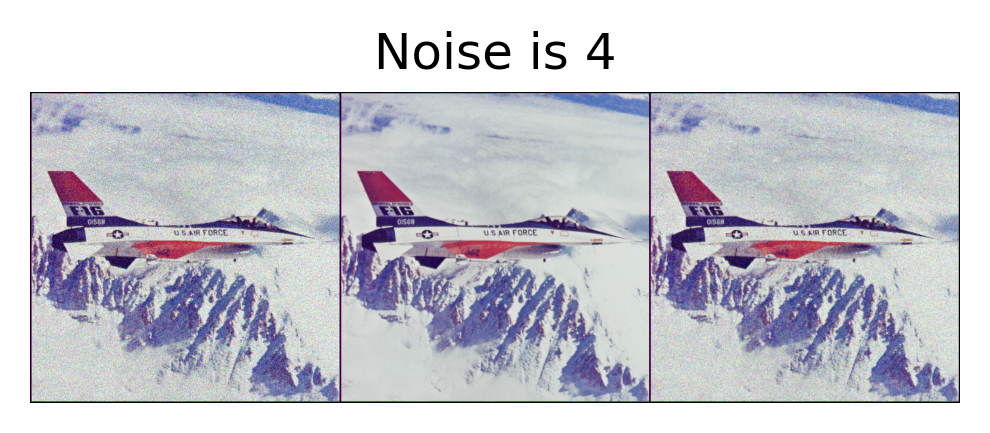

predicted2corrupted loss,█▆▅▄▄▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
predicted2orig loss,█▃▂▁▁▁▁▁▂▂▂▃▃▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆
total variation,▁▁▁▁▁▂▂▂▃▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇█████████████
predicted2corrupted loss,0.00388
predicted2orig loss,0.00596
total variation,139364.03125


  0%|          | 0/3000 [00:00<?, ?it/s]

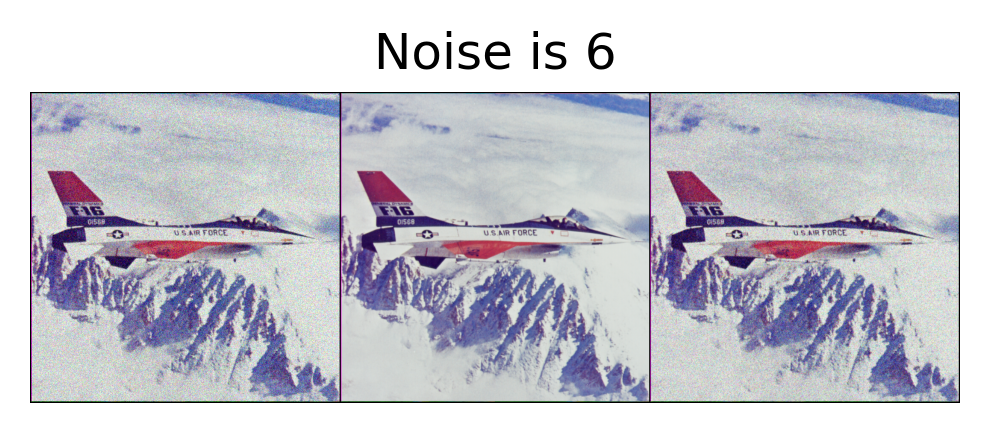

predicted2corrupted loss,█▆▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
predicted2orig loss,█▃▂▁▁▁▁▂▂▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇
total variation,▁▁▁▁▂▂▂▃▃▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇█████████████
predicted2corrupted loss,0.0039
predicted2orig loss,0.00602
total variation,139102.625


  0%|          | 0/3000 [00:00<?, ?it/s]

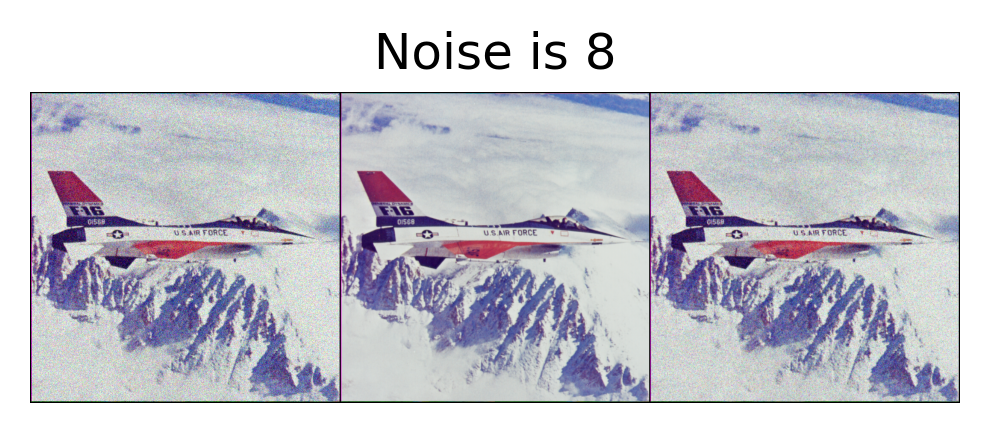

predicted2corrupted loss,█▅▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
predicted2orig loss,█▃▂▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▅▅▅▅▅
total variation,▁▁▁▁▂▂▂▂▃▃▃▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇██████████
predicted2corrupted loss,0.0042
predicted2orig loss,0.00559
total variation,134220.29688


In [90]:
n_iters = 3000
for noise_strength in [0.5, 2, 4, 6, 8]:
    model = Unet(inc=32, outc=3, hidden_size=16).to(device)
    model_input = (0.1 * torch.randn((1, 32, img.size(2), img.size(3)))).to(device)
    wandb.init(project="deep image prior", name = f"SGLD, noise strength {noise_strength}")
    
    model = SGLD(
        model=model,
        z=model_input,
        corrupted_img=corrupted_img,
        orig_img=img,
        iters=n_iters,
        noise_strength=noise_strength
    )
    plt.figure(figsize=(4,2), dpi=300)
    results = transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,model(model_input)],dim=0),nrow=3,normalize=True))
    plt.imshow(results)
    plt.title(f'Noise is {noise_strength}')
    plt.axis('off')
    plt.show();
    
    wandb.finish()
    

From the graphs it looks like early stopping works a lot better.

## Inpainting

Deep Image Prior is a versatile tool that can be utilized in solving an important task such as image inpainting. In this task, the challenge lies in the inability to obtain values for the pixels that are damaged and defined by the mask. Thus, during the training process, it is essential to apply the mask to the generated image as these values are unavailable for this particular task. Furthermore, in order to effectively address this issue, you will try a more complex model called AttentionUNet. This model is similar to the UNet model in terms of structure but with the inclusion of attention blocks in the decoder part. 

### Attention block (10 pts)

For AttentionUNet implementation you only need to implement Attention layer. Attention should scale hidden output of encoder block which is also an input for the corresponding decoder block in order to draw more "attention" to particular image parts. Below we have placed the pipeline which you should implement:

**Input:** $skip$ of size [batch,skip_channels,H_skip,W_skip], $x$ of size [batch,x_channels,H_x,W_x]

**Output:** $skip^*$ of size [batch,skip_channels,H_skip,W_skip]

1. Apply 2d convolution with kernel size $2$ to $skip$ to make it of size [batch,skip_channels,H_x,W_x] (recall that 2H_x = H_skip, 2W_x = W_skip)
2. Apply 2d convolution with kernel size $1$ to $x$ to make it of size [batch,skip_channels,H_x,W_x]
3. Sum the outputs of previous two steps and apply ReLU over it.
4. Apply 2d convolution to previous output to reduce channel dimension to 1. So the output should have size equal [batch,1,H_x,W_x]
5. Apply Sigmoid to the previous output to get attention itself
6. Apply attention to the input $skip$ (original block input **NOT** the output of the first step) by simply multipling $skip$ by attention element-wise.

In [26]:
class Attention(torch.nn.Module):
    def __init__(self,skip_channels, x_channels):
        super().__init__()
        # your code is here
        self.skip_conv = torch.nn.Conv2d(skip_channels,skip_channels,kernel_size=2,stride=2)
        self.x_conv = torch.nn.Conv2d(x_channels,skip_channels,kernel_size=1)
        self.reduce = torch.nn.Conv2d(skip_channels,1,kernel_size=1)
        self.upsample = torch.nn.ConvTranspose2d(1,1,kernel_size=2,stride=2)
        
    def forward(self,skip,x):
        # your code is here
        skip_p = self.skip_conv(skip)
        x = self.x_conv(x)
        res = F.relu(skip_p + x)
        res = self.reduce(res)
        attention = F.sigmoid(res)
        attention = self.upsample(attention)
        return skip * attention

In [27]:
class Decoder_Block_With_Attention(torch.nn.Module):
    def __init__(self,inp_channels,out_channels):
        super().__init__()
        self.upsample = torch.nn.ConvTranspose2d(inp_channels,out_channels,kernel_size=2,stride=2)
        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
        )
        self.attention = Attention(out_channels,inp_channels)
    def forward(self,x,enc_x):
        enc_x = self.attention(enc_x,x)
        x = self.upsample(x)
        x = torch.cat([x,enc_x],dim=1)
        return self.model(x)


class AttentionUnet(torch.nn.Module):
    def __init__(self,inc,outc,hidden_size=16):
        super().__init__()
        self.Encoder = torch.nn.ModuleList([
            Encoder_Block(inc,hidden_size),
            Encoder_Block(hidden_size,hidden_size*2),
            Encoder_Block(hidden_size*2,hidden_size*4),
            Encoder_Block(hidden_size*4,hidden_size*8),
        ])
        self.bottleneck = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size*8,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU(),
            torch.nn.Conv2d(hidden_size*16,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU()
        )
        self.Decoder = torch.nn.ModuleList([
            Decoder_Block_With_Attention(hidden_size*16,hidden_size*8),
            Decoder_Block_With_Attention(hidden_size*8,hidden_size*4),
            Decoder_Block_With_Attention(hidden_size*4,hidden_size*2),
            Decoder_Block_With_Attention(hidden_size*2,hidden_size*1),
        ])
        self.last_layer = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size,outc,kernel_size=3,padding="same"),
            torch.nn.Sigmoid()
        )
    def forward(self,x):
        enc_xs = []
        for module in self.Encoder:
            x, enc_x= module(x)
            enc_xs.append(enc_x)

        enc_xs = enc_xs[::-1]
        x = self.bottleneck(x)

        for i,module in enumerate(self.Decoder):
            x = module(x,enc_xs[i])
        return self.last_layer(x)

In [16]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.ToTensor()
])

In [17]:
img = transform(Image.open("./data/inpainting/library.png"))[None].to(device)
img_mask = transform(Image.open("./data/inpainting/library_mask.png"))[None].to(device)
corrupted_img = img * img_mask

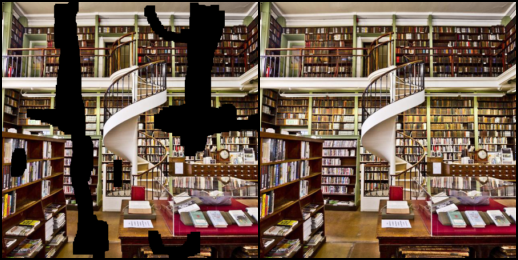

In [18]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img],dim=0),nrow=2,normalize=True))

### Modify SGLD optimization (6 pts):
1. Take the code for SGLD and update loss calculation by applying mask to generated image (take $s$ = 4, lr = $4 \cdot 10^{-4}$, reg_noise = $0.2$, iters=$2000$)
2. Run the code and evaluate how well model fitted to known pixels and restore the missed one
3. Run the same code with standard UNet model and compare results with AttentionUNet. What conclusion can you make?


**Bonus task (4 pts)** Try to find optimal hyper parameters (strength of added noise $s$, learning rate, reg_noise, number of iterations)

In [19]:
from itertools import chain


def optimization_inpainting(model,z,corrupted_img, mask, orig_img,iters,criterion=torch.nn.MSELoss(), lr=4e-4, reg_noise=0.2, noise_strength=4):
    # your code is here
    optimizer = torch.optim.Adam(lr=lr, params = model.parameters())
    tv = TV()
    model.train()
    for _ in tqdm(range(iters)):
        optimizer.zero_grad()
        z_stable = z + torch.randn_like(z) * reg_noise
        output = model(z_stable)
        loss = criterion(output * mask, corrupted_img)
        loss_orig = criterion(output * mask, orig_img)
        total_variation = tv(output.detach().cpu())
        
        wandb.log(
            {
                'predicted2corrupted loss': loss, 
                'predicted2orig loss': loss_orig,
                'total variation':total_variation
            }
        )
        loss.backward()
        optimizer.step()
        
        with torch.no_grad():
            for layer in chain(model.last_layer, model.bottleneck):
                if isinstance(layer, torch.nn.modules.conv.Conv2d):
                    layer.weight += torch.nn.Parameter(lr * noise_strength * torch.randn_like(layer.weight))
                    
            for block in chain(model.Encoder, model.Decoder):
                for layer in block.model:
                    if isinstance(layer, torch.nn.modules.conv.Conv2d):
                        layer.weight += torch.nn.Parameter(lr * noise_strength * torch.randn_like(layer.weight))
                        

    return model
    

In [20]:
nc = 2
model_without_attention = Unet(nc,3,hidden_size=16).to(device)
z = torch.cat(torch.meshgrid(torch.arange(img.size(2))/img.size(2),torch.arange(img.size(3))/img.size(3))).reshape(1,2,img.size(2),img.size(3)).to(device)

/homes/markn/miniconda3/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [23]:
# your code is here
n_iters=2000
wandb.init(project="deep image prior", name = "without attention")

model = optimization_inpainting(
    model_without_attention,
    z,
    corrupted_img,
    img_mask,
    img,
    n_iters
)
wandb.finish()

100%|██████████| 2000/2000 [00:47<00:00, 42.18it/s]


predicted2corrupted loss,█▅▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
predicted2orig loss,█▅▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
total variation,▄▁▂▃▄▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇██▇█████████
predicted2corrupted loss,0.00195
predicted2orig loss,0.05265
total variation,26200.05469


without attention


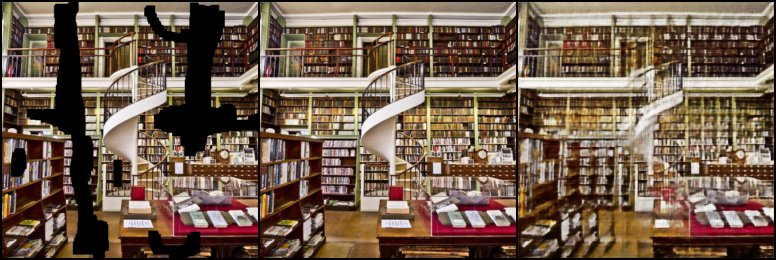

In [35]:
print('without attention')
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,model_without_attention(z)],dim=0),nrow=3,normalize=True))

In [28]:
nc = 2
model_with_attention = AttentionUnet(nc,3,hidden_size=16).to(device)
z = torch.cat(torch.meshgrid(torch.arange(img.size(2))/img.size(2),torch.arange(img.size(3))/img.size(3))).reshape(1,2,img.size(2),img.size(3)).to(device)

In [29]:
# your code# your code is here
n_iters=2000
wandb.init(project="deep image prior", name = "with attention")

model = optimization_inpainting(
    model_with_attention,
    z,
    corrupted_img,
    img_mask,
    img,
    n_iters
)
wandb.finish()

100%|██████████| 2000/2000 [00:50<00:00, 39.99it/s]


predicted2corrupted loss,█▅▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
predicted2orig loss,█▅▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
total variation,▂▁▂▃▅▅▅▆▆▆▇▆▇▇▇▇▇▇▇█████████▇███████████
predicted2corrupted loss,0.00187
predicted2orig loss,0.05256
total variation,26884.73438


NameError: name 'here' is not defined

with attention


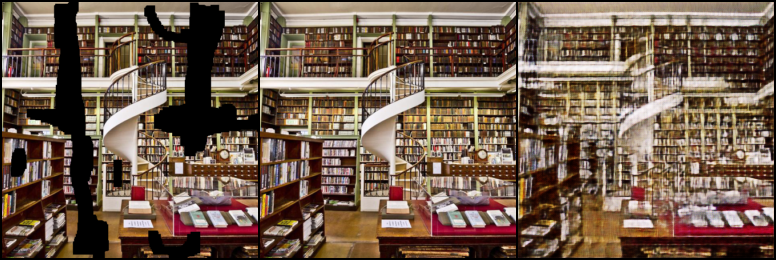

In [34]:
print('with attention')
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,model_with_attention(z)],dim=0),nrow=3,normalize=True))

It seems that UNet with attention works better from human perspective, it does less copying of existing parts on image (check top columns, there are 4 for model with attention and 6 for model without)

## Problem 3. Natural language generation (35 pts)

This problem requires uploading two csv files along with the solution notebook. Please compress these three files in zip archive and upload it in Canvas. 

Natural language generation (NLG) is a well-known research problem concerned with generating textual descriptions of structured data, such as tables, as output. Compared to machine translation, where the goal is to completely convert an input sentence into another language, NLG requires overcoming two different challenges: deciding what to say, by selecting a relevant subset of the input data to describe, and deciding how to say it, by generating text that flows and reads naturally. 

In this task you will need to generate table descriptions and titles for the dataset that can be downloaded from the [link](https://box.skoltech.ru/index.php/s/DRfJFNUJMgmLxOU). Your inference pipeline should receive `.csv` and output 2 strings: table description `text` and table title `title`.

As the solution to this task you shoud complete `submission.csv` and `submission_reranking.csv` files as below and report the link on your finetuned checkpoints.

In [1]:
import numpy as np
import torch
from torch.utils.data import Dataset as torchDataset
from torch.utils.data import DataLoader

from tqdm import tqdm

from sklearn.model_selection import train_test_split

from datasets import Dataset
from transformers import T5Tokenizer, T5ForConditionalGeneration, DataCollatorForSeq2Seq, Seq2SeqTrainingArguments, Seq2SeqTrainer
from evaluate import load

import random

In [17]:
!unzip dataset_nlg_v1.zip

Archive:  dataset_nlg_v1.zip
   creating: dataset_nlg_v1/
  inflating: dataset_nlg_v1/submission.csv  
  inflating: dataset_nlg_v1/train.csv  
   creating: dataset_nlg_v1/data/
  inflating: dataset_nlg_v1/data/3766495849147595715.csv  
  inflating: dataset_nlg_v1/data/200167954882832705.csv  
  inflating: dataset_nlg_v1/data/2532839699093929418.csv  
  inflating: dataset_nlg_v1/data/223685202391993.csv  
  inflating: dataset_nlg_v1/data/5131516056032712157.csv  
  inflating: dataset_nlg_v1/data/1083533650446496486.csv  
  inflating: dataset_nlg_v1/data/6471009070010613240.csv  
  inflating: dataset_nlg_v1/data/15795221668938836363.csv  
  inflating: dataset_nlg_v1/data/223685202391355.csv  
  inflating: dataset_nlg_v1/data/223685202390188.csv  
  inflating: dataset_nlg_v1/data/3557995981046745228.csv  
  inflating: dataset_nlg_v1/data/223685202390007.csv  
  inflating: dataset_nlg_v1/data/5726817563646473934.csv  
  inflating: dataset_nlg_v1/data/4386875441576844325.csv  
  inflating: 

  inflating: dataset_nlg_v1/data/223685202386292.csv  
  inflating: dataset_nlg_v1/data/223685202386891.csv  
  inflating: dataset_nlg_v1/data/223685202396320.csv  
  inflating: dataset_nlg_v1/data/4210985328709335277.csv  
  inflating: dataset_nlg_v1/data/12515584110031614733.csv  
  inflating: dataset_nlg_v1/data/5826626609143310303.csv  
  inflating: dataset_nlg_v1/data/13987989583479770604.csv  
  inflating: dataset_nlg_v1/data/11972878267224365892.csv  
  inflating: dataset_nlg_v1/data/10816835547246812932.csv  
  inflating: dataset_nlg_v1/data/223685202395211.csv  
  inflating: dataset_nlg_v1/data/10540450313683908306.csv  
  inflating: dataset_nlg_v1/data/15500372305516657617.csv  
  inflating: dataset_nlg_v1/data/223685202395492.csv  
  inflating: dataset_nlg_v1/data/8424511960529418639.csv  
  inflating: dataset_nlg_v1/data/850022567551687835.csv  
  inflating: dataset_nlg_v1/data/9993698288051546619.csv  
  inflating: dataset_nlg_v1/data/845394863681784192.csv  
  inflating: 

  inflating: dataset_nlg_v1/data/223685202389324.csv  
  inflating: dataset_nlg_v1/data/6299708645854416980.csv  
  inflating: dataset_nlg_v1/data/9896183795188479192.csv  
  inflating: dataset_nlg_v1/data/10186371811090490161.csv  
 extracting: dataset_nlg_v1/data/4078181683428009334.csv  
  inflating: dataset_nlg_v1/data/9464076405253894765.csv  
  inflating: dataset_nlg_v1/data/5679268204168096710.csv  
  inflating: dataset_nlg_v1/data/9858098134372641665.csv  
  inflating: dataset_nlg_v1/data/18205378878065151938.csv  
  inflating: dataset_nlg_v1/data/223685202396001.csv  
  inflating: dataset_nlg_v1/data/14129531453060353875.csv  
  inflating: dataset_nlg_v1/data/223685202396326.csv  
  inflating: dataset_nlg_v1/data/223685202395793.csv  
  inflating: dataset_nlg_v1/data/13203945513218597794.csv  
  inflating: dataset_nlg_v1/data/3327471555243027055.csv  
  inflating: dataset_nlg_v1/data/1323810406628417453.csv  
  inflating: dataset_nlg_v1/data/223685202387931.csv  
  inflating: 

  inflating: dataset_nlg_v1/data/1592199313549801532.csv  
  inflating: dataset_nlg_v1/data/223685202388564.csv  
  inflating: dataset_nlg_v1/data/223685202389164.csv  
  inflating: dataset_nlg_v1/data/223685202386607.csv  
  inflating: dataset_nlg_v1/data/15347514981726747805.csv  
  inflating: dataset_nlg_v1/data/223685202389906.csv  
  inflating: dataset_nlg_v1/data/17489260948284347390.csv  
  inflating: dataset_nlg_v1/data/4376227616196435109.csv  
  inflating: dataset_nlg_v1/data/223685202390107.csv  
  inflating: dataset_nlg_v1/data/9978018816374402187.csv  
  inflating: dataset_nlg_v1/data/223685202388009.csv  
  inflating: dataset_nlg_v1/data/7450660242684605209.csv  
  inflating: dataset_nlg_v1/data/11659400525087561214.csv  
  inflating: dataset_nlg_v1/data/223685202392760.csv  
  inflating: dataset_nlg_v1/data/223685202386163.csv  
  inflating: dataset_nlg_v1/data/9519581270652519793.csv  
  inflating: dataset_nlg_v1/data/223685202392742.csv  
  inflating: dataset_nlg_v1/da

  inflating: dataset_nlg_v1/data/13150730962278831040.csv  
  inflating: dataset_nlg_v1/data/4483172212599510095.csv  
  inflating: dataset_nlg_v1/data/12913821627440809521.csv  
  inflating: dataset_nlg_v1/data/223685202386089.csv  
  inflating: dataset_nlg_v1/data/223685202395363.csv  
  inflating: dataset_nlg_v1/data/8774939565938334786.csv  
  inflating: dataset_nlg_v1/data/14189967399979120464.csv  
  inflating: dataset_nlg_v1/data/177553254937731303.csv  
  inflating: dataset_nlg_v1/data/14876156844092352185.csv  
  inflating: dataset_nlg_v1/data/223685202391938.csv  
 extracting: dataset_nlg_v1/data/1927733627190645516.csv  
  inflating: dataset_nlg_v1/data/4997992986355738484.csv  
  inflating: dataset_nlg_v1/data/4358029755153510039.csv  
  inflating: dataset_nlg_v1/data/2148352244071853939.csv  
  inflating: dataset_nlg_v1/data/12027524123515802291.csv  
  inflating: dataset_nlg_v1/data/3549085285114537448.csv  
  inflating: dataset_nlg_v1/data/12154990356824986408.csv  
  in

  inflating: dataset_nlg_v1/data/223685202385999.csv  
  inflating: dataset_nlg_v1/data/223685202390707.csv  
  inflating: dataset_nlg_v1/data/7543436074106981037.csv  
  inflating: dataset_nlg_v1/data/16972360452287905947.csv  
  inflating: dataset_nlg_v1/data/13869876172850291391.csv  
  inflating: dataset_nlg_v1/data/223685202392943.csv  
  inflating: dataset_nlg_v1/data/13299762415098762137.csv  
  inflating: dataset_nlg_v1/data/8658740283606950150.csv  
  inflating: dataset_nlg_v1/data/17819817297263770918.csv  
  inflating: dataset_nlg_v1/data/223685202389143.csv  
  inflating: dataset_nlg_v1/data/223685202387607.csv  
  inflating: dataset_nlg_v1/data/223685202388106.csv  
  inflating: dataset_nlg_v1/data/16161062377529065585.csv  
  inflating: dataset_nlg_v1/data/2763574016912047018.csv  
  inflating: dataset_nlg_v1/data/223685202392998.csv  
  inflating: dataset_nlg_v1/data/1550575845499681999.csv  
  inflating: dataset_nlg_v1/data/15315641152585479300.csv  
  inflating: datase

  inflating: dataset_nlg_v1/data/253621006435284203.csv  
  inflating: dataset_nlg_v1/data/223685202386587.csv  
  inflating: dataset_nlg_v1/data/15563741521252573961.csv  
  inflating: dataset_nlg_v1/data/14971417671953352285.csv  
  inflating: dataset_nlg_v1/data/223685202395980.csv  
  inflating: dataset_nlg_v1/data/15948116083545881248.csv  
  inflating: dataset_nlg_v1/data/509040123873512658.csv  
  inflating: dataset_nlg_v1/data/4975341769965180289.csv  
  inflating: dataset_nlg_v1/data/223685202391681.csv  
  inflating: dataset_nlg_v1/data/4482809138625030714.csv  
  inflating: dataset_nlg_v1/data/6053665212165164922.csv  
  inflating: dataset_nlg_v1/data/11214640583472084819.csv  
  inflating: dataset_nlg_v1/data/12694101779606930873.csv  
  inflating: dataset_nlg_v1/data/1649411869449014824.csv  
  inflating: dataset_nlg_v1/data/18242852802946768087.csv  
  inflating: dataset_nlg_v1/data/223685202388621.csv  
  inflating: dataset_nlg_v1/data/11433676954665366801.csv  
  inflat

  inflating: dataset_nlg_v1/data/359614595164465769.csv  
  inflating: dataset_nlg_v1/data/1114554614734080277.csv  
  inflating: dataset_nlg_v1/data/223685202390433.csv  
  inflating: dataset_nlg_v1/data/15045395060175719922.csv  
  inflating: dataset_nlg_v1/data/17241450179123052521.csv  
 extracting: dataset_nlg_v1/data/223685202387683.csv  
  inflating: dataset_nlg_v1/data/223685202389575.csv  
  inflating: dataset_nlg_v1/data/13259116232969011695.csv  
  inflating: dataset_nlg_v1/data/6223786827433617858.csv  
  inflating: dataset_nlg_v1/data/223685202393716.csv  
  inflating: dataset_nlg_v1/data/223685202387422.csv  
  inflating: dataset_nlg_v1/data/1084881021211082590.csv  
  inflating: dataset_nlg_v1/data/223685202386836.csv  
  inflating: dataset_nlg_v1/data/2380763270234002493.csv  
  inflating: dataset_nlg_v1/data/14910542768518571050.csv  
  inflating: dataset_nlg_v1/data/16207059354516492870.csv  
  inflating: dataset_nlg_v1/data/6643685708118688570.csv  
  inflating: data

  inflating: dataset_nlg_v1/data/3898933204453414442.csv  
  inflating: dataset_nlg_v1/data/510265829531480555.csv  
  inflating: dataset_nlg_v1/data/10877930543218622635.csv  
  inflating: dataset_nlg_v1/data/4710240046206224744.csv  
  inflating: dataset_nlg_v1/data/223685202389140.csv  
  inflating: dataset_nlg_v1/data/18067803887429974452.csv  
  inflating: dataset_nlg_v1/data/223685202391104.csv  
  inflating: dataset_nlg_v1/data/6854657530706567640.csv  
  inflating: dataset_nlg_v1/data/8603686399993263162.csv  
  inflating: dataset_nlg_v1/data/4524389284306679685.csv  
  inflating: dataset_nlg_v1/data/17131997739204525629.csv  
  inflating: dataset_nlg_v1/data/3190842095777315500.csv  
  inflating: dataset_nlg_v1/data/1683766983725894957.csv  
 extracting: dataset_nlg_v1/data/409104343671396876.csv  
  inflating: dataset_nlg_v1/data/223685202389584.csv  
  inflating: dataset_nlg_v1/data/10103099922520467579.csv  
  inflating: dataset_nlg_v1/data/10164322235370212782.csv  
  infl

  inflating: dataset_nlg_v1/data/223685202396161.csv  
  inflating: dataset_nlg_v1/data/7291980941502257366.csv  
  inflating: dataset_nlg_v1/data/14946793512278796861.csv  
  inflating: dataset_nlg_v1/data/13079972754681586759.csv  
  inflating: dataset_nlg_v1/data/223685202385980.csv  
  inflating: dataset_nlg_v1/data/16232423547673702568.csv  
  inflating: dataset_nlg_v1/data/13703137779251465898.csv  
  inflating: dataset_nlg_v1/data/13790594579261731578.csv  
  inflating: dataset_nlg_v1/data/16564362058876803671.csv  
  inflating: dataset_nlg_v1/data/7525155438156035686.csv  
  inflating: dataset_nlg_v1/data/16430493654613099296.csv  
  inflating: dataset_nlg_v1/data/223685202388322.csv  
  inflating: dataset_nlg_v1/data/8027012258673844172.csv  
  inflating: dataset_nlg_v1/data/4617757311894573406.csv  
  inflating: dataset_nlg_v1/data/4216686881413736210.csv  
  inflating: dataset_nlg_v1/data/16244665791944178152.csv  
  inflating: dataset_nlg_v1/data/9728655496129387031.csv  
 

  inflating: dataset_nlg_v1/data/223685202391207.csv  
  inflating: dataset_nlg_v1/data/223685202395995.csv  
  inflating: dataset_nlg_v1/data/223685202394225.csv  
  inflating: dataset_nlg_v1/data/223685202390842.csv  
  inflating: dataset_nlg_v1/data/223685202390782.csv  
  inflating: dataset_nlg_v1/data/12570385895072009804.csv  
  inflating: dataset_nlg_v1/data/223685202396336.csv  
  inflating: dataset_nlg_v1/data/6649143410687060923.csv  
  inflating: dataset_nlg_v1/data/223685202388156.csv  
  inflating: dataset_nlg_v1/data/3087117516076722953.csv  
  inflating: dataset_nlg_v1/data/223685202394722.csv  
  inflating: dataset_nlg_v1/data/17581768829382966431.csv  
  inflating: dataset_nlg_v1/data/11726414133545990989.csv  
 extracting: dataset_nlg_v1/data/223685202386118.csv  
  inflating: dataset_nlg_v1/data/2719562823584914811.csv  
  inflating: dataset_nlg_v1/data/9213802286790285640.csv  
  inflating: dataset_nlg_v1/data/223685202386236.csv  
  inflating: dataset_nlg_v1/data/9

  inflating: dataset_nlg_v1/data/8353036958417828066.csv  
  inflating: dataset_nlg_v1/data/9306047858935051513.csv  
  inflating: dataset_nlg_v1/data/9407849272617792640.csv  
  inflating: dataset_nlg_v1/data/3335392710719357955.csv  
  inflating: dataset_nlg_v1/data/223685202395139.csv  
  inflating: dataset_nlg_v1/data/259536165817187420.csv  
  inflating: dataset_nlg_v1/data/3063393793783666871.csv  
  inflating: dataset_nlg_v1/data/4403160877604297321.csv  
  inflating: dataset_nlg_v1/data/18050182186698606829.csv  
  inflating: dataset_nlg_v1/data/17792367491734975241.csv  
  inflating: dataset_nlg_v1/data/5826254633558157532.csv  
  inflating: dataset_nlg_v1/data/13344590652259420987.csv  
  inflating: dataset_nlg_v1/data/6811443668401235876.csv  
  inflating: dataset_nlg_v1/data/17849872405136584740.csv  
  inflating: dataset_nlg_v1/data/17412081381301509589.csv  
  inflating: dataset_nlg_v1/data/14350698011094488916.csv  
  inflating: dataset_nlg_v1/data/223685202390416.csv  


  inflating: dataset_nlg_v1/data/223685202396281.csv  
  inflating: dataset_nlg_v1/data/223685202393385.csv  
  inflating: dataset_nlg_v1/data/15703613811322025962.csv  
  inflating: dataset_nlg_v1/data/6026538824071740469.csv  
  inflating: dataset_nlg_v1/data/16561429377606285901.csv  
  inflating: dataset_nlg_v1/data/223685202391647.csv  
  inflating: dataset_nlg_v1/data/1842319182105766809.csv  
  inflating: dataset_nlg_v1/data/223685202386002.csv  
  inflating: dataset_nlg_v1/data/1644636963459555055.csv  
  inflating: dataset_nlg_v1/data/223685202394173.csv  
  inflating: dataset_nlg_v1/data/16864164292785723464.csv  
  inflating: dataset_nlg_v1/data/10977931430502182921.csv  
  inflating: dataset_nlg_v1/data/4585629952718780806.csv  
  inflating: dataset_nlg_v1/data/7740119073780652647.csv  
  inflating: dataset_nlg_v1/data/223685202396266.csv  
  inflating: dataset_nlg_v1/data/15563179174478069001.csv  
  inflating: dataset_nlg_v1/data/17567507859948281089.csv  
  inflating: da

  inflating: dataset_nlg_v1/data/223685202387810.csv  
  inflating: dataset_nlg_v1/data/223685202396202.csv  
  inflating: dataset_nlg_v1/data/223685202393137.csv  
  inflating: dataset_nlg_v1/data/6089839109877642967.csv  
  inflating: dataset_nlg_v1/data/6811592068336643973.csv  
  inflating: dataset_nlg_v1/data/2902922028893886854.csv  
  inflating: dataset_nlg_v1/data/223685202395035.csv  
  inflating: dataset_nlg_v1/data/223685202393195.csv  
  inflating: dataset_nlg_v1/data/7686778079573334214.csv  
  inflating: dataset_nlg_v1/data/14352097716852054925.csv  
  inflating: dataset_nlg_v1/data/223685202388848.csv  
  inflating: dataset_nlg_v1/data/9424371634782728313.csv  
  inflating: dataset_nlg_v1/data/2300923686943836589.csv  
  inflating: dataset_nlg_v1/data/9363203115549440729.csv  
  inflating: dataset_nlg_v1/data/8454019761086538994.csv  
  inflating: dataset_nlg_v1/data/5945223435534605750.csv  
  inflating: dataset_nlg_v1/data/6064827706428198620.csv  
  inflating: dataset

  inflating: dataset_nlg_v1/data/17046306417251667074.csv  
  inflating: dataset_nlg_v1/data/223685202395820.csv  
  inflating: dataset_nlg_v1/data/9739385276179790449.csv  
  inflating: dataset_nlg_v1/data/11103237807521944477.csv  
  inflating: dataset_nlg_v1/data/11454927168177196604.csv  
  inflating: dataset_nlg_v1/data/223685202391892.csv  
  inflating: dataset_nlg_v1/data/5536880910381263556.csv  
  inflating: dataset_nlg_v1/data/223685202393244.csv  
  inflating: dataset_nlg_v1/data/16305683275027428066.csv  
  inflating: dataset_nlg_v1/data/223685202386226.csv  
  inflating: dataset_nlg_v1/data/223685202395335.csv  
  inflating: dataset_nlg_v1/data/7326124848372329779.csv  
  inflating: dataset_nlg_v1/data/223685202395357.csv  
  inflating: dataset_nlg_v1/data/4620776033258512055.csv  
  inflating: dataset_nlg_v1/data/223685202393961.csv  
  inflating: dataset_nlg_v1/data/223685202387411.csv  
  inflating: dataset_nlg_v1/data/223685202395746.csv  
  inflating: dataset_nlg_v1/d

  inflating: dataset_nlg_v1/data/223685202394957.csv  
  inflating: dataset_nlg_v1/data/223685202394831.csv  
  inflating: dataset_nlg_v1/data/12758299805941324190.csv  
  inflating: dataset_nlg_v1/data/10714637198964135901.csv  
  inflating: dataset_nlg_v1/data/10840818703416287019.csv  
  inflating: dataset_nlg_v1/data/3263930322541889354.csv  
  inflating: dataset_nlg_v1/data/223685202392046.csv  
  inflating: dataset_nlg_v1/data/3358004804235272592.csv  
  inflating: dataset_nlg_v1/data/12073203763610973598.csv  
 extracting: dataset_nlg_v1/data/13986358952624490733.csv  
  inflating: dataset_nlg_v1/data/223685202386847.csv  
  inflating: dataset_nlg_v1/data/12881712177138162529.csv  
  inflating: dataset_nlg_v1/data/223685202396018.csv  
  inflating: dataset_nlg_v1/data/2711303217807442231.csv  
  inflating: dataset_nlg_v1/data/2659220664113331003.csv  
  inflating: dataset_nlg_v1/data/6727653510088772161.csv  
  inflating: dataset_nlg_v1/data/6749290456346008258.csv  
  inflating

  inflating: dataset_nlg_v1/data/223685202394366.csv  
  inflating: dataset_nlg_v1/data/17203640037978384764.csv  
  inflating: dataset_nlg_v1/data/12607314183300623131.csv  
  inflating: dataset_nlg_v1/data/8776553573612404765.csv  
  inflating: dataset_nlg_v1/data/11146391693182210835.csv  
  inflating: dataset_nlg_v1/data/17371778611430500725.csv  
  inflating: dataset_nlg_v1/data/12652871581447849815.csv  
  inflating: dataset_nlg_v1/data/8800607126933125380.csv  
  inflating: dataset_nlg_v1/data/5740172387699980790.csv  
  inflating: dataset_nlg_v1/data/1459205635346201127.csv  
  inflating: dataset_nlg_v1/data/223685202392078.csv  
  inflating: dataset_nlg_v1/data/12086913300944369645.csv  
  inflating: dataset_nlg_v1/data/2252506113313793751.csv  
  inflating: dataset_nlg_v1/data/15784152241548849784.csv  
  inflating: dataset_nlg_v1/data/223685202389790.csv  
  inflating: dataset_nlg_v1/data/14932100303883510094.csv  
  inflating: dataset_nlg_v1/data/223685202396238.csv  
  inf

  inflating: dataset_nlg_v1/data/1719027259680437176.csv  
  inflating: dataset_nlg_v1/data/10776772505263610738.csv  
  inflating: dataset_nlg_v1/data/13180127789697715425.csv  
  inflating: dataset_nlg_v1/data/632189121654806318.csv  
  inflating: dataset_nlg_v1/data/16359342065578483314.csv  
  inflating: dataset_nlg_v1/data/223685202388049.csv  
  inflating: dataset_nlg_v1/data/18262574296337901552.csv  
  inflating: dataset_nlg_v1/data/9584393778062988373.csv  
  inflating: dataset_nlg_v1/data/18311713696453746775.csv  
  inflating: dataset_nlg_v1/data/223685202387872.csv  
  inflating: dataset_nlg_v1/data/1994514277984528879.csv  
  inflating: dataset_nlg_v1/data/8981229161270111885.csv  
  inflating: dataset_nlg_v1/data/16890461435510668487.csv  
  inflating: dataset_nlg_v1/data/12244831040785275132.csv  
  inflating: dataset_nlg_v1/data/223685202394934.csv  
  inflating: dataset_nlg_v1/data/2644336263211348646.csv  
  inflating: dataset_nlg_v1/data/15134659581219454997.csv  
  

  inflating: dataset_nlg_v1/data/223685202387723.csv  
  inflating: dataset_nlg_v1/data/8059181680607044025.csv  
  inflating: dataset_nlg_v1/data/16638040549019371277.csv  
  inflating: dataset_nlg_v1/data/223685202385918.csv  
  inflating: dataset_nlg_v1/data/1889710780680259657.csv  
  inflating: dataset_nlg_v1/data/10949422573614673295.csv  
  inflating: dataset_nlg_v1/data/1861690648849933458.csv  
  inflating: dataset_nlg_v1/data/15289194217794403435.csv  
  inflating: dataset_nlg_v1/data/223685202388329.csv  
  inflating: dataset_nlg_v1/data/4329437236441960862.csv  
  inflating: dataset_nlg_v1/data/6182733313263746531.csv  
  inflating: dataset_nlg_v1/data/7661036801577542020.csv  
  inflating: dataset_nlg_v1/data/8656395519004812471.csv  
  inflating: dataset_nlg_v1/data/15744416775075641126.csv  
  inflating: dataset_nlg_v1/data/223685202395453.csv  
  inflating: dataset_nlg_v1/data/223685202387275.csv  
  inflating: dataset_nlg_v1/data/10925286922549151088.csv  
  inflating:

  inflating: dataset_nlg_v1/data/9069576603841229942.csv  
  inflating: dataset_nlg_v1/data/7570939811212650203.csv  
  inflating: dataset_nlg_v1/data/18245600830290859292.csv  
  inflating: dataset_nlg_v1/data/13333873549005126932.csv  
  inflating: dataset_nlg_v1/data/7823093399748865194.csv  
  inflating: dataset_nlg_v1/data/12744883200359872315.csv  
  inflating: dataset_nlg_v1/data/2706984097028824280.csv  
  inflating: dataset_nlg_v1/data/223685202392740.csv  
  inflating: dataset_nlg_v1/data/3318317489448316740.csv  
  inflating: dataset_nlg_v1/data/17689531819783824287.csv  
  inflating: dataset_nlg_v1/data/5101287246560459264.csv  
  inflating: dataset_nlg_v1/data/3702472342451740337.csv  
  inflating: dataset_nlg_v1/data/2914331814560721954.csv  
  inflating: dataset_nlg_v1/data/15476063449146415269.csv  
  inflating: dataset_nlg_v1/data/1393326190002862258.csv  
 extracting: dataset_nlg_v1/data/18268066981225349565.csv  
  inflating: dataset_nlg_v1/data/15014142020034575839.

  inflating: dataset_nlg_v1/data/3462397755082805031.csv  
  inflating: dataset_nlg_v1/data/6280371139220062541.csv  
  inflating: dataset_nlg_v1/data/223685202392287.csv  
  inflating: dataset_nlg_v1/data/223685202386703.csv  
  inflating: dataset_nlg_v1/data/223685202393570.csv  
  inflating: dataset_nlg_v1/data/223685202393084.csv  
  inflating: dataset_nlg_v1/data/14192511594051214400.csv  
  inflating: dataset_nlg_v1/data/223685202386615.csv  
  inflating: dataset_nlg_v1/data/17409232090049959541.csv  
  inflating: dataset_nlg_v1/data/223685202393461.csv  
  inflating: dataset_nlg_v1/data/8163436900417292580.csv  
  inflating: dataset_nlg_v1/data/223685202390541.csv  
  inflating: dataset_nlg_v1/data/4978504830256864568.csv  
  inflating: dataset_nlg_v1/data/4629334185063513382.csv  
  inflating: dataset_nlg_v1/data/223685202387820.csv  
  inflating: dataset_nlg_v1/data/2838046923148522911.csv  
  inflating: dataset_nlg_v1/data/14827071018581154589.csv  
  inflating: dataset_nlg_v

  inflating: dataset_nlg_v1/data/10618984063997292815.csv  
  inflating: dataset_nlg_v1/data/223685202386402.csv  
  inflating: dataset_nlg_v1/data/15143789519031750360.csv  
  inflating: dataset_nlg_v1/data/223685202395434.csv  
  inflating: dataset_nlg_v1/data/223685202389024.csv  
  inflating: dataset_nlg_v1/data/4488139454906804681.csv  
  inflating: dataset_nlg_v1/data/9762623565541836416.csv  
  inflating: dataset_nlg_v1/data/17670261051333253174.csv  
  inflating: dataset_nlg_v1/data/10183652113120086315.csv  
  inflating: dataset_nlg_v1/data/7211615662843768576.csv  
  inflating: dataset_nlg_v1/data/223685202393270.csv  
  inflating: dataset_nlg_v1/data/7295677464714984656.csv  
  inflating: dataset_nlg_v1/data/223685202392765.csv  
  inflating: dataset_nlg_v1/data/223685202392157.csv  
  inflating: dataset_nlg_v1/data/1488971232080626124.csv  
  inflating: dataset_nlg_v1/data/16353891890322196043.csv  
  inflating: dataset_nlg_v1/data/1834375427016550553.csv  
  inflating: dat

  inflating: dataset_nlg_v1/data/252925136796109672.csv  
  inflating: dataset_nlg_v1/data/16121547571723379533.csv  
  inflating: dataset_nlg_v1/data/223685202395113.csv  
  inflating: dataset_nlg_v1/data/223685202392293.csv  
  inflating: dataset_nlg_v1/data/17232279346052788459.csv  
  inflating: dataset_nlg_v1/data/8082015839339690989.csv  
  inflating: dataset_nlg_v1/data/223685202392553.csv  
  inflating: dataset_nlg_v1/data/14225886526203661385.csv  
  inflating: dataset_nlg_v1/data/6983439537289588095.csv  
  inflating: dataset_nlg_v1/data/10177520171727685357.csv  
  inflating: dataset_nlg_v1/data/15777255242126697103.csv  
  inflating: dataset_nlg_v1/data/4394415484301785209.csv  
  inflating: dataset_nlg_v1/data/3021437342948908192.csv  
  inflating: dataset_nlg_v1/data/12722789008550969770.csv  
  inflating: dataset_nlg_v1/data/17322527212953500603.csv  
  inflating: dataset_nlg_v1/data/9105900264483126503.csv  
  inflating: dataset_nlg_v1/data/12730126762646069183.csv  
  

  inflating: dataset_nlg_v1/data/14779684533910314116.csv  
  inflating: dataset_nlg_v1/data/12679874105386837081.csv  
  inflating: dataset_nlg_v1/data/10825396485957992649.csv  
  inflating: dataset_nlg_v1/data/12447910899002016710.csv  
  inflating: dataset_nlg_v1/data/6079650703462510501.csv  
  inflating: dataset_nlg_v1/data/5570361902640753968.csv  
  inflating: dataset_nlg_v1/data/18375758669181167333.csv  
  inflating: dataset_nlg_v1/data/11605813356443016655.csv  
  inflating: dataset_nlg_v1/data/11547928754442161073.csv  
  inflating: dataset_nlg_v1/data/11934353158090158237.csv  
  inflating: dataset_nlg_v1/data/6250842547965398280.csv  
  inflating: dataset_nlg_v1/data/17206681061512848934.csv  
 extracting: dataset_nlg_v1/data/3517929214932264018.csv  
  inflating: dataset_nlg_v1/data/16211741856412464240.csv  
  inflating: dataset_nlg_v1/data/223685202394730.csv  
  inflating: dataset_nlg_v1/data/223685202393945.csv  
  inflating: dataset_nlg_v1/data/6650768516589369454.c

  inflating: dataset_nlg_v1/data/223685202392270.csv  
  inflating: dataset_nlg_v1/data/16707821991930193356.csv  
  inflating: dataset_nlg_v1/data/12671250057770934654.csv  
  inflating: dataset_nlg_v1/data/223685202394066.csv  
  inflating: dataset_nlg_v1/data/223685202394025.csv  
  inflating: dataset_nlg_v1/data/11475518862729279617.csv  
  inflating: dataset_nlg_v1/data/223685202391392.csv  
  inflating: dataset_nlg_v1/data/12383056407787608525.csv  
  inflating: dataset_nlg_v1/data/2386126347719885276.csv  
  inflating: dataset_nlg_v1/data/223685202395949.csv  
  inflating: dataset_nlg_v1/data/223685202388018.csv  
  inflating: dataset_nlg_v1/data/223685202392050.csv  
  inflating: dataset_nlg_v1/data/223685202389857.csv  
  inflating: dataset_nlg_v1/data/223685202390931.csv  
  inflating: dataset_nlg_v1/data/6225376941575417869.csv  
  inflating: dataset_nlg_v1/data/478434671038976961.csv  
  inflating: dataset_nlg_v1/data/223685202389402.csv  
  inflating: dataset_nlg_v1/data/9

  inflating: dataset_nlg_v1/data/11070293927301945135.csv  
  inflating: dataset_nlg_v1/data/8319307785941061991.csv  
  inflating: dataset_nlg_v1/data/223685202387953.csv  
  inflating: dataset_nlg_v1/data/10457831714104383521.csv  
  inflating: dataset_nlg_v1/data/223685202395646.csv  
  inflating: dataset_nlg_v1/data/223685202394389.csv  
  inflating: dataset_nlg_v1/data/223685202385872.csv  
  inflating: dataset_nlg_v1/data/223685202395965.csv  
  inflating: dataset_nlg_v1/data/4570357868127965950.csv  
  inflating: dataset_nlg_v1/data/3047786543203141747.csv  
  inflating: dataset_nlg_v1/data/223685202393359.csv  
  inflating: dataset_nlg_v1/data/5579250206016581393.csv  
  inflating: dataset_nlg_v1/data/223685202394250.csv  
  inflating: dataset_nlg_v1/data/10580954517003865177.csv  
  inflating: dataset_nlg_v1/data/8530724047903377438.csv  
  inflating: dataset_nlg_v1/data/223685202395669.csv  
  inflating: dataset_nlg_v1/data/223685202386040.csv  
  inflating: dataset_nlg_v1/da

  inflating: dataset_nlg_v1/data/223685202387350.csv  
  inflating: dataset_nlg_v1/data/11824131242101309885.csv  
  inflating: dataset_nlg_v1/data/223685202388723.csv  
  inflating: dataset_nlg_v1/data/14356513962295703501.csv  
  inflating: dataset_nlg_v1/data/223685202386296.csv  
  inflating: dataset_nlg_v1/data/6738091932731828071.csv  
  inflating: dataset_nlg_v1/data/7657921049930749915.csv  
  inflating: dataset_nlg_v1/data/4099751547247773482.csv  
  inflating: dataset_nlg_v1/data/11721460185016965898.csv  
  inflating: dataset_nlg_v1/data/5131722549856012318.csv  
  inflating: dataset_nlg_v1/data/9324484798915913525.csv  
  inflating: dataset_nlg_v1/data/223685202387330.csv  
  inflating: dataset_nlg_v1/data/4432532342155338022.csv  
  inflating: dataset_nlg_v1/data/4883517842664602404.csv  
  inflating: dataset_nlg_v1/data/7128829006035543045.csv  
  inflating: dataset_nlg_v1/data/6384949797709602051.csv  
  inflating: dataset_nlg_v1/data/16274635201083482964.csv  
  inflati

  inflating: dataset_nlg_v1/data/8788970030815101320.csv  
  inflating: dataset_nlg_v1/data/12189232240814829282.csv  
  inflating: dataset_nlg_v1/data/223685202390868.csv  
  inflating: dataset_nlg_v1/data/9418044412195625923.csv  
  inflating: dataset_nlg_v1/data/11686395954255249651.csv  
  inflating: dataset_nlg_v1/data/12569111770853817636.csv  
  inflating: dataset_nlg_v1/data/2163895967313431058.csv  
  inflating: dataset_nlg_v1/data/223685202396032.csv  
  inflating: dataset_nlg_v1/data/9977859635971994511.csv  
  inflating: dataset_nlg_v1/data/5919490909661128732.csv  
  inflating: dataset_nlg_v1/data/9717595056144269617.csv  
  inflating: dataset_nlg_v1/data/10934660680447799695.csv  
  inflating: dataset_nlg_v1/data/223685202388352.csv  
  inflating: dataset_nlg_v1/data/3093800789853987255.csv  
  inflating: dataset_nlg_v1/data/223685202387439.csv  
  inflating: dataset_nlg_v1/data/7397472170236744553.csv  
  inflating: dataset_nlg_v1/data/1785777005478021978.csv  
  inflati

  inflating: dataset_nlg_v1/data/223685202395626.csv  
  inflating: dataset_nlg_v1/data/10942362296484456548.csv  
  inflating: dataset_nlg_v1/data/8345997471212231836.csv  
  inflating: dataset_nlg_v1/data/4128991341774365067.csv  
  inflating: dataset_nlg_v1/data/16829026826699906720.csv  
  inflating: dataset_nlg_v1/data/5903287258920706665.csv  
  inflating: dataset_nlg_v1/data/223685202396006.csv  
  inflating: dataset_nlg_v1/data/275499426845394278.csv  
  inflating: dataset_nlg_v1/data/17307469337980903385.csv  
  inflating: dataset_nlg_v1/data/223685202394576.csv  
  inflating: dataset_nlg_v1/data/16467447417493385554.csv  
  inflating: dataset_nlg_v1/data/14298585860253696786.csv  
  inflating: dataset_nlg_v1/data/223685202394221.csv  
  inflating: dataset_nlg_v1/data/223685202390799.csv  
  inflating: dataset_nlg_v1/data/223685202388076.csv  
  inflating: dataset_nlg_v1/data/17188114410729120102.csv  
  inflating: dataset_nlg_v1/data/9220137790521150417.csv  
  inflating: dat

  inflating: dataset_nlg_v1/data/4763541897051604614.csv  
  inflating: dataset_nlg_v1/data/4876430821509377840.csv  
  inflating: dataset_nlg_v1/data/223685202387538.csv  
  inflating: dataset_nlg_v1/data/223685202389088.csv  
  inflating: dataset_nlg_v1/data/223685202389350.csv  
  inflating: dataset_nlg_v1/data/5307954989379008023.csv  
  inflating: dataset_nlg_v1/data/6585792453042257925.csv  
  inflating: dataset_nlg_v1/data/10359080156454113057.csv  
  inflating: dataset_nlg_v1/data/223685202394375.csv  
  inflating: dataset_nlg_v1/data/10160579499802416722.csv  
 extracting: dataset_nlg_v1/data/2332969641599978783.csv  
  inflating: dataset_nlg_v1/data/7812005769113795585.csv  
  inflating: dataset_nlg_v1/data/223685202390261.csv  
  inflating: dataset_nlg_v1/data/1646723776185249414.csv  
  inflating: dataset_nlg_v1/data/17626038283644128961.csv  
  inflating: dataset_nlg_v1/data/16844672743494006220.csv  
  inflating: dataset_nlg_v1/data/15858481930709273134.csv  
  inflating:

  inflating: dataset_nlg_v1/data/223685202390909.csv  
  inflating: dataset_nlg_v1/data/18104024266696889725.csv  
  inflating: dataset_nlg_v1/data/223685202392248.csv  
  inflating: dataset_nlg_v1/data/15813308585182194910.csv  
  inflating: dataset_nlg_v1/data/11967781647545272788.csv  
  inflating: dataset_nlg_v1/data/223685202396410.csv  
  inflating: dataset_nlg_v1/data/1936156350726807544.csv  
  inflating: dataset_nlg_v1/data/13908801059427870174.csv  
  inflating: dataset_nlg_v1/data/15867058908285544252.csv  
  inflating: dataset_nlg_v1/data/8779230148745619380.csv  
  inflating: dataset_nlg_v1/data/4814357908944537993.csv  
  inflating: dataset_nlg_v1/data/4184918054375624874.csv  
  inflating: dataset_nlg_v1/data/223685202388921.csv  
  inflating: dataset_nlg_v1/data/13628835831276829179.csv  
  inflating: dataset_nlg_v1/data/3272665196182070017.csv  
  inflating: dataset_nlg_v1/data/3439798923133489364.csv  
  inflating: dataset_nlg_v1/data/223685202395306.csv  
  inflating

  inflating: dataset_nlg_v1/data/223685202390303.csv  
  inflating: dataset_nlg_v1/data/12421474515573719837.csv  
  inflating: dataset_nlg_v1/data/14647584479304385444.csv  
  inflating: dataset_nlg_v1/data/12100535896469172203.csv  
  inflating: dataset_nlg_v1/data/223685202393463.csv  
  inflating: dataset_nlg_v1/data/223685202394762.csv  
  inflating: dataset_nlg_v1/data/14491625850262887446.csv  
  inflating: dataset_nlg_v1/data/4166600377418539556.csv  
  inflating: dataset_nlg_v1/data/223685202388554.csv  
  inflating: dataset_nlg_v1/data/10968104170163747541.csv  
  inflating: dataset_nlg_v1/data/9214522267539703800.csv  
  inflating: dataset_nlg_v1/data/2394154246794344755.csv  
  inflating: dataset_nlg_v1/data/12618369599655366670.csv  
  inflating: dataset_nlg_v1/data/2350102056693199552.csv  
  inflating: dataset_nlg_v1/data/12238774514430642492.csv  
  inflating: dataset_nlg_v1/data/223685202392712.csv  
  inflating: dataset_nlg_v1/data/223685202391261.csv  
  inflating: d

  inflating: dataset_nlg_v1/data/1901206397593150613.csv  
  inflating: dataset_nlg_v1/data/15666924907579225858.csv  
  inflating: dataset_nlg_v1/data/18017190109042953768.csv  
  inflating: dataset_nlg_v1/data/13912523340222203921.csv  
  inflating: dataset_nlg_v1/data/223685202387637.csv  
  inflating: dataset_nlg_v1/data/9258698074741344184.csv  
  inflating: dataset_nlg_v1/data/5574157482696066711.csv  
  inflating: dataset_nlg_v1/data/18020817532541753531.csv  
  inflating: dataset_nlg_v1/data/1133169686745998748.csv  
  inflating: dataset_nlg_v1/data/223685202389069.csv  
  inflating: dataset_nlg_v1/data/15174141199250782315.csv  
  inflating: dataset_nlg_v1/data/2354378569920127315.csv  
  inflating: dataset_nlg_v1/data/903392606542211707.csv  
  inflating: dataset_nlg_v1/data/8159327436135977891.csv  
  inflating: dataset_nlg_v1/data/5982571723519047411.csv  
  inflating: dataset_nlg_v1/data/2129026814457584677.csv  
  inflating: dataset_nlg_v1/data/15720975912625673933.csv  


  inflating: dataset_nlg_v1/data/17336836744259250047.csv  
  inflating: dataset_nlg_v1/data/223685202391981.csv  
  inflating: dataset_nlg_v1/data/223685202391158.csv  
  inflating: dataset_nlg_v1/data/223685202386454.csv  
  inflating: dataset_nlg_v1/data/1251719817924188197.csv  
  inflating: dataset_nlg_v1/data/223685202395862.csv  
 extracting: dataset_nlg_v1/data/2353008600699928055.csv  
  inflating: dataset_nlg_v1/data/11019967722812328419.csv  
  inflating: dataset_nlg_v1/data/18079640831002188546.csv  
  inflating: dataset_nlg_v1/data/16275931819292021681.csv  
  inflating: dataset_nlg_v1/data/223685202386208.csv  
  inflating: dataset_nlg_v1/data/223685202394635.csv  
  inflating: dataset_nlg_v1/data/5890666467051680450.csv  
  inflating: dataset_nlg_v1/data/17137460704620532473.csv  
  inflating: dataset_nlg_v1/data/6368684361462570791.csv  
  inflating: dataset_nlg_v1/data/223685202389595.csv  
  inflating: dataset_nlg_v1/data/223685202393128.csv  
 extracting: dataset_nlg

  inflating: dataset_nlg_v1/data/7242297012338709441.csv  
  inflating: dataset_nlg_v1/data/1541816041326869429.csv  
  inflating: dataset_nlg_v1/data/223685202390141.csv  
  inflating: dataset_nlg_v1/data/13385929324714127820.csv  
  inflating: dataset_nlg_v1/data/9652627807258613437.csv  
  inflating: dataset_nlg_v1/data/8833854528891136653.csv  
  inflating: dataset_nlg_v1/data/223685202386429.csv  
  inflating: dataset_nlg_v1/data/223685202387328.csv  
  inflating: dataset_nlg_v1/data/3280466895962078249.csv  
  inflating: dataset_nlg_v1/data/223685202392389.csv  
  inflating: dataset_nlg_v1/data/342343680051103601.csv  
 extracting: dataset_nlg_v1/data/223685202392632.csv  
  inflating: dataset_nlg_v1/data/12996620454312846228.csv  
  inflating: dataset_nlg_v1/data/17878445392277215128.csv  
  inflating: dataset_nlg_v1/data/1893579382500566131.csv  
  inflating: dataset_nlg_v1/data/13694696888072620969.csv  
  inflating: dataset_nlg_v1/data/1001885881466507586.csv  
  inflating: d

  inflating: dataset_nlg_v1/data/14293990367576611479.csv  
  inflating: dataset_nlg_v1/data/223685202390031.csv  
  inflating: dataset_nlg_v1/data/932288623573277847.csv  
  inflating: dataset_nlg_v1/data/10636086316713577385.csv  
  inflating: dataset_nlg_v1/data/6329202803174751359.csv  
  inflating: dataset_nlg_v1/data/17741713917413657816.csv  
  inflating: dataset_nlg_v1/data/223685202393069.csv  
  inflating: dataset_nlg_v1/data/7740835283739029464.csv  
  inflating: dataset_nlg_v1/data/11498985916764947189.csv  
  inflating: dataset_nlg_v1/data/2221784456053311197.csv  
  inflating: dataset_nlg_v1/data/223685202388319.csv  
  inflating: dataset_nlg_v1/data/2235961160313544869.csv  
  inflating: dataset_nlg_v1/data/223685202390994.csv  
  inflating: dataset_nlg_v1/data/3758695888075357425.csv  
  inflating: dataset_nlg_v1/data/326250998220262474.csv  
  inflating: dataset_nlg_v1/data/223685202394339.csv  
  inflating: dataset_nlg_v1/data/223685202395829.csv  
  inflating: datase

  inflating: dataset_nlg_v1/data/223685202386692.csv  
  inflating: dataset_nlg_v1/data/11278787941408807504.csv  
  inflating: dataset_nlg_v1/data/16693067897922737685.csv  
  inflating: dataset_nlg_v1/data/12515972777018937517.csv  
  inflating: dataset_nlg_v1/data/8227525007725775909.csv  
  inflating: dataset_nlg_v1/data/223685202390115.csv  
  inflating: dataset_nlg_v1/data/10855823674113879298.csv  
  inflating: dataset_nlg_v1/data/14234288793450249821.csv  
  inflating: dataset_nlg_v1/data/11109160201602119136.csv  
  inflating: dataset_nlg_v1/data/17372766911631484615.csv  
  inflating: dataset_nlg_v1/data/6300295992337406456.csv  
  inflating: dataset_nlg_v1/data/2144729526015273546.csv  
  inflating: dataset_nlg_v1/data/15219480037893146560.csv  
  inflating: dataset_nlg_v1/data/2789173846819356646.csv  
  inflating: dataset_nlg_v1/data/223685202395018.csv  
  inflating: dataset_nlg_v1/data/18119873951147563177.csv  
  inflating: dataset_nlg_v1/data/11167118083925254963.csv  

  inflating: dataset_nlg_v1/data/495634399689623988.csv  
  inflating: dataset_nlg_v1/data/10496053744837415856.csv  
  inflating: dataset_nlg_v1/data/10984433334869520140.csv  
  inflating: dataset_nlg_v1/data/14059628970339562230.csv  
  inflating: dataset_nlg_v1/data/223685202395630.csv  
  inflating: dataset_nlg_v1/data/14597560630769183932.csv  
  inflating: dataset_nlg_v1/data/223685202391051.csv  
  inflating: dataset_nlg_v1/data/223685202391642.csv  
  inflating: dataset_nlg_v1/data/16001167466140332123.csv  
  inflating: dataset_nlg_v1/data/223685202388826.csv  
  inflating: dataset_nlg_v1/data/5333920873258566419.csv  
  inflating: dataset_nlg_v1/data/11365843252454916815.csv  
  inflating: dataset_nlg_v1/data/621956837002451965.csv  
  inflating: dataset_nlg_v1/data/4750738603607594022.csv  
  inflating: dataset_nlg_v1/data/12028202007085532769.csv  
  inflating: dataset_nlg_v1/data/11319070333191015632.csv  
  inflating: dataset_nlg_v1/data/223685202392425.csv  
  inflating

  inflating: dataset_nlg_v1/data/16785020252435711253.csv  
  inflating: dataset_nlg_v1/data/223685202390585.csv  
  inflating: dataset_nlg_v1/data/223685202393272.csv  
  inflating: dataset_nlg_v1/data/776721814930996510.csv  
  inflating: dataset_nlg_v1/data/8783427783323641768.csv  
  inflating: dataset_nlg_v1/data/14023420185485177893.csv  
  inflating: dataset_nlg_v1/data/8760858010668687570.csv  
  inflating: dataset_nlg_v1/data/8166554400103397073.csv  
  inflating: dataset_nlg_v1/data/13711793806722027792.csv  
  inflating: dataset_nlg_v1/data/16935313175299383737.csv  
 extracting: dataset_nlg_v1/data/6473608205781361376.csv  
  inflating: dataset_nlg_v1/data/12930569896080613259.csv  
  inflating: dataset_nlg_v1/data/223685202392339.csv  
  inflating: dataset_nlg_v1/data/11492453429399820754.csv  
  inflating: dataset_nlg_v1/data/16826452459309371269.csv  
  inflating: dataset_nlg_v1/data/223685202388511.csv  
  inflating: dataset_nlg_v1/data/223685202389600.csv  
  inflating

  inflating: dataset_nlg_v1/data/10203723448831195890.csv  
  inflating: dataset_nlg_v1/data/223685202391267.csv  
  inflating: dataset_nlg_v1/data/3464298713261658041.csv  
  inflating: dataset_nlg_v1/data/1910880756546182414.csv  
  inflating: dataset_nlg_v1/data/15865329207463281797.csv  
  inflating: dataset_nlg_v1/data/223685202390203.csv  
  inflating: dataset_nlg_v1/data/6158954622175766218.csv  
  inflating: dataset_nlg_v1/data/3028708663923342143.csv  
  inflating: dataset_nlg_v1/data/14131082491202930325.csv  
  inflating: dataset_nlg_v1/data/18013185538409844494.csv  
  inflating: dataset_nlg_v1/data/223685202389622.csv  
  inflating: dataset_nlg_v1/data/6967844974516400088.csv  
  inflating: dataset_nlg_v1/data/223685202394302.csv  
  inflating: dataset_nlg_v1/data/13622640515366357742.csv  
  inflating: dataset_nlg_v1/data/10550534589747171607.csv  
  inflating: dataset_nlg_v1/data/3829462322063573791.csv  
  inflating: dataset_nlg_v1/data/8610835460600188629.csv  
  infla

  inflating: dataset_nlg_v1/data/223685202388588.csv  
  inflating: dataset_nlg_v1/data/12009018997471017424.csv  
  inflating: dataset_nlg_v1/data/223685202390636.csv  
  inflating: dataset_nlg_v1/data/13741877574401356109.csv  
  inflating: dataset_nlg_v1/data/223685202393396.csv  
  inflating: dataset_nlg_v1/data/17271772425862141940.csv  
  inflating: dataset_nlg_v1/data/12352405199483011922.csv  
  inflating: dataset_nlg_v1/data/13986253979521225550.csv  
  inflating: dataset_nlg_v1/data/9432238584045009987.csv  
  inflating: dataset_nlg_v1/data/223685202391480.csv  
  inflating: dataset_nlg_v1/data/14998021725807936635.csv  
  inflating: dataset_nlg_v1/data/223685202390935.csv  
  inflating: dataset_nlg_v1/data/10636178097879149599.csv  
  inflating: dataset_nlg_v1/data/14184672636133588446.csv  
  inflating: dataset_nlg_v1/data/223685202394038.csv  
  inflating: dataset_nlg_v1/data/7147447351335613046.csv  
  inflating: dataset_nlg_v1/data/17775187903313018717.csv  
  inflating:

  inflating: dataset_nlg_v1/data/15322967225521429299.csv  
  inflating: dataset_nlg_v1/data/15949037545901205588.csv  
  inflating: dataset_nlg_v1/data/14206046917672925143.csv  
  inflating: dataset_nlg_v1/data/2890530268618898712.csv  
  inflating: dataset_nlg_v1/data/6000656536698819873.csv  
  inflating: dataset_nlg_v1/data/17159148083719883445.csv  
  inflating: dataset_nlg_v1/data/223685202390850.csv  
  inflating: dataset_nlg_v1/data/12057880475168480113.csv  
  inflating: dataset_nlg_v1/data/17983702110030917705.csv  
  inflating: dataset_nlg_v1/data/8171553501846647349.csv  
  inflating: dataset_nlg_v1/data/3411748417469287452.csv  
  inflating: dataset_nlg_v1/data/2719927324517661397.csv  
  inflating: dataset_nlg_v1/data/223685202391385.csv  
  inflating: dataset_nlg_v1/data/10588493864009499140.csv  
  inflating: dataset_nlg_v1/data/1723269611730082961.csv  
  inflating: dataset_nlg_v1/data/3249132660701936673.csv  
  inflating: dataset_nlg_v1/data/223685202392401.csv  
  

  inflating: dataset_nlg_v1/data/10758472053165492552.csv  
  inflating: dataset_nlg_v1/data/2908592705133896129.csv  
  inflating: dataset_nlg_v1/data/380675616742081460.csv  
  inflating: dataset_nlg_v1/data/6863314095641408557.csv  
  inflating: dataset_nlg_v1/data/10215474549150634143.csv  
  inflating: dataset_nlg_v1/data/223685202395518.csv  
  inflating: dataset_nlg_v1/data/4240029322074884625.csv  
  inflating: dataset_nlg_v1/data/2077368661281013023.csv  
  inflating: dataset_nlg_v1/data/11302847269731546766.csv  
  inflating: dataset_nlg_v1/data/223685202387420.csv  
  inflating: dataset_nlg_v1/data/3294689497888175707.csv  
  inflating: dataset_nlg_v1/data/223685202389693.csv  
  inflating: dataset_nlg_v1/data/5218571318017941337.csv  
  inflating: dataset_nlg_v1/data/1159840369626680896.csv  
  inflating: dataset_nlg_v1/data/223685202387829.csv  
  inflating: dataset_nlg_v1/data/10940233770880327757.csv  
  inflating: dataset_nlg_v1/data/13074687011099760220.csv  
  inflati

  inflating: dataset_nlg_v1/data/1662736749024604702.csv  
  inflating: dataset_nlg_v1/data/15706055599980916143.csv  
  inflating: dataset_nlg_v1/data/14647246481159161617.csv  
  inflating: dataset_nlg_v1/data/12478693448058815135.csv  
  inflating: dataset_nlg_v1/data/223685202390148.csv  
  inflating: dataset_nlg_v1/data/14570644316628823754.csv  
  inflating: dataset_nlg_v1/data/223685202396444.csv  
  inflating: dataset_nlg_v1/data/18191626651238517402.csv  
  inflating: dataset_nlg_v1/data/12633309139459299009.csv  
  inflating: dataset_nlg_v1/data/12891736303918426064.csv  
  inflating: dataset_nlg_v1/data/7954572627480979451.csv  
  inflating: dataset_nlg_v1/data/223685202390078.csv  
  inflating: dataset_nlg_v1/data/3785871030881017609.csv  
  inflating: dataset_nlg_v1/data/5469594995593060354.csv  
  inflating: dataset_nlg_v1/data/1903578281996551012.csv  
  inflating: dataset_nlg_v1/data/8125872142420459540.csv  
  inflating: dataset_nlg_v1/data/223685202390160.csv  
  infl

  inflating: dataset_nlg_v1/data/223685202391987.csv  
  inflating: dataset_nlg_v1/data/223685202395802.csv  
  inflating: dataset_nlg_v1/data/223685202385722.csv  
  inflating: dataset_nlg_v1/data/4044346560973939171.csv  
  inflating: dataset_nlg_v1/data/223685202387596.csv  
  inflating: dataset_nlg_v1/data/15547970538135282729.csv  
  inflating: dataset_nlg_v1/data/7310347240747506927.csv  
  inflating: dataset_nlg_v1/data/223685202388399.csv  
  inflating: dataset_nlg_v1/data/5240251238145255102.csv  
  inflating: dataset_nlg_v1/data/223685202390229.csv  
  inflating: dataset_nlg_v1/data/445083078136676865.csv  
  inflating: dataset_nlg_v1/data/4588296416457355812.csv  
  inflating: dataset_nlg_v1/data/9798554312137346921.csv  
  inflating: dataset_nlg_v1/data/12429715731199985048.csv  
  inflating: dataset_nlg_v1/data/16452508169180706572.csv  
  inflating: dataset_nlg_v1/data/9272692555284726855.csv  
  inflating: dataset_nlg_v1/data/7977042453477246294.csv  
  inflating: datase

  inflating: dataset_nlg_v1/data/14615819011049737443.csv  
  inflating: dataset_nlg_v1/data/1545772564167973803.csv  
  inflating: dataset_nlg_v1/data/223685202394400.csv  
  inflating: dataset_nlg_v1/data/8106262359735014105.csv  
  inflating: dataset_nlg_v1/data/2224294640449375064.csv  
  inflating: dataset_nlg_v1/data/17999107918507248984.csv  
  inflating: dataset_nlg_v1/data/223685202393251.csv  
  inflating: dataset_nlg_v1/data/17695525270530198984.csv  
  inflating: dataset_nlg_v1/data/10093225384032095586.csv  
  inflating: dataset_nlg_v1/data/8722411295982155145.csv  
  inflating: dataset_nlg_v1/data/223685202392206.csv  
  inflating: dataset_nlg_v1/data/5361621134783268244.csv  
  inflating: dataset_nlg_v1/data/14062111411937556696.csv  
  inflating: dataset_nlg_v1/data/223685202393469.csv  
  inflating: dataset_nlg_v1/data/8947983411362846724.csv  
  inflating: dataset_nlg_v1/data/201324046142549737.csv  
  inflating: dataset_nlg_v1/data/18395905853133366413.csv  
  inflat

  inflating: dataset_nlg_v1/data/10589434636661072051.csv  
  inflating: dataset_nlg_v1/data/12179987830157124716.csv  
  inflating: dataset_nlg_v1/data/223685202390058.csv  
  inflating: dataset_nlg_v1/data/10881891835938337320.csv  
  inflating: dataset_nlg_v1/data/223685202387001.csv  
  inflating: dataset_nlg_v1/data/223685202387329.csv  
  inflating: dataset_nlg_v1/data/223685202394870.csv  
  inflating: dataset_nlg_v1/data/427495384185097507.csv  
  inflating: dataset_nlg_v1/data/3941894717662304123.csv  
  inflating: dataset_nlg_v1/data/7152298141969980420.csv  
  inflating: dataset_nlg_v1/data/223685202393503.csv  
  inflating: dataset_nlg_v1/data/8555518625712402133.csv  
  inflating: dataset_nlg_v1/data/223685202388166.csv  
  inflating: dataset_nlg_v1/data/223685202395521.csv  
  inflating: dataset_nlg_v1/data/223685202389638.csv  
  inflating: dataset_nlg_v1/data/15926297103412995593.csv  
  inflating: dataset_nlg_v1/data/223685202392048.csv  
  inflating: dataset_nlg_v1/da

  inflating: dataset_nlg_v1/data/2080178350651776775.csv  
  inflating: dataset_nlg_v1/data/223685202392143.csv  
  inflating: dataset_nlg_v1/data/6927972100558383083.csv  
  inflating: dataset_nlg_v1/data/10343342574433419869.csv  
  inflating: dataset_nlg_v1/data/15407752931092161383.csv  
  inflating: dataset_nlg_v1/data/5180132728903904632.csv  
  inflating: dataset_nlg_v1/data/9010416407595675106.csv  
  inflating: dataset_nlg_v1/data/4110472605130563364.csv  
  inflating: dataset_nlg_v1/data/12946710772949605347.csv  
  inflating: dataset_nlg_v1/data/8277278508033462871.csv  
  inflating: dataset_nlg_v1/data/223685202387247.csv  
  inflating: dataset_nlg_v1/data/12807849622133853779.csv  
  inflating: dataset_nlg_v1/data/714631794460579026.csv  
  inflating: dataset_nlg_v1/data/8157873049806064796.csv  
  inflating: dataset_nlg_v1/data/1437764973199409173.csv  
  inflating: dataset_nlg_v1/data/4315869104315108657.csv  
  inflating: dataset_nlg_v1/data/13639464893551049592.csv  
 

  inflating: dataset_nlg_v1/data/223685202386777.csv  
  inflating: dataset_nlg_v1/data/399252275721230361.csv  
  inflating: dataset_nlg_v1/data/223685202388792.csv  
  inflating: dataset_nlg_v1/data/13763106838348075721.csv  
  inflating: dataset_nlg_v1/data/223685202390113.csv  
  inflating: dataset_nlg_v1/data/11734017553111729570.csv  
  inflating: dataset_nlg_v1/data/12679359533113829367.csv  
  inflating: dataset_nlg_v1/data/2477043610491175459.csv  
  inflating: dataset_nlg_v1/data/13266117872992626645.csv  
  inflating: dataset_nlg_v1/data/223685202387444.csv  
  inflating: dataset_nlg_v1/data/5896019308230663670.csv  
  inflating: dataset_nlg_v1/data/223685202395408.csv  
  inflating: dataset_nlg_v1/data/9178993951614909996.csv  
  inflating: dataset_nlg_v1/data/223685202392563.csv  
  inflating: dataset_nlg_v1/data/223685202394063.csv  
  inflating: dataset_nlg_v1/data/1572703925997043069.csv  
  inflating: dataset_nlg_v1/data/223685202389242.csv  
  inflating: dataset_nlg_v

  inflating: dataset_nlg_v1/data/223685202395150.csv  
  inflating: dataset_nlg_v1/data/1103121756909827259.csv  
  inflating: dataset_nlg_v1/data/223685202386384.csv  
  inflating: dataset_nlg_v1/data/5620617052033394209.csv  
 extracting: dataset_nlg_v1/data/2953088194489992205.csv  
  inflating: dataset_nlg_v1/data/223685202394650.csv  
  inflating: dataset_nlg_v1/data/6983311547600280172.csv  
  inflating: dataset_nlg_v1/data/223685202395117.csv  
  inflating: dataset_nlg_v1/data/223685202387277.csv  
  inflating: dataset_nlg_v1/data/8212146721276547871.csv  
 extracting: dataset_nlg_v1/data/18259877995435102117.csv  
  inflating: dataset_nlg_v1/data/223685202386023.csv  
  inflating: dataset_nlg_v1/data/223685202388355.csv  
 extracting: dataset_nlg_v1/data/223685202393068.csv  
 extracting: dataset_nlg_v1/data/12816328752545383063.csv  
  inflating: dataset_nlg_v1/data/223685202393552.csv  
  inflating: dataset_nlg_v1/data/223685202393223.csv  
  inflating: dataset_nlg_v1/data/22

  inflating: dataset_nlg_v1/data/13160827254349207101.csv  
  inflating: dataset_nlg_v1/data/12663110783829848340.csv  
  inflating: dataset_nlg_v1/data/11481180614230317904.csv  
  inflating: dataset_nlg_v1/data/4606713956786073761.csv  
  inflating: dataset_nlg_v1/data/13183090712448009265.csv  
  inflating: dataset_nlg_v1/data/6025042562192042812.csv  
  inflating: dataset_nlg_v1/data/18268640117312128466.csv  
  inflating: dataset_nlg_v1/data/223685202386682.csv  
  inflating: dataset_nlg_v1/data/6588156198678764555.csv  
  inflating: dataset_nlg_v1/data/3420979472277424085.csv  
  inflating: dataset_nlg_v1/data/223685202394671.csv  
  inflating: dataset_nlg_v1/data/223685202386723.csv  
  inflating: dataset_nlg_v1/data/3770817630113342460.csv  
  inflating: dataset_nlg_v1/data/223685202395473.csv  
  inflating: dataset_nlg_v1/data/2341375079496384775.csv  
 extracting: dataset_nlg_v1/data/14746244125576098062.csv  
  inflating: dataset_nlg_v1/data/920842684572554653.csv  
  inflat

  inflating: dataset_nlg_v1/data/6092878036850552473.csv  
  inflating: dataset_nlg_v1/data/17382950661513260873.csv  
  inflating: dataset_nlg_v1/data/4072837204550552796.csv  
  inflating: dataset_nlg_v1/data/3547628477425017920.csv  
  inflating: dataset_nlg_v1/data/16474065463818963708.csv  
  inflating: dataset_nlg_v1/data/138310620599313722.csv  
  inflating: dataset_nlg_v1/data/223685202386335.csv  
  inflating: dataset_nlg_v1/data/7527389421962595969.csv  
  inflating: dataset_nlg_v1/data/223685202394412.csv  
  inflating: dataset_nlg_v1/data/2094954356468087072.csv  
  inflating: dataset_nlg_v1/data/6119690451881726842.csv  
  inflating: dataset_nlg_v1/data/12255389221800844729.csv  
  inflating: dataset_nlg_v1/data/12870039132673922748.csv  
  inflating: dataset_nlg_v1/data/8594785787360147267.csv  
  inflating: dataset_nlg_v1/data/3211669985294048748.csv  
  inflating: dataset_nlg_v1/data/223685202393749.csv  
  inflating: dataset_nlg_v1/data/13781163251751246363.csv  
  inf

  inflating: dataset_nlg_v1/data/223685202386086.csv  
  inflating: dataset_nlg_v1/data/16657129868957769242.csv  
  inflating: dataset_nlg_v1/data/223685202392786.csv  
  inflating: dataset_nlg_v1/data/223685202391570.csv  
  inflating: dataset_nlg_v1/data/9519182428485453136.csv  
  inflating: dataset_nlg_v1/data/16847093483534852420.csv  
  inflating: dataset_nlg_v1/data/3260393110543082047.csv  
  inflating: dataset_nlg_v1/data/223685202395257.csv  
  inflating: dataset_nlg_v1/data/10421969063434525304.csv  
  inflating: dataset_nlg_v1/data/681572217056967503.csv  
  inflating: dataset_nlg_v1/data/6021148603969674037.csv  
  inflating: dataset_nlg_v1/data/2552358279988905032.csv  
  inflating: dataset_nlg_v1/data/3203025684611480262.csv  
  inflating: dataset_nlg_v1/data/223685202394145.csv  
  inflating: dataset_nlg_v1/data/8330422941969559393.csv  
  inflating: dataset_nlg_v1/data/7606010441249236420.csv  
  inflating: dataset_nlg_v1/data/15213154807967424344.csv  
  inflating: d

  inflating: dataset_nlg_v1/data/223685202388372.csv  
  inflating: dataset_nlg_v1/data/223685202393542.csv  
  inflating: dataset_nlg_v1/data/15364845551628661414.csv  
  inflating: dataset_nlg_v1/data/15555967787181723573.csv  
  inflating: dataset_nlg_v1/data/4551450529687059037.csv  
  inflating: dataset_nlg_v1/data/14565094911478344850.csv  
  inflating: dataset_nlg_v1/data/17832280009709666518.csv  
  inflating: dataset_nlg_v1/data/231209209406076356.csv  
  inflating: dataset_nlg_v1/data/468714728313494101.csv  
  inflating: dataset_nlg_v1/data/223685202388384.csv  
  inflating: dataset_nlg_v1/data/873807506418795187.csv  
  inflating: dataset_nlg_v1/data/12919317645289091670.csv  
  inflating: dataset_nlg_v1/data/223685202391134.csv  
  inflating: dataset_nlg_v1/data/737606282723017746.csv  
  inflating: dataset_nlg_v1/data/223685202395615.csv  
  inflating: dataset_nlg_v1/data/14856588941096586618.csv  
  inflating: dataset_nlg_v1/data/3561040841472944056.csv  
  inflating: da

  inflating: dataset_nlg_v1/data/13124513767732775805.csv  
 extracting: dataset_nlg_v1/data/12897855632025269398.csv  
  inflating: dataset_nlg_v1/data/11501000511881278940.csv  
  inflating: dataset_nlg_v1/data/12057220224902835557.csv  
  inflating: dataset_nlg_v1/data/8070449741561139150.csv  
  inflating: dataset_nlg_v1/data/5607524952519062423.csv  
  inflating: dataset_nlg_v1/data/7308712419717681787.csv  
  inflating: dataset_nlg_v1/data/12075937440800854268.csv  
  inflating: dataset_nlg_v1/data/223685202390975.csv  
  inflating: dataset_nlg_v1/data/3427171092429173936.csv  
  inflating: dataset_nlg_v1/data/11158311727803122362.csv  
  inflating: dataset_nlg_v1/data/223685202394185.csv  
  inflating: dataset_nlg_v1/data/14761668946688709034.csv  
  inflating: dataset_nlg_v1/data/6119686719423137854.csv  
  inflating: dataset_nlg_v1/data/223685202395751.csv  
  inflating: dataset_nlg_v1/data/17101990022047642044.csv  
  inflating: dataset_nlg_v1/data/223685202393365.csv  
  inf

  inflating: dataset_nlg_v1/data/15640463717333372832.csv  
  inflating: dataset_nlg_v1/data/3194910945398781724.csv  
  inflating: dataset_nlg_v1/data/13731597032236609676.csv  
  inflating: dataset_nlg_v1/data/9653401713566007912.csv  
  inflating: dataset_nlg_v1/data/223685202391052.csv  
  inflating: dataset_nlg_v1/data/13812326455348534073.csv  
  inflating: dataset_nlg_v1/data/12492564194569422071.csv  
  inflating: dataset_nlg_v1/data/223685202391695.csv  
  inflating: dataset_nlg_v1/data/5842623359475725585.csv  
  inflating: dataset_nlg_v1/data/15070610331296632623.csv  
  inflating: dataset_nlg_v1/data/4524613710364712393.csv  
  inflating: dataset_nlg_v1/data/223685202387672.csv  
  inflating: dataset_nlg_v1/data/17874318380793793498.csv  
  inflating: dataset_nlg_v1/data/5710621321957534473.csv  
  inflating: dataset_nlg_v1/data/223685202393785.csv  
  inflating: dataset_nlg_v1/data/13780716168535054722.csv  
  inflating: dataset_nlg_v1/data/12466675497731139228.csv  
  inf

  inflating: dataset_nlg_v1/data/7078444101212800804.csv  
  inflating: dataset_nlg_v1/data/11885075420720132439.csv  
  inflating: dataset_nlg_v1/data/14772258250865735824.csv  
  inflating: dataset_nlg_v1/data/10561361325391167439.csv  
  inflating: dataset_nlg_v1/data/8925857257434482196.csv  
  inflating: dataset_nlg_v1/data/17446968927932900780.csv  
  inflating: dataset_nlg_v1/data/684752324826086839.csv  
  inflating: dataset_nlg_v1/data/223685202386664.csv  
  inflating: dataset_nlg_v1/data/14408890811257440720.csv  
  inflating: dataset_nlg_v1/data/7934764173371700907.csv  
  inflating: dataset_nlg_v1/data/14899114812226713434.csv  
  inflating: dataset_nlg_v1/data/9779817482408531961.csv  
  inflating: dataset_nlg_v1/data/12806031883168722065.csv  
  inflating: dataset_nlg_v1/data/18220894829333855432.csv  
  inflating: dataset_nlg_v1/data/16716691291125293172.csv  
  inflating: dataset_nlg_v1/data/7630954847903736134.csv  
  inflating: dataset_nlg_v1/data/223685202385974.csv

  inflating: dataset_nlg_v1/data/495962640515168482.csv  
  inflating: dataset_nlg_v1/data/223685202385778.csv  
  inflating: dataset_nlg_v1/data/4991267845299536613.csv  
  inflating: dataset_nlg_v1/data/11994865980332106011.csv  
  inflating: dataset_nlg_v1/data/8600352155155520146.csv  
  inflating: dataset_nlg_v1/data/13384168532524168313.csv  
  inflating: dataset_nlg_v1/data/223685202386634.csv  
  inflating: dataset_nlg_v1/data/5261448615913658992.csv  
  inflating: dataset_nlg_v1/data/223685202389752.csv  
  inflating: dataset_nlg_v1/data/1904535907962341615.csv  
  inflating: dataset_nlg_v1/data/8053633416519528624.csv  
  inflating: dataset_nlg_v1/data/6888649973062872602.csv  
  inflating: dataset_nlg_v1/data/223685202387018.csv  
  inflating: dataset_nlg_v1/data/4112505666738380213.csv  
  inflating: dataset_nlg_v1/data/15077713353581632526.csv  
  inflating: dataset_nlg_v1/data/14873452988564364774.csv  
  inflating: dataset_nlg_v1/data/223685202387159.csv  
  inflating: d

  inflating: dataset_nlg_v1/data/3300582822086105164.csv  
  inflating: dataset_nlg_v1/data/223685202386261.csv  
  inflating: dataset_nlg_v1/data/8126607823471558237.csv  
  inflating: dataset_nlg_v1/data/223685202395994.csv  
  inflating: dataset_nlg_v1/data/5561923830543911615.csv  
  inflating: dataset_nlg_v1/data/223685202387139.csv  
  inflating: dataset_nlg_v1/data/223685202389739.csv  
  inflating: dataset_nlg_v1/data/3240746460777552912.csv  
  inflating: dataset_nlg_v1/data/5947949859738658366.csv  
  inflating: dataset_nlg_v1/data/223685202394135.csv  
  inflating: dataset_nlg_v1/data/12110976292996157972.csv  
  inflating: dataset_nlg_v1/data/9291409926764048395.csv  
  inflating: dataset_nlg_v1/data/9487503567962316194.csv  
  inflating: dataset_nlg_v1/data/223685202386706.csv  
  inflating: dataset_nlg_v1/data/223685202395493.csv  
  inflating: dataset_nlg_v1/data/1186963693218619620.csv  
  inflating: dataset_nlg_v1/data/8744096154150288059.csv  
  inflating: dataset_nlg

  inflating: dataset_nlg_v1/data/14045871779860029398.csv  
  inflating: dataset_nlg_v1/data/223685202389389.csv  
  inflating: dataset_nlg_v1/data/8184422536079736473.csv  
  inflating: dataset_nlg_v1/data/223685202389226.csv  
  inflating: dataset_nlg_v1/data/3105023620233414318.csv  
  inflating: dataset_nlg_v1/data/223685202391909.csv  
  inflating: dataset_nlg_v1/data/223685202393603.csv  
  inflating: dataset_nlg_v1/data/14346026485379973988.csv  
  inflating: dataset_nlg_v1/data/16985417659096329230.csv  
  inflating: dataset_nlg_v1/data/15529909936835374433.csv  
  inflating: dataset_nlg_v1/data/17610165770264441201.csv  
  inflating: dataset_nlg_v1/data/223685202396348.csv  
  inflating: dataset_nlg_v1/data/8494072245649584527.csv  
  inflating: dataset_nlg_v1/data/9264454364575627355.csv  
  inflating: dataset_nlg_v1/data/6945897018381416499.csv  
  inflating: dataset_nlg_v1/data/17024346955812330264.csv  
  inflating: dataset_nlg_v1/data/676935452671944549.csv  
  inflating:

  inflating: dataset_nlg_v1/data/17796985164448492898.csv  
  inflating: dataset_nlg_v1/data/15467064818474953522.csv  
  inflating: dataset_nlg_v1/data/14119272587528582654.csv  
  inflating: dataset_nlg_v1/data/5629090011825559059.csv  
  inflating: dataset_nlg_v1/data/223685202392791.csv  
  inflating: dataset_nlg_v1/data/223685202395076.csv  
  inflating: dataset_nlg_v1/data/16597323949209579839.csv  
  inflating: dataset_nlg_v1/data/223685202394111.csv  
  inflating: dataset_nlg_v1/data/15329724670862124802.csv  
  inflating: dataset_nlg_v1/data/223685202385797.csv  
  inflating: dataset_nlg_v1/data/13648174702630696054.csv  
  inflating: dataset_nlg_v1/data/14898098731103416049.csv  
  inflating: dataset_nlg_v1/data/15431705222468291994.csv  
  inflating: dataset_nlg_v1/data/15411522537573128423.csv  
  inflating: dataset_nlg_v1/data/223685202388507.csv  
  inflating: dataset_nlg_v1/data/16805079749270131390.csv  
  inflating: dataset_nlg_v1/data/288204401131790546.csv  
  inflat

  inflating: dataset_nlg_v1/data/223685202388425.csv  
  inflating: dataset_nlg_v1/data/17268861202650976010.csv  
  inflating: dataset_nlg_v1/data/12571907966028341029.csv  
  inflating: dataset_nlg_v1/data/15939353388032942950.csv  
  inflating: dataset_nlg_v1/data/9378669954972192208.csv  
  inflating: dataset_nlg_v1/data/223685202393492.csv  
  inflating: dataset_nlg_v1/data/223685202385684.csv  
  inflating: dataset_nlg_v1/data/223685202396205.csv  
  inflating: dataset_nlg_v1/data/13938104224677989386.csv  
  inflating: dataset_nlg_v1/data/11805826302180115122.csv  
  inflating: dataset_nlg_v1/data/8663746830077827810.csv  
  inflating: dataset_nlg_v1/data/223685202392993.csv  
  inflating: dataset_nlg_v1/data/2736625039823382692.csv  
  inflating: dataset_nlg_v1/data/12571346090548944455.csv  
  inflating: dataset_nlg_v1/data/12849431938344828012.csv  
  inflating: dataset_nlg_v1/data/17631669309637010127.csv  
  inflating: dataset_nlg_v1/data/5321804766387781011.csv  
  inflati

  inflating: dataset_nlg_v1/data/13852814636870840192.csv  
  inflating: dataset_nlg_v1/data/223685202387726.csv  
  inflating: dataset_nlg_v1/data/223685202391423.csv  
  inflating: dataset_nlg_v1/data/223685202385753.csv  
  inflating: dataset_nlg_v1/data/1119986606999577942.csv  
  inflating: dataset_nlg_v1/data/223685202386862.csv  
  inflating: dataset_nlg_v1/data/11548287520162670536.csv  
  inflating: dataset_nlg_v1/data/11136788647843249948.csv  
  inflating: dataset_nlg_v1/data/18003253737037242705.csv  
  inflating: dataset_nlg_v1/data/223685202389515.csv  
  inflating: dataset_nlg_v1/data/223685202389516.csv  
  inflating: dataset_nlg_v1/data/16216070428605411178.csv  
  inflating: dataset_nlg_v1/data/12199070986072135952.csv  
  inflating: dataset_nlg_v1/data/1968644650813997291.csv  
  inflating: dataset_nlg_v1/data/2293122895398345141.csv  
  inflating: dataset_nlg_v1/data/4641555373154327678.csv  
  inflating: dataset_nlg_v1/data/10706590698983939657.csv  
  inflating: d

  inflating: dataset_nlg_v1/data/1463870740249967824.csv  
  inflating: dataset_nlg_v1/data/6672240305903642104.csv  
  inflating: dataset_nlg_v1/data/14794402343000908226.csv  
  inflating: dataset_nlg_v1/data/223685202394335.csv  
  inflating: dataset_nlg_v1/data/17122021378813140251.csv  
  inflating: dataset_nlg_v1/data/17546076097238965408.csv  
  inflating: dataset_nlg_v1/data/2489207532229483844.csv  
  inflating: dataset_nlg_v1/data/1431606057976480142.csv  
  inflating: dataset_nlg_v1/data/2939070314179786981.csv  
  inflating: dataset_nlg_v1/data/9997958240445792153.csv  
  inflating: dataset_nlg_v1/data/4161403785560903120.csv  
  inflating: dataset_nlg_v1/data/8954187944469722432.csv  
  inflating: dataset_nlg_v1/data/223685202391399.csv  
  inflating: dataset_nlg_v1/data/843780614416515101.csv  
  inflating: dataset_nlg_v1/data/244073615769218568.csv  
  inflating: dataset_nlg_v1/data/276749504035858638.csv  
  inflating: dataset_nlg_v1/data/12640598227014985494.csv  
  in

  inflating: dataset_nlg_v1/data/223685202394381.csv  
  inflating: dataset_nlg_v1/data/223685202394618.csv  
  inflating: dataset_nlg_v1/data/569144761053171268.csv  
  inflating: dataset_nlg_v1/data/223685202393738.csv  
  inflating: dataset_nlg_v1/data/5075860555017710594.csv  
  inflating: dataset_nlg_v1/data/5045810942138945158.csv  
  inflating: dataset_nlg_v1/data/16146823613082552446.csv  
  inflating: dataset_nlg_v1/data/17455416109333179433.csv  
  inflating: dataset_nlg_v1/data/11435817151782618908.csv  
  inflating: dataset_nlg_v1/data/223685202386954.csv  
  inflating: dataset_nlg_v1/data/16211780505063709953.csv  
  inflating: dataset_nlg_v1/data/223685202386361.csv  
  inflating: dataset_nlg_v1/data/10424108559154007572.csv  
  inflating: dataset_nlg_v1/data/223685202392249.csv  
  inflating: dataset_nlg_v1/data/223685202389705.csv  
  inflating: dataset_nlg_v1/data/7198258922073754916.csv  
  inflating: dataset_nlg_v1/data/223685202387762.csv  
  inflating: dataset_nlg_

  inflating: dataset_nlg_v1/data/14634057533449697245.csv  
  inflating: dataset_nlg_v1/data/14368189433034707027.csv  
  inflating: dataset_nlg_v1/data/223685202387483.csv  
  inflating: dataset_nlg_v1/data/9457523487472326950.csv  
  inflating: dataset_nlg_v1/data/3320869097564694841.csv  
  inflating: dataset_nlg_v1/data/3273566447541939560.csv  
  inflating: dataset_nlg_v1/data/7924500216506173852.csv  
  inflating: dataset_nlg_v1/data/223685202390446.csv  
  inflating: dataset_nlg_v1/data/5786084111532674428.csv  
  inflating: dataset_nlg_v1/data/4947042846328765093.csv  
  inflating: dataset_nlg_v1/data/15443958467171131146.csv  
  inflating: dataset_nlg_v1/data/17582710181826908064.csv  
  inflating: dataset_nlg_v1/data/223685202394696.csv  
  inflating: dataset_nlg_v1/data/5230404966697316120.csv  
  inflating: dataset_nlg_v1/data/14630668812194208023.csv  
  inflating: dataset_nlg_v1/data/223685202391826.csv  
  inflating: dataset_nlg_v1/data/223685202386249.csv  
  inflating:

  inflating: dataset_nlg_v1/data/9758671505984252098.csv  
  inflating: dataset_nlg_v1/data/5085515942921558015.csv  
  inflating: dataset_nlg_v1/data/223685202389766.csv  
  inflating: dataset_nlg_v1/data/223685202389882.csv  
  inflating: dataset_nlg_v1/data/223685202385895.csv  
  inflating: dataset_nlg_v1/data/16071929399094140226.csv  
  inflating: dataset_nlg_v1/data/15872510072373014617.csv  
  inflating: dataset_nlg_v1/data/2276200274098336439.csv  
  inflating: dataset_nlg_v1/data/2770830902288428275.csv  
  inflating: dataset_nlg_v1/data/15150554952325221925.csv  
  inflating: dataset_nlg_v1/data/17936287977132042967.csv  
  inflating: dataset_nlg_v1/data/17200317139074112196.csv  
  inflating: dataset_nlg_v1/data/18301547084738318535.csv  
  inflating: dataset_nlg_v1/data/223685202392216.csv  
  inflating: dataset_nlg_v1/data/223685202388272.csv  
  inflating: dataset_nlg_v1/data/9168955097595034134.csv  
  inflating: dataset_nlg_v1/data/223685202396273.csv  
  inflating: da

  inflating: dataset_nlg_v1/data/223685202385755.csv  
  inflating: dataset_nlg_v1/data/10424471788224749890.csv  
  inflating: dataset_nlg_v1/data/223685202395122.csv  
  inflating: dataset_nlg_v1/data/223685202390359.csv  
  inflating: dataset_nlg_v1/data/1117599482368279492.csv  
  inflating: dataset_nlg_v1/data/12289483859739574197.csv  
  inflating: dataset_nlg_v1/data/14280883837315763061.csv  
  inflating: dataset_nlg_v1/data/223685202389238.csv  
  inflating: dataset_nlg_v1/data/14911597405351560545.csv  
  inflating: dataset_nlg_v1/data/17315260721345337709.csv  
  inflating: dataset_nlg_v1/data/18124155822456833586.csv  
  inflating: dataset_nlg_v1/data/14677208839245847680.csv  
  inflating: dataset_nlg_v1/data/681476506090498114.csv  
  inflating: dataset_nlg_v1/data/16693012467466449950.csv  
  inflating: dataset_nlg_v1/data/9084866376320484619.csv  
  inflating: dataset_nlg_v1/data/8201379293200018279.csv  
  inflating: dataset_nlg_v1/data/18132152518059403862.csv  
  inf

  inflating: dataset_nlg_v1/data/9966458215949939960.csv  
  inflating: dataset_nlg_v1/data/10231782752939978943.csv  
  inflating: dataset_nlg_v1/data/223685202395133.csv  
  inflating: dataset_nlg_v1/data/7798398375953583889.csv  
  inflating: dataset_nlg_v1/data/10379284542435010189.csv  
  inflating: dataset_nlg_v1/data/15746466595159205903.csv  
  inflating: dataset_nlg_v1/data/13451398399479533312.csv  
  inflating: dataset_nlg_v1/data/2456225248223835882.csv  
  inflating: dataset_nlg_v1/data/223685202386173.csv  
  inflating: dataset_nlg_v1/data/1045919493900108184.csv  
  inflating: dataset_nlg_v1/data/223685202392864.csv  
  inflating: dataset_nlg_v1/data/223685202391966.csv  
  inflating: dataset_nlg_v1/data/2447762805682422482.csv  
  inflating: dataset_nlg_v1/data/10592006876480251256.csv  
  inflating: dataset_nlg_v1/data/10832754681544473629.csv  
  inflating: dataset_nlg_v1/data/223685202388033.csv  
  inflating: dataset_nlg_v1/data/17829151936970272042.csv  
  inflatin

  inflating: dataset_nlg_v1/data/6249790292995916010.csv  
  inflating: dataset_nlg_v1/data/10690589769983644809.csv  
  inflating: dataset_nlg_v1/data/16092245749891510085.csv  
  inflating: dataset_nlg_v1/data/11732344582850782820.csv  
  inflating: dataset_nlg_v1/data/15563285953805966993.csv  
  inflating: dataset_nlg_v1/data/1840646275647712979.csv  
  inflating: dataset_nlg_v1/data/8867029248637500826.csv  
  inflating: dataset_nlg_v1/data/4632782837540896322.csv  
  inflating: dataset_nlg_v1/data/223685202396009.csv  
  inflating: dataset_nlg_v1/data/5489995627813415596.csv  
  inflating: dataset_nlg_v1/data/9110647920295946670.csv  
  inflating: dataset_nlg_v1/data/18262888337959541836.csv  
  inflating: dataset_nlg_v1/data/13633413950312313035.csv  
  inflating: dataset_nlg_v1/data/5876234551655102277.csv  
  inflating: dataset_nlg_v1/data/15092822400721713068.csv  
  inflating: dataset_nlg_v1/data/6050736144814465121.csv  
  inflating: dataset_nlg_v1/data/16520377605933448605

  inflating: dataset_nlg_v1/data/223685202385739.csv  
  inflating: dataset_nlg_v1/data/223685202391546.csv  
  inflating: dataset_nlg_v1/data/223685202394765.csv  
  inflating: dataset_nlg_v1/data/12147879017154053507.csv  
  inflating: dataset_nlg_v1/data/4583746810525749238.csv  
  inflating: dataset_nlg_v1/data/7148009714013609951.csv  
  inflating: dataset_nlg_v1/data/223685202387636.csv  
  inflating: dataset_nlg_v1/data/223685202386005.csv  
  inflating: dataset_nlg_v1/data/9045027430102697167.csv  
  inflating: dataset_nlg_v1/data/223685202396463.csv  
  inflating: dataset_nlg_v1/data/10290020246193874405.csv  
  inflating: dataset_nlg_v1/data/223685202390434.csv  
  inflating: dataset_nlg_v1/data/2624176980406808951.csv  
  inflating: dataset_nlg_v1/data/5599994566010010921.csv  
  inflating: dataset_nlg_v1/data/6334029393284086582.csv  
  inflating: dataset_nlg_v1/data/18383601066810572593.csv  
  inflating: dataset_nlg_v1/data/7845878869480561296.csv  
  inflating: dataset_n

  inflating: dataset_nlg_v1/data/223685202391318.csv  
  inflating: dataset_nlg_v1/data/14184289157404235347.csv  
  inflating: dataset_nlg_v1/data/223685202386367.csv  
  inflating: dataset_nlg_v1/data/857880258350317751.csv  
  inflating: dataset_nlg_v1/data/11109351531234107074.csv  
  inflating: dataset_nlg_v1/data/223685202388616.csv  
  inflating: dataset_nlg_v1/data/3976012448233727035.csv  
  inflating: dataset_nlg_v1/data/4614867712611821762.csv  
  inflating: dataset_nlg_v1/data/906491106880098183.csv  
  inflating: dataset_nlg_v1/data/223685202395733.csv  
  inflating: dataset_nlg_v1/data/15114319057758264312.csv  
  inflating: dataset_nlg_v1/data/10449213450471604398.csv  
  inflating: dataset_nlg_v1/data/15792387919097276392.csv  
  inflating: dataset_nlg_v1/data/223685202390553.csv  
  inflating: dataset_nlg_v1/data/16666846865999455790.csv  
  inflating: dataset_nlg_v1/data/13167636425090560173.csv  
  inflating: dataset_nlg_v1/data/11066663148899244963.csv  
 extracting

  inflating: dataset_nlg_v1/data/3608030497131131800.csv  
  inflating: dataset_nlg_v1/data/223685202389969.csv  
  inflating: dataset_nlg_v1/data/223685202386647.csv  
  inflating: dataset_nlg_v1/data/2980204190451782568.csv  
  inflating: dataset_nlg_v1/data/223685202389265.csv  
  inflating: dataset_nlg_v1/data/14701679391463725734.csv  
  inflating: dataset_nlg_v1/data/12282039899406977928.csv  
  inflating: dataset_nlg_v1/data/223685202389332.csv  
  inflating: dataset_nlg_v1/data/223685202390350.csv  
  inflating: dataset_nlg_v1/data/11188461313658764523.csv  
  inflating: dataset_nlg_v1/data/10103969389837298297.csv  
  inflating: dataset_nlg_v1/data/17583486226707872394.csv  
  inflating: dataset_nlg_v1/data/17666115981467461983.csv  
  inflating: dataset_nlg_v1/data/4597210632384244961.csv  
  inflating: dataset_nlg_v1/data/1492319339771509020.csv  
  inflating: dataset_nlg_v1/data/8480195507584994754.csv  
  inflating: dataset_nlg_v1/data/16623077031265764338.csv  
  inflatin

  inflating: dataset_nlg_v1/data/15678412407843127462.csv  
  inflating: dataset_nlg_v1/data/21685628189498401.csv  
  inflating: dataset_nlg_v1/data/5207130195572506093.csv  
  inflating: dataset_nlg_v1/data/223685202392706.csv  
  inflating: dataset_nlg_v1/data/18401096359589657144.csv  
  inflating: dataset_nlg_v1/data/12110068194811564401.csv  
  inflating: dataset_nlg_v1/data/223685202394526.csv  
  inflating: dataset_nlg_v1/data/10306141746827302311.csv  
  inflating: dataset_nlg_v1/data/5693172953925300524.csv  
  inflating: dataset_nlg_v1/data/6712305625655095194.csv  
  inflating: dataset_nlg_v1/data/10897609626107377525.csv  
  inflating: dataset_nlg_v1/data/7341503293176979910.csv  
  inflating: dataset_nlg_v1/data/5417867007995178970.csv  
  inflating: dataset_nlg_v1/data/13241609767275394193.csv  
  inflating: dataset_nlg_v1/data/223685202390112.csv  
  inflating: dataset_nlg_v1/data/6774419803203534662.csv  
  inflating: dataset_nlg_v1/data/8490490692440183218.csv  
  inf

  inflating: dataset_nlg_v1/data/7835480346661282996.csv  
  inflating: dataset_nlg_v1/data/223685202389774.csv  
  inflating: dataset_nlg_v1/data/223685202393177.csv  
  inflating: dataset_nlg_v1/data/13595404263490154921.csv  
  inflating: dataset_nlg_v1/data/10716941948592030949.csv  
  inflating: dataset_nlg_v1/data/6870571469967751311.csv  
  inflating: dataset_nlg_v1/data/223685202390630.csv  
  inflating: dataset_nlg_v1/data/223685202388551.csv  
  inflating: dataset_nlg_v1/data/9599755958385892641.csv  
  inflating: dataset_nlg_v1/data/223685202387769.csv  
  inflating: dataset_nlg_v1/data/223685202386541.csv  
  inflating: dataset_nlg_v1/data/13970919290608389186.csv  
  inflating: dataset_nlg_v1/data/9113520976675884672.csv  
  inflating: dataset_nlg_v1/data/6778194493564708804.csv  
  inflating: dataset_nlg_v1/data/250044862352410119.csv  
  inflating: dataset_nlg_v1/data/3132638230593846664.csv  
  inflating: dataset_nlg_v1/data/9833924833205313059.csv  
  inflating: datase

  inflating: dataset_nlg_v1/data/12829134609958403135.csv  
  inflating: dataset_nlg_v1/data/779978666018770257.csv  
  inflating: dataset_nlg_v1/data/846419560460659033.csv  
  inflating: dataset_nlg_v1/data/6565053963422108008.csv  
  inflating: dataset_nlg_v1/data/8469404163749239899.csv  
  inflating: dataset_nlg_v1/data/1153052457035415635.csv  
  inflating: dataset_nlg_v1/data/223685202388858.csv  
  inflating: dataset_nlg_v1/data/223685202386447.csv  
  inflating: dataset_nlg_v1/data/18176213801738637063.csv  
  inflating: dataset_nlg_v1/data/7109987137782865676.csv  
  inflating: dataset_nlg_v1/data/15207998477513693680.csv  
  inflating: dataset_nlg_v1/data/223685202388836.csv  
  inflating: dataset_nlg_v1/data/4236915271726106182.csv  
  inflating: dataset_nlg_v1/data/13206691822262177439.csv  
  inflating: dataset_nlg_v1/data/5242104607847672392.csv  
  inflating: dataset_nlg_v1/data/13383586141166318819.csv  
 extracting: dataset_nlg_v1/data/223685202394916.csv  
  inflatin

  inflating: dataset_nlg_v1/data/12892081063226086970.csv  
  inflating: dataset_nlg_v1/data/4629857978896146352.csv  
  inflating: dataset_nlg_v1/data/14505342811543441214.csv  
  inflating: dataset_nlg_v1/data/14048766149918726748.csv  
  inflating: dataset_nlg_v1/data/223685202394370.csv  
  inflating: dataset_nlg_v1/data/223685202391314.csv  
  inflating: dataset_nlg_v1/data/223685202387486.csv  
  inflating: dataset_nlg_v1/data/223685202393163.csv  
  inflating: dataset_nlg_v1/data/16852560015784363808.csv  
  inflating: dataset_nlg_v1/data/13782881411002653637.csv  
  inflating: dataset_nlg_v1/data/223685202395975.csv  
  inflating: dataset_nlg_v1/data/3343187556991401534.csv  
  inflating: dataset_nlg_v1/data/1842867155142845478.csv  
  inflating: dataset_nlg_v1/data/2653642426751995373.csv  
  inflating: dataset_nlg_v1/data/16777678815136179023.csv  
  inflating: dataset_nlg_v1/data/223685202395044.csv  
  inflating: dataset_nlg_v1/data/13633676816968559298.csv  
  inflating: d

  inflating: dataset_nlg_v1/data/13664050680229091259.csv  
  inflating: dataset_nlg_v1/data/16667362418862173009.csv  
  inflating: dataset_nlg_v1/data/1635979774163162970.csv  
  inflating: dataset_nlg_v1/data/1259486321886648414.csv  
  inflating: dataset_nlg_v1/data/7024322734779526051.csv  
  inflating: dataset_nlg_v1/data/223685202392198.csv  
  inflating: dataset_nlg_v1/data/223685202392173.csv  
  inflating: dataset_nlg_v1/data/2396814308242910601.csv  
  inflating: dataset_nlg_v1/data/14571206392985533918.csv  
  inflating: dataset_nlg_v1/data/223685202386055.csv  
  inflating: dataset_nlg_v1/data/3977945186894887752.csv  
  inflating: dataset_nlg_v1/data/223685202388265.csv  
  inflating: dataset_nlg_v1/data/1804295680613324869.csv  
  inflating: dataset_nlg_v1/data/4722423193775007827.csv  
  inflating: dataset_nlg_v1/data/223685202391848.csv  
  inflating: dataset_nlg_v1/data/2370167548547252803.csv  
  inflating: dataset_nlg_v1/data/15222736895606791307.csv  
  inflating: 

  inflating: dataset_nlg_v1/data/223685202392328.csv  
  inflating: dataset_nlg_v1/data/15411125825676470498.csv  
  inflating: dataset_nlg_v1/data/2788100446204278119.csv  
  inflating: dataset_nlg_v1/data/2854453385732556627.csv  
  inflating: dataset_nlg_v1/data/16734315625817227442.csv  
  inflating: dataset_nlg_v1/data/8824824585142733719.csv  
  inflating: dataset_nlg_v1/data/15741189354524997617.csv  
  inflating: dataset_nlg_v1/data/223685202393234.csv  
  inflating: dataset_nlg_v1/data/9979556699225714100.csv  
  inflating: dataset_nlg_v1/data/18202987527218427446.csv  
  inflating: dataset_nlg_v1/data/5110533724718363983.csv  
  inflating: dataset_nlg_v1/data/223685202387610.csv  
  inflating: dataset_nlg_v1/data/10222958425687177982.csv  
  inflating: dataset_nlg_v1/data/11697771969681322891.csv  
  inflating: dataset_nlg_v1/data/223685202396196.csv  
  inflating: dataset_nlg_v1/data/5063046090596733949.csv  
  inflating: dataset_nlg_v1/data/15292687121648967214.csv  
  infl

  inflating: dataset_nlg_v1/data/17117656737059928954.csv  
  inflating: dataset_nlg_v1/data/223685202394238.csv  
  inflating: dataset_nlg_v1/data/13038111716848462866.csv  
  inflating: dataset_nlg_v1/data/223685202389625.csv  
  inflating: dataset_nlg_v1/data/5005446117187010405.csv  
  inflating: dataset_nlg_v1/data/223685202395428.csv  
  inflating: dataset_nlg_v1/data/11748343565084885786.csv  
  inflating: dataset_nlg_v1/data/223685202387576.csv  
  inflating: dataset_nlg_v1/data/223685202394692.csv  
  inflating: dataset_nlg_v1/data/12403169858530288713.csv  
  inflating: dataset_nlg_v1/data/223685202386693.csv  
  inflating: dataset_nlg_v1/data/1324707449773654975.csv  
  inflating: dataset_nlg_v1/data/14382134477165897692.csv  
  inflating: dataset_nlg_v1/data/6057180647210480225.csv  
  inflating: dataset_nlg_v1/data/6833437402585257625.csv  
  inflating: dataset_nlg_v1/data/3898739470109969437.csv  
  inflating: dataset_nlg_v1/data/7290891527779073181.csv  
  inflating: dat

  inflating: dataset_nlg_v1/data/12616878493335671120.csv  
  inflating: dataset_nlg_v1/data/3119687929454631157.csv  
  inflating: dataset_nlg_v1/data/16550663930672789519.csv  
  inflating: dataset_nlg_v1/data/448450109841859872.csv  
  inflating: dataset_nlg_v1/data/11984438621094597888.csv  
  inflating: dataset_nlg_v1/data/3862045227604680307.csv  
  inflating: dataset_nlg_v1/data/7924790691721850864.csv  
  inflating: dataset_nlg_v1/data/223685202386113.csv  
  inflating: dataset_nlg_v1/data/9175369020108738724.csv  
  inflating: dataset_nlg_v1/data/223685202391184.csv  
  inflating: dataset_nlg_v1/data/2514351157661216710.csv  
  inflating: dataset_nlg_v1/data/12127872685388860238.csv  
  inflating: dataset_nlg_v1/data/223685202391315.csv  
  inflating: dataset_nlg_v1/data/12560961033643223208.csv  
  inflating: dataset_nlg_v1/data/8156814930461144128.csv  
  inflating: dataset_nlg_v1/data/17462729370080911091.csv  
  inflating: dataset_nlg_v1/data/9000140097036703917.csv  
  in

 extracting: dataset_nlg_v1/data/223685202388922.csv  
  inflating: dataset_nlg_v1/data/223685202388928.csv  
  inflating: dataset_nlg_v1/data/11263500048654813472.csv  
  inflating: dataset_nlg_v1/data/14937238982796973085.csv  
  inflating: dataset_nlg_v1/data/6457983227210728650.csv  
  inflating: dataset_nlg_v1/data/6560166427925985592.csv  
  inflating: dataset_nlg_v1/data/223685202389227.csv  
  inflating: dataset_nlg_v1/data/223685202395430.csv  
  inflating: dataset_nlg_v1/data/223685202388839.csv  
  inflating: dataset_nlg_v1/data/223685202388952.csv  
  inflating: dataset_nlg_v1/data/6355286666256727497.csv  
  inflating: dataset_nlg_v1/data/18185056358562989097.csv  
  inflating: dataset_nlg_v1/data/223685202390944.csv  
  inflating: dataset_nlg_v1/data/223685202387453.csv  
  inflating: dataset_nlg_v1/data/8615280540512754970.csv  
  inflating: dataset_nlg_v1/data/9354250289406989066.csv  
  inflating: dataset_nlg_v1/data/7093476184964772359.csv  
  inflating: dataset_nlg_v

  inflating: dataset_nlg_v1/data/9386256570417147166.csv  
  inflating: dataset_nlg_v1/data/11081755882502672725.csv  
  inflating: dataset_nlg_v1/data/223685202392681.csv  
  inflating: dataset_nlg_v1/data/1948425944898942343.csv  
  inflating: dataset_nlg_v1/data/8171044328172945945.csv  
  inflating: dataset_nlg_v1/data/12064870118911901545.csv  
  inflating: dataset_nlg_v1/data/5274142711047292641.csv  
  inflating: dataset_nlg_v1/data/5717867840727576298.csv  
  inflating: dataset_nlg_v1/data/13079041657641019374.csv  
  inflating: dataset_nlg_v1/data/17678701725830728132.csv  
  inflating: dataset_nlg_v1/data/5114174458891214577.csv  
  inflating: dataset_nlg_v1/data/5314166745927281090.csv  
  inflating: dataset_nlg_v1/data/16748674195329036887.csv  
  inflating: dataset_nlg_v1/data/14616141193364357938.csv  
  inflating: dataset_nlg_v1/data/223685202392598.csv  
  inflating: dataset_nlg_v1/data/14356825141544652041.csv  
  inflating: dataset_nlg_v1/data/223685202393126.csv  
  

  inflating: dataset_nlg_v1/data/6079241025713351886.csv  
 extracting: dataset_nlg_v1/data/6805454521529979901.csv  
  inflating: dataset_nlg_v1/data/292298142972448506.csv  
  inflating: dataset_nlg_v1/data/15677182046082350600.csv  
  inflating: dataset_nlg_v1/data/5577625919505386430.csv  
  inflating: dataset_nlg_v1/data/223685202390381.csv  
  inflating: dataset_nlg_v1/data/223685202390533.csv  
  inflating: dataset_nlg_v1/data/223685202394505.csv  
  inflating: dataset_nlg_v1/data/14636337338540067194.csv  
  inflating: dataset_nlg_v1/data/10790672464894425138.csv  
  inflating: dataset_nlg_v1/data/6026002961731220597.csv  
  inflating: dataset_nlg_v1/data/223685202389210.csv  
  inflating: dataset_nlg_v1/data/10331968538972427951.csv  
  inflating: dataset_nlg_v1/data/223685202389603.csv  
  inflating: dataset_nlg_v1/data/6466963627923164702.csv  
  inflating: dataset_nlg_v1/data/223685202394421.csv  
  inflating: dataset_nlg_v1/data/223685202391750.csv  
  inflating: dataset_n

  inflating: dataset_nlg_v1/data/13963645663754100614.csv  
  inflating: dataset_nlg_v1/data/4904464930926461670.csv  
  inflating: dataset_nlg_v1/data/11113499841981063285.csv  
  inflating: dataset_nlg_v1/data/9087717104186410395.csv  
  inflating: dataset_nlg_v1/data/2780773924101092245.csv  
  inflating: dataset_nlg_v1/data/5232191748439872319.csv  
  inflating: dataset_nlg_v1/data/223685202390200.csv  
  inflating: dataset_nlg_v1/data/223685202387634.csv  
  inflating: dataset_nlg_v1/data/9764532998237869179.csv  
  inflating: dataset_nlg_v1/data/14445878792370798530.csv  
  inflating: dataset_nlg_v1/data/1019219468730485667.csv  
  inflating: dataset_nlg_v1/data/7849910514737377736.csv  
  inflating: dataset_nlg_v1/data/10512667220004653949.csv  
  inflating: dataset_nlg_v1/data/13040670323071413708.csv  
  inflating: dataset_nlg_v1/data/959067309862570753.csv  
  inflating: dataset_nlg_v1/data/223685202389031.csv  
  inflating: dataset_nlg_v1/data/17550528265495839638.csv  
  in

  inflating: dataset_nlg_v1/data/4280068212040169870.csv  
  inflating: dataset_nlg_v1/data/13337370820824067059.csv  
  inflating: dataset_nlg_v1/data/15744531587503462743.csv  
  inflating: dataset_nlg_v1/data/223685202395803.csv  
  inflating: dataset_nlg_v1/data/10879285284147947909.csv  
  inflating: dataset_nlg_v1/data/5186617823143727949.csv  
  inflating: dataset_nlg_v1/data/17010978871446627519.csv  
  inflating: dataset_nlg_v1/data/16894506245364866986.csv  
  inflating: dataset_nlg_v1/data/6267171551830040147.csv  
  inflating: dataset_nlg_v1/data/10189846000447916430.csv  
  inflating: dataset_nlg_v1/data/6246759862449176123.csv  
  inflating: dataset_nlg_v1/data/1652070917837488279.csv  
  inflating: dataset_nlg_v1/data/4355576731661363680.csv  
  inflating: dataset_nlg_v1/data/11866934871311305250.csv  
  inflating: dataset_nlg_v1/data/7186383759176559589.csv  
  inflating: dataset_nlg_v1/data/223685202390758.csv  
  inflating: dataset_nlg_v1/data/4477091966209819032.csv 

  inflating: dataset_nlg_v1/data/5415644434066694479.csv  
  inflating: dataset_nlg_v1/data/223685202391823.csv  
  inflating: dataset_nlg_v1/data/8710140399274745528.csv  
  inflating: dataset_nlg_v1/data/223685202392387.csv  
  inflating: dataset_nlg_v1/data/15908819000550799215.csv  
  inflating: dataset_nlg_v1/data/1357767829797471319.csv  
  inflating: dataset_nlg_v1/data/223685202390884.csv  
  inflating: dataset_nlg_v1/data/11155615149668801046.csv  
  inflating: dataset_nlg_v1/data/5245141921903406677.csv  
  inflating: dataset_nlg_v1/data/11134142308346758736.csv  
  inflating: dataset_nlg_v1/data/15541649745639389114.csv  
  inflating: dataset_nlg_v1/data/7397824696328211874.csv  
  inflating: dataset_nlg_v1/data/6364747539379217791.csv  
  inflating: dataset_nlg_v1/data/12235501041577741304.csv  
  inflating: dataset_nlg_v1/data/16301244361755277791.csv  
  inflating: dataset_nlg_v1/data/9758300680430097687.csv  
  inflating: dataset_nlg_v1/data/223685202394865.csv  
  infla

  inflating: dataset_nlg_v1/data/7639002102191445129.csv  
  inflating: dataset_nlg_v1/data/7339668161790416428.csv  
  inflating: dataset_nlg_v1/data/223685202386130.csv  
  inflating: dataset_nlg_v1/data/6411728306689666839.csv  
  inflating: dataset_nlg_v1/data/223685202391847.csv  
  inflating: dataset_nlg_v1/data/14221688791602681008.csv  
  inflating: dataset_nlg_v1/data/7581814393315248288.csv  
  inflating: dataset_nlg_v1/data/1261545207899647651.csv  
 extracting: dataset_nlg_v1/data/6748735618045547505.csv  
  inflating: dataset_nlg_v1/data/223685202395909.csv  
  inflating: dataset_nlg_v1/data/223685202395948.csv  
  inflating: dataset_nlg_v1/data/14208072260141269722.csv  
  inflating: dataset_nlg_v1/data/16478763816834774762.csv  
  inflating: dataset_nlg_v1/data/10649373419853379783.csv  
  inflating: dataset_nlg_v1/data/7892415022239484839.csv  
  inflating: dataset_nlg_v1/data/4826744472753796115.csv  
  inflating: dataset_nlg_v1/data/223685202389259.csv  
  inflating: 

  inflating: dataset_nlg_v1/data/15597772870188677337.csv  
  inflating: dataset_nlg_v1/data/4460787920437625395.csv  
  inflating: dataset_nlg_v1/data/223685202393026.csv  
  inflating: dataset_nlg_v1/data/11630208733544834054.csv  
  inflating: dataset_nlg_v1/data/223685202389649.csv  
  inflating: dataset_nlg_v1/data/2358165280830973897.csv  
  inflating: dataset_nlg_v1/data/15817855750356735710.csv  
  inflating: dataset_nlg_v1/data/2612790644211400494.csv  
  inflating: dataset_nlg_v1/data/2936552503754263760.csv  
  inflating: dataset_nlg_v1/data/45071596404087562.csv  
  inflating: dataset_nlg_v1/data/13217737131124526941.csv  
  inflating: dataset_nlg_v1/data/10250261031137846949.csv  
  inflating: dataset_nlg_v1/data/16977971107158091763.csv  
  inflating: dataset_nlg_v1/data/8380710758036136814.csv  
  inflating: dataset_nlg_v1/data/223685202390914.csv  
  inflating: dataset_nlg_v1/data/223685202395680.csv  
  inflating: dataset_nlg_v1/data/223685202396455.csv  
  inflating: 

  inflating: dataset_nlg_v1/data/223685202391853.csv  
  inflating: dataset_nlg_v1/data/223685202386833.csv  
  inflating: dataset_nlg_v1/data/920178750869437666.csv  
  inflating: dataset_nlg_v1/data/223685202395542.csv  
  inflating: dataset_nlg_v1/data/223685202386568.csv  
  inflating: dataset_nlg_v1/data/3091996990833686799.csv  
  inflating: dataset_nlg_v1/data/223685202393987.csv  
  inflating: dataset_nlg_v1/data/17787608816723574154.csv  
  inflating: dataset_nlg_v1/data/7030560913022765160.csv  
  inflating: dataset_nlg_v1/data/223685202395268.csv  
  inflating: dataset_nlg_v1/data/7986176567137740681.csv  
  inflating: dataset_nlg_v1/data/4964667471126742734.csv  
  inflating: dataset_nlg_v1/data/7217793789483064159.csv  
  inflating: dataset_nlg_v1/data/8744880770434995141.csv  
  inflating: dataset_nlg_v1/data/223685202390263.csv  
  inflating: dataset_nlg_v1/data/996026337106934633.csv  
  inflating: dataset_nlg_v1/data/223685202387563.csv  
  inflating: dataset_nlg_v1/da

  inflating: dataset_nlg_v1/data/3839175211256414922.csv  
  inflating: dataset_nlg_v1/data/17801730332072510839.csv  
  inflating: dataset_nlg_v1/data/13550057156418605239.csv  
  inflating: dataset_nlg_v1/data/15557708797927704482.csv  
  inflating: dataset_nlg_v1/data/12537723317851314748.csv  
  inflating: dataset_nlg_v1/data/11958226119439098384.csv  
  inflating: dataset_nlg_v1/data/223685202394686.csv  
  inflating: dataset_nlg_v1/data/9980568639929080513.csv  
  inflating: dataset_nlg_v1/data/10193126970286080614.csv  
  inflating: dataset_nlg_v1/data/10201622861996279453.csv  
  inflating: dataset_nlg_v1/data/8511218085365111801.csv  
  inflating: dataset_nlg_v1/data/9740238307968069982.csv  
  inflating: dataset_nlg_v1/data/978059685763766429.csv  
  inflating: dataset_nlg_v1/data/695351555397033201.csv  
  inflating: dataset_nlg_v1/data/223685202390012.csv  
  inflating: dataset_nlg_v1/data/10150836083065438521.csv  
  inflating: dataset_nlg_v1/data/223685202389153.csv  
  i

  inflating: dataset_nlg_v1/data/223685202393458.csv  
  inflating: dataset_nlg_v1/data/10057384479929195297.csv  
  inflating: dataset_nlg_v1/data/223685202394958.csv  
  inflating: dataset_nlg_v1/data/15293462589418272504.csv  
  inflating: dataset_nlg_v1/data/9791946003203088416.csv  
  inflating: dataset_nlg_v1/data/223685202392338.csv  
  inflating: dataset_nlg_v1/data/1698191255023447918.csv  
  inflating: dataset_nlg_v1/data/6396089880148102416.csv  
  inflating: dataset_nlg_v1/data/6909959826697640926.csv  
  inflating: dataset_nlg_v1/data/223685202391755.csv  
  inflating: dataset_nlg_v1/data/9696939217542541718.csv  
  inflating: dataset_nlg_v1/data/5609564241602756493.csv  
  inflating: dataset_nlg_v1/data/6443959230241824460.csv  
  inflating: dataset_nlg_v1/data/2601551691329219536.csv  
  inflating: dataset_nlg_v1/data/223685202396048.csv  
  inflating: dataset_nlg_v1/data/223685202386864.csv  
  inflating: dataset_nlg_v1/data/1564176960381460666.csv  
  inflating: datase

  inflating: dataset_nlg_v1/data/13956583852664616654.csv  
  inflating: dataset_nlg_v1/data/223685202391911.csv  
  inflating: dataset_nlg_v1/data/14961676404504295779.csv  
  inflating: dataset_nlg_v1/data/7793461403464235226.csv  
  inflating: dataset_nlg_v1/data/10638471526224179408.csv  
  inflating: dataset_nlg_v1/data/8799811044944253128.csv  
  inflating: dataset_nlg_v1/data/17425467447628495576.csv  
  inflating: dataset_nlg_v1/data/16066110781003406976.csv  
  inflating: dataset_nlg_v1/data/2411095872735594953.csv  
  inflating: dataset_nlg_v1/data/223685202391265.csv  
  inflating: dataset_nlg_v1/data/16364028183490969822.csv  
  inflating: dataset_nlg_v1/data/223685202389634.csv  
  inflating: dataset_nlg_v1/data/6036218199570718042.csv  
  inflating: dataset_nlg_v1/data/6978699839393705935.csv  
  inflating: dataset_nlg_v1/data/5734040935513107088.csv  
  inflating: dataset_nlg_v1/data/15765335422781308125.csv  
  inflating: dataset_nlg_v1/data/223685202386291.csv  
  infl

  inflating: dataset_nlg_v1/data/223685202387952.csv  
  inflating: dataset_nlg_v1/data/223685202386082.csv  
  inflating: dataset_nlg_v1/data/9714967530972745066.csv  
  inflating: dataset_nlg_v1/data/17912902720237200268.csv  
  inflating: dataset_nlg_v1/data/13098123208523828725.csv  
  inflating: dataset_nlg_v1/data/15864826618841655450.csv  
  inflating: dataset_nlg_v1/data/12028018184913971488.csv  
  inflating: dataset_nlg_v1/data/223685202393908.csv  
  inflating: dataset_nlg_v1/data/15620294372055899399.csv  
  inflating: dataset_nlg_v1/data/12024555047439259078.csv  
  inflating: dataset_nlg_v1/data/223685202385747.csv  
  inflating: dataset_nlg_v1/data/223685202391845.csv  
  inflating: dataset_nlg_v1/data/223685202391700.csv  
  inflating: dataset_nlg_v1/data/4810152229402642384.csv  
  inflating: dataset_nlg_v1/data/17058788601337242823.csv  
  inflating: dataset_nlg_v1/data/223685202393925.csv  
  inflating: dataset_nlg_v1/data/1860103159519381282.csv  
  inflating: datas

  inflating: dataset_nlg_v1/data/3131757643712539245.csv  
  inflating: dataset_nlg_v1/data/1507205428881593289.csv  
  inflating: dataset_nlg_v1/data/6208918166695547051.csv  
  inflating: dataset_nlg_v1/data/15850518026451105594.csv  
  inflating: dataset_nlg_v1/data/3569003937583489043.csv  
  inflating: dataset_nlg_v1/data/12565986837888247953.csv  
  inflating: dataset_nlg_v1/data/4068856508278497993.csv  
  inflating: dataset_nlg_v1/data/17614356516574283311.csv  
  inflating: dataset_nlg_v1/data/7259327796347091944.csv  
  inflating: dataset_nlg_v1/data/223685202386793.csv  
  inflating: dataset_nlg_v1/data/5956744519017589242.csv  
  inflating: dataset_nlg_v1/data/1384792463685473703.csv  
  inflating: dataset_nlg_v1/data/14391345044227107092.csv  
  inflating: dataset_nlg_v1/data/10933292694040828064.csv  
  inflating: dataset_nlg_v1/data/704020644503983536.csv  
  inflating: dataset_nlg_v1/data/7532811462724699555.csv  
  inflating: dataset_nlg_v1/data/5737082037265366019.csv

  inflating: dataset_nlg_v1/data/9553460736502887954.csv  
  inflating: dataset_nlg_v1/data/3668695264572447649.csv  
  inflating: dataset_nlg_v1/data/575355193626580962.csv  
  inflating: dataset_nlg_v1/data/13937063210813249714.csv  
  inflating: dataset_nlg_v1/data/223685202396073.csv  
  inflating: dataset_nlg_v1/data/223685202396484.csv  
  inflating: dataset_nlg_v1/data/223685202390234.csv  
  inflating: dataset_nlg_v1/data/3965581503086507558.csv  
  inflating: dataset_nlg_v1/data/223685202393525.csv  
  inflating: dataset_nlg_v1/data/223685202386967.csv  
  inflating: dataset_nlg_v1/data/223685202389680.csv  
  inflating: dataset_nlg_v1/data/223685202395908.csv  
  inflating: dataset_nlg_v1/data/16783396322375747694.csv  
  inflating: dataset_nlg_v1/data/961841436977241566.csv  
  inflating: dataset_nlg_v1/data/9558205070852131709.csv  
  inflating: dataset_nlg_v1/data/10877384627781421171.csv  
  inflating: dataset_nlg_v1/data/8162114505284065371.csv  
  inflating: dataset_nlg

  inflating: dataset_nlg_v1/data/11385376855455950453.csv  
  inflating: dataset_nlg_v1/data/223685202393915.csv  
  inflating: dataset_nlg_v1/data/223685202394770.csv  
  inflating: dataset_nlg_v1/data/223685202395539.csv  
  inflating: dataset_nlg_v1/data/14127380825028418473.csv  
  inflating: dataset_nlg_v1/data/14995231977687441159.csv  
  inflating: dataset_nlg_v1/data/407483624492910546.csv  
  inflating: dataset_nlg_v1/data/3306883051400194391.csv  
  inflating: dataset_nlg_v1/data/223685202388219.csv  
  inflating: dataset_nlg_v1/data/14047537776554386871.csv  
  inflating: dataset_nlg_v1/data/8088194143407583208.csv  
  inflating: dataset_nlg_v1/data/3359764072183385500.csv  
  inflating: dataset_nlg_v1/data/11324984792942711650.csv  
  inflating: dataset_nlg_v1/data/10437132900317363405.csv  
  inflating: dataset_nlg_v1/data/1108608701009910891.csv  
  inflating: dataset_nlg_v1/data/2229313179826828815.csv  
  inflating: dataset_nlg_v1/data/14255442433004768461.csv  
  infla

  inflating: dataset_nlg_v1/data/10393949895510797301.csv  
  inflating: dataset_nlg_v1/data/4433962264011779633.csv  
  inflating: dataset_nlg_v1/data/5970428074720929878.csv  
  inflating: dataset_nlg_v1/data/7191539491765988018.csv  
  inflating: dataset_nlg_v1/data/11645627365668075212.csv  
  inflating: dataset_nlg_v1/data/223685202387363.csv  
  inflating: dataset_nlg_v1/data/4425320102416551433.csv  
  inflating: dataset_nlg_v1/data/5179762385083297801.csv  
  inflating: dataset_nlg_v1/data/223685202394000.csv  
  inflating: dataset_nlg_v1/data/1607855785531369237.csv  
  inflating: dataset_nlg_v1/data/11810923095215737793.csv  
  inflating: dataset_nlg_v1/data/15519178980504928132.csv  
  inflating: dataset_nlg_v1/data/16955637438653167010.csv  
  inflating: dataset_nlg_v1/data/10180902587749088461.csv  
  inflating: dataset_nlg_v1/data/289374534370346628.csv  
  inflating: dataset_nlg_v1/data/13741317787914788689.csv  
  inflating: dataset_nlg_v1/data/16041756832295280557.csv 

  inflating: dataset_nlg_v1/data/223685202391310.csv  
  inflating: dataset_nlg_v1/data/223685202387454.csv  
  inflating: dataset_nlg_v1/data/223685202391618.csv  
  inflating: dataset_nlg_v1/data/223685202393473.csv  
  inflating: dataset_nlg_v1/data/5948869532190631939.csv  
  inflating: dataset_nlg_v1/data/223685202385678.csv  
  inflating: dataset_nlg_v1/data/223685202390797.csv  
  inflating: dataset_nlg_v1/data/223685202391914.csv  
  inflating: dataset_nlg_v1/data/17438402146170021777.csv  
  inflating: dataset_nlg_v1/data/13015607591457220296.csv  
  inflating: dataset_nlg_v1/data/223685202386239.csv  
  inflating: dataset_nlg_v1/data/223685202386058.csv  
  inflating: dataset_nlg_v1/data/18249713496831275892.csv  
  inflating: dataset_nlg_v1/data/7804515178844763934.csv  
  inflating: dataset_nlg_v1/data/6678320408843308407.csv  
  inflating: dataset_nlg_v1/data/223685202389877.csv  
  inflating: dataset_nlg_v1/data/6962055087860704379.csv  
  inflating: dataset_nlg_v1/data/1

  inflating: dataset_nlg_v1/data/8945462614230792886.csv  
  inflating: dataset_nlg_v1/data/9428820544645799558.csv  
  inflating: dataset_nlg_v1/data/3039423011963112228.csv  
  inflating: dataset_nlg_v1/data/11111570423211532440.csv  
  inflating: dataset_nlg_v1/data/223685202390943.csv  
  inflating: dataset_nlg_v1/data/17145781582374578156.csv  
  inflating: dataset_nlg_v1/data/223685202395068.csv  
  inflating: dataset_nlg_v1/data/15724512719912059955.csv  
  inflating: dataset_nlg_v1/data/223685202388594.csv  
  inflating: dataset_nlg_v1/data/223685202394018.csv  
  inflating: dataset_nlg_v1/data/15396186653970763431.csv  
  inflating: dataset_nlg_v1/data/9963883765464984616.csv  
  inflating: dataset_nlg_v1/data/10282451529619163243.csv  
  inflating: dataset_nlg_v1/data/13835765324912225259.csv  
  inflating: dataset_nlg_v1/data/12938072036303938456.csv  
  inflating: dataset_nlg_v1/data/999525754974203652.csv  
  inflating: dataset_nlg_v1/data/223685202392652.csv  
  inflating

  inflating: dataset_nlg_v1/data/17522416846606290962.csv  
  inflating: dataset_nlg_v1/data/18212651623384771524.csv  
  inflating: dataset_nlg_v1/data/12218265663677078214.csv  
  inflating: dataset_nlg_v1/data/12388981647421412983.csv  
  inflating: dataset_nlg_v1/data/10768612200304061685.csv  
  inflating: dataset_nlg_v1/data/10898299979906866348.csv  
  inflating: dataset_nlg_v1/data/2721297218392511150.csv  
  inflating: dataset_nlg_v1/data/223685202387592.csv  
  inflating: dataset_nlg_v1/data/223685202394496.csv  
  inflating: dataset_nlg_v1/data/17508942000071032207.csv  
  inflating: dataset_nlg_v1/data/17762296198104597125.csv  
  inflating: dataset_nlg_v1/data/223685202391774.csv  
  inflating: dataset_nlg_v1/data/223685202387664.csv  
  inflating: dataset_nlg_v1/data/223685202386049.csv  
  inflating: dataset_nlg_v1/data/14038880191157562327.csv  
  inflating: dataset_nlg_v1/data/3204359993581627738.csv  
  inflating: dataset_nlg_v1/data/9461312713205160211.csv  
  inflat

  inflating: dataset_nlg_v1/data/223685202392887.csv  
  inflating: dataset_nlg_v1/data/223685202389690.csv  
  inflating: dataset_nlg_v1/data/223685202392986.csv  
  inflating: dataset_nlg_v1/data/223685202393789.csv  
  inflating: dataset_nlg_v1/data/9553029475822849596.csv  
  inflating: dataset_nlg_v1/data/1509629072399892666.csv  
  inflating: dataset_nlg_v1/data/16627289022054698046.csv  
  inflating: dataset_nlg_v1/data/223685202388544.csv  
  inflating: dataset_nlg_v1/data/223685202394961.csv  
  inflating: dataset_nlg_v1/data/17207412754175667329.csv  
  inflating: dataset_nlg_v1/data/11037047626854832463.csv  
  inflating: dataset_nlg_v1/data/11788895790879547419.csv  
  inflating: dataset_nlg_v1/data/7433995521852072506.csv  
  inflating: dataset_nlg_v1/data/223685202394019.csv  
  inflating: dataset_nlg_v1/data/4225985251137928545.csv  
  inflating: dataset_nlg_v1/data/16242835693723247645.csv  
  inflating: dataset_nlg_v1/data/223685202389707.csv  
  inflating: dataset_nlg

  inflating: dataset_nlg_v1/data/223685202390484.csv  
  inflating: dataset_nlg_v1/data/10191114160507444411.csv  
  inflating: dataset_nlg_v1/data/223685202390289.csv  
  inflating: dataset_nlg_v1/data/223685202387077.csv  
  inflating: dataset_nlg_v1/data/15089948159475095501.csv  
  inflating: dataset_nlg_v1/data/9133728578316738926.csv  
  inflating: dataset_nlg_v1/data/16368889788445299383.csv  
  inflating: dataset_nlg_v1/data/223685202389154.csv  
  inflating: dataset_nlg_v1/data/223685202394915.csv  
  inflating: dataset_nlg_v1/data/15883411025162769307.csv  
  inflating: dataset_nlg_v1/data/6469614081833917982.csv  
  inflating: dataset_nlg_v1/data/3064352546268861731.csv  
 extracting: dataset_nlg_v1/data/17140438814356024118.csv  
  inflating: dataset_nlg_v1/data/8362042435817451843.csv  
  inflating: dataset_nlg_v1/data/7621606973518976337.csv  
  inflating: dataset_nlg_v1/data/6370282636990014237.csv  
  inflating: dataset_nlg_v1/data/223685202389647.csv  
  inflating: dat

  inflating: dataset_nlg_v1/data/11222393079870243569.csv  
  inflating: dataset_nlg_v1/data/223685202390635.csv  
  inflating: dataset_nlg_v1/data/683502348777673043.csv  
  inflating: dataset_nlg_v1/data/223685202390854.csv  
  inflating: dataset_nlg_v1/data/8377926630893208706.csv  
  inflating: dataset_nlg_v1/data/6570728816958280333.csv  
  inflating: dataset_nlg_v1/data/10775766273945395803.csv  
  inflating: dataset_nlg_v1/data/18055795570512913957.csv  
  inflating: dataset_nlg_v1/data/15160539322034788476.csv  
  inflating: dataset_nlg_v1/data/223685202390153.csv  
  inflating: dataset_nlg_v1/data/223685202388125.csv  
  inflating: dataset_nlg_v1/data/223685202385653.csv  
  inflating: dataset_nlg_v1/data/223685202392548.csv  
  inflating: dataset_nlg_v1/data/5901951981639463345.csv  
  inflating: dataset_nlg_v1/data/13347732158771637027.csv  
  inflating: dataset_nlg_v1/data/223685202394152.csv  
  inflating: dataset_nlg_v1/data/7950498465433183023.csv  
  inflating: dataset_

  inflating: dataset_nlg_v1/data/16503213769338060117.csv  
  inflating: dataset_nlg_v1/data/14256713983681864173.csv  
  inflating: dataset_nlg_v1/data/18178058448841107409.csv  
  inflating: dataset_nlg_v1/data/6822078937118339054.csv  
  inflating: dataset_nlg_v1/data/9759021381450878525.csv  
  inflating: dataset_nlg_v1/data/11147590207914965725.csv  
  inflating: dataset_nlg_v1/data/17979839996915578381.csv  
  inflating: dataset_nlg_v1/data/997381454240159709.csv  
  inflating: dataset_nlg_v1/data/223685202386750.csv  
  inflating: dataset_nlg_v1/data/395267414142969272.csv  
  inflating: dataset_nlg_v1/data/10656417846442611742.csv  
  inflating: dataset_nlg_v1/data/223685202395449.csv  
  inflating: dataset_nlg_v1/data/17283044307895219239.csv  
  inflating: dataset_nlg_v1/data/7105610547533657100.csv  
  inflating: dataset_nlg_v1/data/223685202389199.csv  
  inflating: dataset_nlg_v1/data/223685202393236.csv  
  inflating: dataset_nlg_v1/data/7116636900277534082.csv  
  inflat

  inflating: dataset_nlg_v1/data/3260836946132388925.csv  
  inflating: dataset_nlg_v1/data/223685202387261.csv  
  inflating: dataset_nlg_v1/data/10768736492302323399.csv  
  inflating: dataset_nlg_v1/data/9060789754351162094.csv  
  inflating: dataset_nlg_v1/data/223685202388225.csv  
  inflating: dataset_nlg_v1/data/3588236317182869711.csv  
  inflating: dataset_nlg_v1/data/7335103747699584290.csv  
  inflating: dataset_nlg_v1/data/223685202395578.csv  
  inflating: dataset_nlg_v1/data/17900520804056214775.csv  
  inflating: dataset_nlg_v1/data/1674147227130268960.csv  
  inflating: dataset_nlg_v1/data/3343750697657825989.csv  
  inflating: dataset_nlg_v1/data/223685202393834.csv  
  inflating: dataset_nlg_v1/data/442125603351465122.csv  
  inflating: dataset_nlg_v1/data/9595245538023810655.csv  
  inflating: dataset_nlg_v1/data/223685202387448.csv  
  inflating: dataset_nlg_v1/data/223685202391727.csv  
  inflating: dataset_nlg_v1/data/223685202387109.csv  
  inflating: dataset_nlg

  inflating: dataset_nlg_v1/data/15357323217451064037.csv  
  inflating: dataset_nlg_v1/data/223685202389876.csv  
  inflating: dataset_nlg_v1/data/3887582485945462143.csv  
  inflating: dataset_nlg_v1/data/17639089780658559117.csv  
  inflating: dataset_nlg_v1/data/8330683416270437740.csv  
  inflating: dataset_nlg_v1/data/16777997195639813827.csv  
  inflating: dataset_nlg_v1/data/223685202388728.csv  
  inflating: dataset_nlg_v1/data/17532007955253156828.csv  
  inflating: dataset_nlg_v1/data/223685202386774.csv  
  inflating: dataset_nlg_v1/data/3862149694319662795.csv  
  inflating: dataset_nlg_v1/data/223685202391395.csv  
  inflating: dataset_nlg_v1/data/223685202394424.csv  
  inflating: dataset_nlg_v1/data/8336824339738497519.csv  
  inflating: dataset_nlg_v1/data/747828533575224727.csv  
  inflating: dataset_nlg_v1/data/9773075256733670723.csv  
  inflating: dataset_nlg_v1/data/12294773872975762973.csv  
  inflating: dataset_nlg_v1/data/6881876110085804095.csv  
  inflating: 

  inflating: dataset_nlg_v1/data/223685202396241.csv  
 extracting: dataset_nlg_v1/data/223685202390219.csv  
  inflating: dataset_nlg_v1/data/5020277888132278401.csv  
  inflating: dataset_nlg_v1/data/223685202385736.csv  
  inflating: dataset_nlg_v1/data/11402056290370210352.csv  
  inflating: dataset_nlg_v1/data/223685202393980.csv  
  inflating: dataset_nlg_v1/data/12999486818497312167.csv  
  inflating: dataset_nlg_v1/data/12819066593467031837.csv  
  inflating: dataset_nlg_v1/data/223685202391500.csv  
 extracting: dataset_nlg_v1/data/223685202388019.csv  
  inflating: dataset_nlg_v1/data/16882784573976183823.csv  
  inflating: dataset_nlg_v1/data/223685202392844.csv  
  inflating: dataset_nlg_v1/data/11084915996020118703.csv  
  inflating: dataset_nlg_v1/data/16600780109053486218.csv  
  inflating: dataset_nlg_v1/data/4859860443881847901.csv  
  inflating: dataset_nlg_v1/data/8884721110774895786.csv  
  inflating: dataset_nlg_v1/data/223685202392625.csv  
  inflating: dataset_nl

  inflating: dataset_nlg_v1/data/223685202388932.csv  
  inflating: dataset_nlg_v1/data/6773055243895007194.csv  
  inflating: dataset_nlg_v1/data/223685202394640.csv  
  inflating: dataset_nlg_v1/data/223685202394588.csv  
  inflating: dataset_nlg_v1/data/818010198579305763.csv  
  inflating: dataset_nlg_v1/data/9633739309589629837.csv  
  inflating: dataset_nlg_v1/data/6811735732394447013.csv  
  inflating: dataset_nlg_v1/data/11955022636036166924.csv  
  inflating: dataset_nlg_v1/data/14269119474075860752.csv  
  inflating: dataset_nlg_v1/data/8949146936185030111.csv  
  inflating: dataset_nlg_v1/data/8455102760918156870.csv  
  inflating: dataset_nlg_v1/data/15445753466188558410.csv  
  inflating: dataset_nlg_v1/data/223685202393085.csv  
  inflating: dataset_nlg_v1/data/2723119032691528996.csv  
  inflating: dataset_nlg_v1/data/17522668902106485398.csv  
  inflating: dataset_nlg_v1/data/223685202386701.csv  
  inflating: dataset_nlg_v1/data/16780739817694971133.csv  
  inflating: 

  inflating: dataset_nlg_v1/data/223685202386553.csv  
  inflating: dataset_nlg_v1/data/13423588012156607961.csv  
  inflating: dataset_nlg_v1/data/1957900443476357721.csv  
  inflating: dataset_nlg_v1/data/10588764837238297464.csv  
  inflating: dataset_nlg_v1/data/223685202386995.csv  
  inflating: dataset_nlg_v1/data/223685202387805.csv  
  inflating: dataset_nlg_v1/data/5978454265280952862.csv  
  inflating: dataset_nlg_v1/data/15181157054414824939.csv  
  inflating: dataset_nlg_v1/data/223685202386562.csv  
  inflating: dataset_nlg_v1/data/790373006802962467.csv  
  inflating: dataset_nlg_v1/data/223685202392645.csv  
  inflating: dataset_nlg_v1/data/4745787986961378251.csv  
  inflating: dataset_nlg_v1/data/7840451217003288011.csv  
  inflating: dataset_nlg_v1/data/16960767390840932887.csv  
  inflating: dataset_nlg_v1/data/6479677889838332688.csv  
  inflating: dataset_nlg_v1/data/223685202391710.csv  
  inflating: dataset_nlg_v1/data/223685202387191.csv  
  inflating: dataset_n

  inflating: dataset_nlg_v1/data/14029454097239800433.csv  
  inflating: dataset_nlg_v1/data/14092543274706750632.csv  
  inflating: dataset_nlg_v1/data/223685202395990.csv  
  inflating: dataset_nlg_v1/data/75965937746645599.csv  
  inflating: dataset_nlg_v1/data/9630193176655456083.csv  
  inflating: dataset_nlg_v1/data/8067302847684518245.csv  
  inflating: dataset_nlg_v1/data/223685202393985.csv  
  inflating: dataset_nlg_v1/data/13745682112940116802.csv  
  inflating: dataset_nlg_v1/data/7714176734689827781.csv  
  inflating: dataset_nlg_v1/data/6511947138403169237.csv  
  inflating: dataset_nlg_v1/data/5730082839691521024.csv  
  inflating: dataset_nlg_v1/data/18211232357175013782.csv  
  inflating: dataset_nlg_v1/data/18317419385982758290.csv  
  inflating: dataset_nlg_v1/data/11825215529153921840.csv  
  inflating: dataset_nlg_v1/data/1579068055676054661.csv  
  inflating: dataset_nlg_v1/data/17330468423623513462.csv  
  inflating: dataset_nlg_v1/data/223685202388736.csv  
  in

  inflating: dataset_nlg_v1/data/10635772920482866421.csv  
  inflating: dataset_nlg_v1/data/395790167059165438.csv  
  inflating: dataset_nlg_v1/data/7395122416010088574.csv  
  inflating: dataset_nlg_v1/data/223685202391985.csv  
  inflating: dataset_nlg_v1/data/9843894008544725016.csv  
  inflating: dataset_nlg_v1/data/3442560311372676829.csv  
  inflating: dataset_nlg_v1/data/12182049099881007123.csv  
  inflating: dataset_nlg_v1/data/2563086885108253254.csv  
  inflating: dataset_nlg_v1/data/223685202393065.csv  
  inflating: dataset_nlg_v1/data/5603447591476234825.csv  
  inflating: dataset_nlg_v1/data/17702544529520793492.csv  
  inflating: dataset_nlg_v1/data/9120653054579978217.csv  
  inflating: dataset_nlg_v1/data/5533333516030644742.csv  
  inflating: dataset_nlg_v1/data/223685202396377.csv  
  inflating: dataset_nlg_v1/data/6946017344610896327.csv  
  inflating: dataset_nlg_v1/data/13722274387865362636.csv  
  inflating: dataset_nlg_v1/data/223685202387590.csv  
  inflatin

  inflating: dataset_nlg_v1/data/12546810479487473971.csv  
  inflating: dataset_nlg_v1/data/2685049135489405150.csv  
  inflating: dataset_nlg_v1/data/9735222371542102021.csv  
  inflating: dataset_nlg_v1/data/14893866075174268245.csv  
  inflating: dataset_nlg_v1/data/16453963913785568108.csv  
  inflating: dataset_nlg_v1/data/81762628640162489.csv  
  inflating: dataset_nlg_v1/data/11567685449800413143.csv  
  inflating: dataset_nlg_v1/data/223685202390486.csv  
  inflating: dataset_nlg_v1/data/5724100671798443520.csv  
  inflating: dataset_nlg_v1/data/12522432568735772773.csv  
  inflating: dataset_nlg_v1/data/5882515778313357478.csv  
  inflating: dataset_nlg_v1/data/3254896631852107641.csv  
  inflating: dataset_nlg_v1/data/223685202394392.csv  
  inflating: dataset_nlg_v1/data/11556915696876405752.csv  
  inflating: dataset_nlg_v1/data/11036985983008911794.csv  
  inflating: dataset_nlg_v1/data/8196785656354327639.csv  
  inflating: dataset_nlg_v1/data/10943333185436509432.csv  

  inflating: dataset_nlg_v1/data/255159806130416878.csv  
  inflating: dataset_nlg_v1/data/16960366104811122745.csv  
  inflating: dataset_nlg_v1/data/223685202393532.csv  
  inflating: dataset_nlg_v1/data/223685202391257.csv  
  inflating: dataset_nlg_v1/data/500292120454760997.csv  
  inflating: dataset_nlg_v1/data/1668047296759002047.csv  
  inflating: dataset_nlg_v1/data/223685202392806.csv  
  inflating: dataset_nlg_v1/data/223685202391099.csv  
  inflating: dataset_nlg_v1/data/223685202391122.csv  
  inflating: dataset_nlg_v1/data/17771621377812834565.csv  
  inflating: dataset_nlg_v1/data/223685202390070.csv  
  inflating: dataset_nlg_v1/data/8698682296262517004.csv  
  inflating: dataset_nlg_v1/data/223685202391924.csv  
  inflating: dataset_nlg_v1/data/17827474876539929290.csv  
  inflating: dataset_nlg_v1/data/72767664820460499.csv  
  inflating: dataset_nlg_v1/data/3731618068208733363.csv  
  inflating: dataset_nlg_v1/data/223685202389880.csv  
  inflating: dataset_nlg_v1/da

  inflating: dataset_nlg_v1/data/223685202394673.csv  
  inflating: dataset_nlg_v1/data/16010323840298039623.csv  
  inflating: dataset_nlg_v1/data/17067947149041102202.csv  
  inflating: dataset_nlg_v1/data/11669636164168187384.csv  
  inflating: dataset_nlg_v1/data/15006091147450405730.csv  
  inflating: dataset_nlg_v1/data/3216442300815827177.csv  
  inflating: dataset_nlg_v1/data/15133483420419639148.csv  
  inflating: dataset_nlg_v1/data/11027987397566614541.csv  
  inflating: dataset_nlg_v1/data/12825672104546999638.csv  
  inflating: dataset_nlg_v1/data/1207122711184619137.csv  
  inflating: dataset_nlg_v1/data/16572335582804141355.csv  
  inflating: dataset_nlg_v1/data/223685202393984.csv  
  inflating: dataset_nlg_v1/data/2288268292751587319.csv  
  inflating: dataset_nlg_v1/data/223685202392644.csv  
  inflating: dataset_nlg_v1/data/8840924058242995990.csv  
  inflating: dataset_nlg_v1/data/6108649312722294899.csv  
  inflating: dataset_nlg_v1/data/223685202393872.csv  
  inf

  inflating: dataset_nlg_v1/data/223685202396347.csv  
  inflating: dataset_nlg_v1/data/16175517595341982798.csv  
  inflating: dataset_nlg_v1/data/8469202210512012181.csv  
  inflating: dataset_nlg_v1/data/223685202390648.csv  
  inflating: dataset_nlg_v1/data/223685202388530.csv  
  inflating: dataset_nlg_v1/data/223685202396297.csv  
  inflating: dataset_nlg_v1/data/17523710755603228625.csv  
  inflating: dataset_nlg_v1/data/16516179865420674114.csv  
  inflating: dataset_nlg_v1/data/10675955463629986708.csv  
  inflating: dataset_nlg_v1/data/15873392711018507811.csv  
  inflating: dataset_nlg_v1/data/10770947542766590807.csv  
  inflating: dataset_nlg_v1/data/223685202391870.csv  
  inflating: dataset_nlg_v1/data/16788912501262079526.csv  
  inflating: dataset_nlg_v1/data/4734280454827548073.csv  
  inflating: dataset_nlg_v1/data/1031233781209871497.csv  
  inflating: dataset_nlg_v1/data/15595165559832850086.csv  
  inflating: dataset_nlg_v1/data/16100234260412943741.csv  
  inflat

  inflating: dataset_nlg_v1/data/223685202393807.csv  
  inflating: dataset_nlg_v1/data/16663837149810586791.csv  
  inflating: dataset_nlg_v1/data/4523309940256739469.csv  
  inflating: dataset_nlg_v1/data/223685202391621.csv  
  inflating: dataset_nlg_v1/data/13805288374079869391.csv  
  inflating: dataset_nlg_v1/data/223685202392636.csv  
  inflating: dataset_nlg_v1/data/11006414961925335619.csv  
  inflating: dataset_nlg_v1/data/10829913204918677764.csv  
  inflating: dataset_nlg_v1/data/16006870744741464716.csv  
  inflating: dataset_nlg_v1/data/2179131045216518521.csv  
  inflating: dataset_nlg_v1/data/7530495885542322953.csv  
  inflating: dataset_nlg_v1/data/8646417927013787454.csv  
  inflating: dataset_nlg_v1/data/3916391598153922194.csv  
  inflating: dataset_nlg_v1/data/17200697605380409571.csv  
  inflating: dataset_nlg_v1/data/9562188406084615171.csv  
  inflating: dataset_nlg_v1/data/223685202390126.csv  
  inflating: dataset_nlg_v1/data/223685202394105.csv  
  inflating

  inflating: dataset_nlg_v1/data/11637451980671407498.csv  
  inflating: dataset_nlg_v1/data/17768867917936364247.csv  
  inflating: dataset_nlg_v1/data/6997635759781841285.csv  
  inflating: dataset_nlg_v1/data/223685202395055.csv  
  inflating: dataset_nlg_v1/data/13862257666250978922.csv  
  inflating: dataset_nlg_v1/data/6154472807456478204.csv  
  inflating: dataset_nlg_v1/data/5281206825650776680.csv  
  inflating: dataset_nlg_v1/data/223685202386098.csv  
  inflating: dataset_nlg_v1/data/6584473545777365105.csv  
  inflating: dataset_nlg_v1/data/1857079331652444401.csv  
  inflating: dataset_nlg_v1/data/14071307211780617331.csv  
  inflating: dataset_nlg_v1/data/10224989121797192860.csv  
  inflating: dataset_nlg_v1/data/4940791205211212777.csv  
  inflating: dataset_nlg_v1/data/223685202391143.csv  
  inflating: dataset_nlg_v1/data/16323190523854153967.csv  
  inflating: dataset_nlg_v1/data/2298128535359929833.csv  
  inflating: dataset_nlg_v1/data/13768376876321294582.csv  
  

  inflating: dataset_nlg_v1/data/12038907101660028515.csv  
  inflating: dataset_nlg_v1/data/9838528166599435052.csv  
  inflating: dataset_nlg_v1/data/2602627471736692773.csv  
  inflating: dataset_nlg_v1/data/15687641934587871473.csv  
  inflating: dataset_nlg_v1/data/18436775381709533035.csv  
  inflating: dataset_nlg_v1/data/980215786452697068.csv  
  inflating: dataset_nlg_v1/data/223685202392396.csv  
  inflating: dataset_nlg_v1/data/5103206113492391317.csv  
  inflating: dataset_nlg_v1/data/223685202388260.csv  
  inflating: dataset_nlg_v1/data/223685202392891.csv  
  inflating: dataset_nlg_v1/data/5811913893373487551.csv  
  inflating: dataset_nlg_v1/data/223685202389482.csv  
  inflating: dataset_nlg_v1/data/8338792501225657111.csv  
  inflating: dataset_nlg_v1/data/14957527586682239024.csv  
  inflating: dataset_nlg_v1/data/10646902920413950777.csv  
  inflating: dataset_nlg_v1/data/7036975289859783397.csv  
  inflating: dataset_nlg_v1/data/223685202391585.csv  
  inflating: 

  inflating: dataset_nlg_v1/data/14706006566686976894.csv  
  inflating: dataset_nlg_v1/data/223685202390397.csv  
  inflating: dataset_nlg_v1/data/7156563141639197051.csv  
  inflating: dataset_nlg_v1/data/3098205491194100495.csv  
  inflating: dataset_nlg_v1/data/223685202393890.csv  
  inflating: dataset_nlg_v1/data/12932592367801087780.csv  
  inflating: dataset_nlg_v1/data/16468579998766345550.csv  
  inflating: dataset_nlg_v1/data/223685202389247.csv  
  inflating: dataset_nlg_v1/data/4494590024287330152.csv  
  inflating: dataset_nlg_v1/data/12766643894651987989.csv  
  inflating: dataset_nlg_v1/data/17589502312825787017.csv  
  inflating: dataset_nlg_v1/data/3863298545030541614.csv  
  inflating: dataset_nlg_v1/data/223685202391858.csv  
  inflating: dataset_nlg_v1/data/8156237015733013955.csv  
  inflating: dataset_nlg_v1/data/17524615382899160445.csv  
  inflating: dataset_nlg_v1/data/5837326432920254253.csv  
  inflating: dataset_nlg_v1/data/8345548493021838999.csv  
  infla

  inflating: dataset_nlg_v1/data/5538607314764528840.csv  
  inflating: dataset_nlg_v1/data/15255195967053756851.csv  
  inflating: dataset_nlg_v1/data/16403968277548697277.csv  
  inflating: dataset_nlg_v1/data/17876287480177983996.csv  
  inflating: dataset_nlg_v1/data/3048372906375460222.csv  
  inflating: dataset_nlg_v1/data/18125591582200991820.csv  
  inflating: dataset_nlg_v1/data/3276794801655068913.csv  
  inflating: dataset_nlg_v1/data/223685202393112.csv  
  inflating: dataset_nlg_v1/data/2553770552793855185.csv  
  inflating: dataset_nlg_v1/data/9530982827407991429.csv  
  inflating: dataset_nlg_v1/data/1870569453413912269.csv  
  inflating: dataset_nlg_v1/data/3507570775128786229.csv  
  inflating: dataset_nlg_v1/data/16361238916890249310.csv  
  inflating: dataset_nlg_v1/data/17273952831754553092.csv  
  inflating: dataset_nlg_v1/data/223685202386564.csv  
  inflating: dataset_nlg_v1/data/5773777574981771586.csv  
  inflating: dataset_nlg_v1/data/223685202392465.csv  
  i

  inflating: dataset_nlg_v1/data/2785640602659803901.csv  
  inflating: dataset_nlg_v1/data/7382318229121136890.csv  
  inflating: dataset_nlg_v1/data/16479635946603710347.csv  
  inflating: dataset_nlg_v1/data/7845677221007858209.csv  
  inflating: dataset_nlg_v1/data/463919539177069584.csv  
  inflating: dataset_nlg_v1/data/7159844628004930244.csv  
  inflating: dataset_nlg_v1/data/223685202395222.csv  
  inflating: dataset_nlg_v1/data/223685202387616.csv  
  inflating: dataset_nlg_v1/data/16960417372033217758.csv  
  inflating: dataset_nlg_v1/data/223685202387629.csv  
  inflating: dataset_nlg_v1/data/2260590257182148470.csv  
  inflating: dataset_nlg_v1/data/223685202389201.csv  
  inflating: dataset_nlg_v1/data/7668384873679254956.csv  
  inflating: dataset_nlg_v1/data/223685202390085.csv  
  inflating: dataset_nlg_v1/data/16073205054640217653.csv  
  inflating: dataset_nlg_v1/data/2080440763461331623.csv  
  inflating: dataset_nlg_v1/data/5775592271880126487.csv  
  inflating: da

  inflating: dataset_nlg_v1/data/223685202389379.csv  
  inflating: dataset_nlg_v1/data/223685202385760.csv  
  inflating: dataset_nlg_v1/data/223685202395180.csv  
  inflating: dataset_nlg_v1/data/11408203417796191330.csv  
  inflating: dataset_nlg_v1/data/13595506741520313758.csv  
  inflating: dataset_nlg_v1/data/223685202386154.csv  
  inflating: dataset_nlg_v1/data/223685202391425.csv  
  inflating: dataset_nlg_v1/data/2712569052312890591.csv  
  inflating: dataset_nlg_v1/data/11355937713167724936.csv  
  inflating: dataset_nlg_v1/data/14595109085259455473.csv  
  inflating: dataset_nlg_v1/data/12018271768004371640.csv  
  inflating: dataset_nlg_v1/data/11038110255256760835.csv  
  inflating: dataset_nlg_v1/data/4673493854637965735.csv  
  inflating: dataset_nlg_v1/data/223685202395025.csv  
  inflating: dataset_nlg_v1/data/2181007097403146811.csv  
  inflating: dataset_nlg_v1/data/4457077742157860567.csv  
  inflating: dataset_nlg_v1/data/223685202391351.csv  
  inflating: datase

  inflating: dataset_nlg_v1/data/223685202393667.csv  
  inflating: dataset_nlg_v1/data/785390994859001492.csv  
  inflating: dataset_nlg_v1/data/223685202388873.csv  
  inflating: dataset_nlg_v1/data/3960775429368184776.csv  
  inflating: dataset_nlg_v1/data/15986593617761746107.csv  
  inflating: dataset_nlg_v1/data/11635681620474504838.csv  
  inflating: dataset_nlg_v1/data/18212258280872834898.csv  
  inflating: dataset_nlg_v1/data/11871924619954835927.csv  
  inflating: dataset_nlg_v1/data/14722357872719059388.csv  
  inflating: dataset_nlg_v1/data/15231991066067737337.csv  
  inflating: dataset_nlg_v1/data/223685202394670.csv  
  inflating: dataset_nlg_v1/data/9709586780981357165.csv  
  inflating: dataset_nlg_v1/data/223685202390669.csv  
  inflating: dataset_nlg_v1/data/223685202391835.csv  
  inflating: dataset_nlg_v1/data/223685202391079.csv  
  inflating: dataset_nlg_v1/data/1877331606229036720.csv  
  inflating: dataset_nlg_v1/data/223685202392768.csv  
  inflating: dataset

  inflating: dataset_nlg_v1/data/11911975081163762563.csv  
  inflating: dataset_nlg_v1/data/223685202387787.csv  
  inflating: dataset_nlg_v1/data/223685202388824.csv  
 extracting: dataset_nlg_v1/data/7990990773401074833.csv  
  inflating: dataset_nlg_v1/data/12184790569560226274.csv  
  inflating: dataset_nlg_v1/data/995628138528541693.csv  
  inflating: dataset_nlg_v1/data/15476088723789990612.csv  
  inflating: dataset_nlg_v1/data/223685202388467.csv  
  inflating: dataset_nlg_v1/data/3949934500161520494.csv  
  inflating: dataset_nlg_v1/data/4974672890588247175.csv  
  inflating: dataset_nlg_v1/data/223685202387878.csv  
  inflating: dataset_nlg_v1/data/18230669414917004151.csv  
  inflating: dataset_nlg_v1/data/11418060074432355159.csv  
  inflating: dataset_nlg_v1/data/4485143381750141899.csv  
  inflating: dataset_nlg_v1/data/387215049428618031.csv  
  inflating: dataset_nlg_v1/data/673726734631100799.csv  
  inflating: dataset_nlg_v1/data/13351762085016832858.csv  
  inflatin

  inflating: dataset_nlg_v1/data/3646337030683745122.csv  
  inflating: dataset_nlg_v1/data/12957393975373265587.csv  
  inflating: dataset_nlg_v1/data/2953128399996083066.csv  
  inflating: dataset_nlg_v1/data/16431581931151127994.csv  
  inflating: dataset_nlg_v1/data/15419482723129610453.csv  
  inflating: dataset_nlg_v1/data/223685202391403.csv  
  inflating: dataset_nlg_v1/data/5978418794139332768.csv  
  inflating: dataset_nlg_v1/data/223685202390980.csv  
  inflating: dataset_nlg_v1/data/4090583306408896950.csv  
  inflating: dataset_nlg_v1/data/5436793930159197602.csv  
  inflating: dataset_nlg_v1/data/223685202387078.csv  
  inflating: dataset_nlg_v1/data/223685202389236.csv  
  inflating: dataset_nlg_v1/data/126858320234844776.csv  
  inflating: dataset_nlg_v1/data/223685202394586.csv  
  inflating: dataset_nlg_v1/data/223685202386545.csv  
  inflating: dataset_nlg_v1/data/3393171698308327801.csv  
  inflating: dataset_nlg_v1/data/223685202388045.csv  
  inflating: dataset_nl

  inflating: dataset_nlg_v1/data/10681240403952337211.csv  
  inflating: dataset_nlg_v1/data/17689043644379567411.csv  
  inflating: dataset_nlg_v1/data/11884044420261799158.csv  
  inflating: dataset_nlg_v1/data/223685202393018.csv  
  inflating: dataset_nlg_v1/data/15887662881643289180.csv  
  inflating: dataset_nlg_v1/data/223685202387821.csv  
  inflating: dataset_nlg_v1/data/223685202394677.csv  
  inflating: dataset_nlg_v1/data/8755240640841205494.csv  
  inflating: dataset_nlg_v1/data/1662809806824715836.csv  
  inflating: dataset_nlg_v1/data/15925570228231369138.csv  
  inflating: dataset_nlg_v1/data/13819671145625250972.csv  
  inflating: dataset_nlg_v1/data/6733983939936485883.csv  
  inflating: dataset_nlg_v1/data/2876597989958311236.csv  
  inflating: dataset_nlg_v1/data/725958112293327153.csv  
  inflating: dataset_nlg_v1/data/12511926381189228942.csv  
  inflating: dataset_nlg_v1/data/9350464101292564265.csv  
  inflating: dataset_nlg_v1/data/223685202394465.csv  
  infla

  inflating: dataset_nlg_v1/data/223685202388648.csv  
  inflating: dataset_nlg_v1/data/223685202393003.csv  
  inflating: dataset_nlg_v1/data/16687358076402352135.csv  
  inflating: dataset_nlg_v1/data/12755502737139782952.csv  
  inflating: dataset_nlg_v1/data/10059996324966022573.csv  
  inflating: dataset_nlg_v1/data/5954650981705653834.csv  
  inflating: dataset_nlg_v1/data/7050302595394811338.csv  
  inflating: dataset_nlg_v1/data/223685202395193.csv  
  inflating: dataset_nlg_v1/data/223685202394394.csv  
  inflating: dataset_nlg_v1/data/223685202387941.csv  
  inflating: dataset_nlg_v1/data/223685202394331.csv  
  inflating: dataset_nlg_v1/data/223685202392572.csv  
  inflating: dataset_nlg_v1/data/223685202394273.csv  
  inflating: dataset_nlg_v1/data/8284754411939629050.csv  
  inflating: dataset_nlg_v1/data/7759830096848657450.csv  
  inflating: dataset_nlg_v1/data/16911578085360438158.csv  
  inflating: dataset_nlg_v1/data/6987871852104740626.csv  
  inflating: dataset_nlg_

  inflating: dataset_nlg_v1/data/7999030507971182628.csv  
  inflating: dataset_nlg_v1/data/11720205383226764147.csv  
  inflating: dataset_nlg_v1/data/5285505982321425570.csv  
  inflating: dataset_nlg_v1/data/223685202391703.csv  
  inflating: dataset_nlg_v1/data/223685202392214.csv  
  inflating: dataset_nlg_v1/data/7992771042031956619.csv  
  inflating: dataset_nlg_v1/data/223685202389931.csv  
  inflating: dataset_nlg_v1/data/223685202389960.csv  
  inflating: dataset_nlg_v1/data/223685202396371.csv  
  inflating: dataset_nlg_v1/data/7098834119007787440.csv  
  inflating: dataset_nlg_v1/data/16266873561142971284.csv  
  inflating: dataset_nlg_v1/data/12947188069766135302.csv  
  inflating: dataset_nlg_v1/data/7083823410651223252.csv  
  inflating: dataset_nlg_v1/data/12329940255539503931.csv  
  inflating: dataset_nlg_v1/data/15512553141593961383.csv  
  inflating: dataset_nlg_v1/data/8030660631941101800.csv  
  inflating: dataset_nlg_v1/data/7416178261275652413.csv  
  inflating:

  inflating: dataset_nlg_v1/data/7890718181064482301.csv  
  inflating: dataset_nlg_v1/data/14167772278757609926.csv  
  inflating: dataset_nlg_v1/data/223685202393213.csv  
  inflating: dataset_nlg_v1/data/8374613596070484300.csv  
  inflating: dataset_nlg_v1/data/13999617733139302561.csv  
  inflating: dataset_nlg_v1/data/15672835170355691425.csv  
  inflating: dataset_nlg_v1/data/4251889254476983116.csv  
  inflating: dataset_nlg_v1/data/223685202386192.csv  
  inflating: dataset_nlg_v1/data/17100491235635928807.csv  
  inflating: dataset_nlg_v1/data/223685202393338.csv  
  inflating: dataset_nlg_v1/data/8446926072515697507.csv  
  inflating: dataset_nlg_v1/data/223685202390382.csv  
  inflating: dataset_nlg_v1/data/14638850781269004520.csv  
  inflating: dataset_nlg_v1/data/223685202391834.csv  
  inflating: dataset_nlg_v1/data/223685202396085.csv  
  inflating: dataset_nlg_v1/data/13886083462796879755.csv  
  inflating: dataset_nlg_v1/data/6491982591000661702.csv  
  inflating: da

  inflating: dataset_nlg_v1/data/12210744787246149389.csv  
  inflating: dataset_nlg_v1/data/223685202390398.csv  
  inflating: dataset_nlg_v1/data/223685202393419.csv  
  inflating: dataset_nlg_v1/data/5670171613733672336.csv  
  inflating: dataset_nlg_v1/data/14667682049958240194.csv  
  inflating: dataset_nlg_v1/data/12040269156094947598.csv  
  inflating: dataset_nlg_v1/data/15494856949080875881.csv  
  inflating: dataset_nlg_v1/data/4973723751659518637.csv  
  inflating: dataset_nlg_v1/data/6179097723209561118.csv  
  inflating: dataset_nlg_v1/data/16877435572537974180.csv  
  inflating: dataset_nlg_v1/data/13881967789399878801.csv  
  inflating: dataset_nlg_v1/data/11494112283817404520.csv  
  inflating: dataset_nlg_v1/data/223685202389550.csv  
  inflating: dataset_nlg_v1/data/16756325296319620759.csv  
  inflating: dataset_nlg_v1/data/11753923459410750437.csv  
  inflating: dataset_nlg_v1/data/1934958726308579386.csv  
  inflating: dataset_nlg_v1/data/223685202394348.csv  
  in

  inflating: dataset_nlg_v1/data/223685202392024.csv  
  inflating: dataset_nlg_v1/data/223685202393185.csv  
  inflating: dataset_nlg_v1/data/223685202391453.csv  
  inflating: dataset_nlg_v1/data/13449519756263268600.csv  
  inflating: dataset_nlg_v1/data/8173668028344504128.csv  
  inflating: dataset_nlg_v1/data/9422008194642446323.csv  
  inflating: dataset_nlg_v1/data/223685202387812.csv  
  inflating: dataset_nlg_v1/data/17063435725459425445.csv  
  inflating: dataset_nlg_v1/data/10957158157885681885.csv  
 extracting: dataset_nlg_v1/data/15817498349269868192.csv  
  inflating: dataset_nlg_v1/data/14696656142026460515.csv  
  inflating: dataset_nlg_v1/data/223685202387267.csv  
  inflating: dataset_nlg_v1/data/12357134899035173204.csv  
  inflating: dataset_nlg_v1/data/4430004855536140348.csv  
  inflating: dataset_nlg_v1/data/2297441076287923117.csv  
  inflating: dataset_nlg_v1/data/12712251912336520789.csv  
  inflating: dataset_nlg_v1/data/3613545008487829351.csv  
  inflatin

  inflating: dataset_nlg_v1/data/11116610323407858968.csv  
  inflating: dataset_nlg_v1/data/17954215058956931618.csv  
  inflating: dataset_nlg_v1/data/12308070781081040341.csv  
  inflating: dataset_nlg_v1/data/223685202386311.csv  
  inflating: dataset_nlg_v1/data/14739072795216286164.csv  
  inflating: dataset_nlg_v1/data/223685202385869.csv  
  inflating: dataset_nlg_v1/data/6287951363874371353.csv  
  inflating: dataset_nlg_v1/data/6174088207558820275.csv  
  inflating: dataset_nlg_v1/data/4263044409834910229.csv  
  inflating: dataset_nlg_v1/data/2804664250406673101.csv  
  inflating: dataset_nlg_v1/data/3271574587317028803.csv  
  inflating: dataset_nlg_v1/data/223685202389180.csv  
  inflating: dataset_nlg_v1/data/11492942186456836889.csv  
  inflating: dataset_nlg_v1/data/7885733355845600965.csv  
  inflating: dataset_nlg_v1/data/16455381190067079583.csv  
  inflating: dataset_nlg_v1/data/16487495138807331148.csv  
  inflating: dataset_nlg_v1/data/223685202394633.csv  
  infl

  inflating: dataset_nlg_v1/data/3399978819165733456.csv  
  inflating: dataset_nlg_v1/data/223685202385805.csv  
  inflating: dataset_nlg_v1/data/712679094476743432.csv  
  inflating: dataset_nlg_v1/data/223685202393608.csv  
  inflating: dataset_nlg_v1/data/14315304880792382001.csv  
  inflating: dataset_nlg_v1/data/16496725497391370395.csv  
  inflating: dataset_nlg_v1/data/6213019566500665555.csv  
  inflating: dataset_nlg_v1/data/9886258569996979412.csv  
  inflating: dataset_nlg_v1/data/223685202388305.csv  
  inflating: dataset_nlg_v1/data/17410797274043231286.csv  
  inflating: dataset_nlg_v1/data/2900635841172177774.csv  
  inflating: dataset_nlg_v1/data/14020902789987387148.csv  
  inflating: dataset_nlg_v1/data/12494090094595797049.csv  
  inflating: dataset_nlg_v1/data/12994513789751004703.csv  
  inflating: dataset_nlg_v1/data/2549179450588622186.csv  
  inflating: dataset_nlg_v1/data/12740709980492903365.csv  
  inflating: dataset_nlg_v1/data/5765909201076643058.csv  
  i

  inflating: dataset_nlg_v1/data/3118901365485308810.csv  
  inflating: dataset_nlg_v1/data/223685202387595.csv  
  inflating: dataset_nlg_v1/data/7520708466700042762.csv  
  inflating: dataset_nlg_v1/data/4054817829945190716.csv  
  inflating: dataset_nlg_v1/data/3740819574682045411.csv  
  inflating: dataset_nlg_v1/data/8866007763540707136.csv  
  inflating: dataset_nlg_v1/data/4984768623329937309.csv  
  inflating: dataset_nlg_v1/data/223685202390982.csv  
  inflating: dataset_nlg_v1/data/3941361721554616098.csv  
  inflating: dataset_nlg_v1/data/12572118561947788390.csv  
  inflating: dataset_nlg_v1/data/223685202391462.csv  
  inflating: dataset_nlg_v1/data/11851043104576211727.csv  
  inflating: dataset_nlg_v1/data/434337253646454375.csv  
  inflating: dataset_nlg_v1/data/223685202386813.csv  
  inflating: dataset_nlg_v1/data/223685202395288.csv  
  inflating: dataset_nlg_v1/data/11369932328229236244.csv  
  inflating: dataset_nlg_v1/data/2661392685615953122.csv  
  inflating: da

  inflating: dataset_nlg_v1/data/13654572696626518721.csv  
  inflating: dataset_nlg_v1/data/13820146172020586395.csv  
  inflating: dataset_nlg_v1/data/4359220071013956448.csv  
  inflating: dataset_nlg_v1/data/3981636347389900028.csv  
  inflating: dataset_nlg_v1/data/10718114554949572502.csv  
  inflating: dataset_nlg_v1/data/7774252370939244134.csv  
  inflating: dataset_nlg_v1/data/12455110608900227253.csv  
  inflating: dataset_nlg_v1/data/223685202390238.csv  
  inflating: dataset_nlg_v1/data/8743103893379200984.csv  
  inflating: dataset_nlg_v1/data/11202827085433587623.csv  
  inflating: dataset_nlg_v1/data/10453715555189595332.csv  
  inflating: dataset_nlg_v1/data/223685202388243.csv  
  inflating: dataset_nlg_v1/data/2372669254509630264.csv  
  inflating: dataset_nlg_v1/data/17964101208444595753.csv  
  inflating: dataset_nlg_v1/data/223685202392925.csv  
  inflating: dataset_nlg_v1/data/3958974544293362991.csv  
  inflating: dataset_nlg_v1/data/12459941573039224913.csv  
 

  inflating: dataset_nlg_v1/data/12050407909088812161.csv  
  inflating: dataset_nlg_v1/data/223685202389141.csv  
  inflating: dataset_nlg_v1/data/14532904941359742025.csv  
  inflating: dataset_nlg_v1/data/7331181647235849863.csv  
  inflating: dataset_nlg_v1/data/14056045628568492004.csv  
  inflating: dataset_nlg_v1/data/223685202386003.csv  
  inflating: dataset_nlg_v1/data/13637557026896705947.csv  
  inflating: dataset_nlg_v1/data/223685202385915.csv  
  inflating: dataset_nlg_v1/data/8434749679836765582.csv  
  inflating: dataset_nlg_v1/data/18180025079707718321.csv  
  inflating: dataset_nlg_v1/data/11912572705013652290.csv  
  inflating: dataset_nlg_v1/data/8232587466614607805.csv  
  inflating: dataset_nlg_v1/data/17066530721877751401.csv  
  inflating: dataset_nlg_v1/data/223685202389908.csv  
  inflating: dataset_nlg_v1/data/15658375626134840759.csv  
  inflating: dataset_nlg_v1/data/290396272612363990.csv  
  inflating: dataset_nlg_v1/data/223685202391820.csv  
  inflatin

  inflating: dataset_nlg_v1/data/5929601853881165570.csv  
  inflating: dataset_nlg_v1/data/223685202395354.csv  
  inflating: dataset_nlg_v1/data/14351970083711441952.csv  
  inflating: dataset_nlg_v1/data/223685202390676.csv  
  inflating: dataset_nlg_v1/data/223685202396415.csv  
  inflating: dataset_nlg_v1/data/343984474209893954.csv  
  inflating: dataset_nlg_v1/data/16958346636670251631.csv  
  inflating: dataset_nlg_v1/data/223685202386022.csv  
  inflating: dataset_nlg_v1/data/8311506237458756072.csv  
  inflating: dataset_nlg_v1/data/10069734497267363718.csv  
  inflating: dataset_nlg_v1/data/17677002474284996884.csv  
  inflating: dataset_nlg_v1/data/10220110899543455366.csv  
  inflating: dataset_nlg_v1/data/223685202394255.csv  
  inflating: dataset_nlg_v1/data/223685202386007.csv  
  inflating: dataset_nlg_v1/data/1712738991198182734.csv  
  inflating: dataset_nlg_v1/data/5789487907497596858.csv  
  inflating: dataset_nlg_v1/data/12827937407451913761.csv  
  inflating: dat

  inflating: dataset_nlg_v1/data/15269198380407777073.csv  
  inflating: dataset_nlg_v1/data/3295120332838294450.csv  
  inflating: dataset_nlg_v1/data/223685202389308.csv  
  inflating: dataset_nlg_v1/data/9241822193745506764.csv  
  inflating: dataset_nlg_v1/data/16429999490995389986.csv  
  inflating: dataset_nlg_v1/data/223685202388827.csv  
  inflating: dataset_nlg_v1/data/223685202391232.csv  
  inflating: dataset_nlg_v1/data/1743994956678112277.csv  
  inflating: dataset_nlg_v1/data/3028864569585020100.csv  
  inflating: dataset_nlg_v1/data/3525584048700549455.csv  
  inflating: dataset_nlg_v1/data/9295461417214810560.csv  
  inflating: dataset_nlg_v1/data/12865296730618504196.csv  
  inflating: dataset_nlg_v1/data/8256597530907879978.csv  
  inflating: dataset_nlg_v1/data/2713493502188154089.csv  
  inflating: dataset_nlg_v1/data/223685202388388.csv  
  inflating: dataset_nlg_v1/data/16256162520711723374.csv  
  inflating: dataset_nlg_v1/data/16723456410015186669.csv  
  inflat

  inflating: dataset_nlg_v1/data/223685202387653.csv  
  inflating: dataset_nlg_v1/data/223685202389114.csv  
  inflating: dataset_nlg_v1/data/15297923836378322736.csv  
  inflating: dataset_nlg_v1/data/3225591130403720263.csv  
  inflating: dataset_nlg_v1/data/12949485536623568518.csv  
  inflating: dataset_nlg_v1/data/15346939113825903523.csv  
  inflating: dataset_nlg_v1/data/223685202390072.csv  
  inflating: dataset_nlg_v1/data/10742528331774655381.csv  
  inflating: dataset_nlg_v1/data/223685202386085.csv  
  inflating: dataset_nlg_v1/data/3745298592523366759.csv  
  inflating: dataset_nlg_v1/data/16437076936739555828.csv  
  inflating: dataset_nlg_v1/data/5544435757858796460.csv  
  inflating: dataset_nlg_v1/data/7933518202480676498.csv  
  inflating: dataset_nlg_v1/data/223685202395187.csv  
  inflating: dataset_nlg_v1/data/223685202391955.csv  
  inflating: dataset_nlg_v1/data/16584771895261721675.csv  
  inflating: dataset_nlg_v1/data/2166090321444815840.csv  
  inflating: da

  inflating: dataset_nlg_v1/data/6831230224082463320.csv  
  inflating: dataset_nlg_v1/data/10558819934361750393.csv  
  inflating: dataset_nlg_v1/data/2817004221387330279.csv  
  inflating: dataset_nlg_v1/data/15588846925209250283.csv  
  inflating: dataset_nlg_v1/data/223685202386277.csv  
  inflating: dataset_nlg_v1/data/3425261344973069363.csv  
  inflating: dataset_nlg_v1/data/223685202385956.csv  
  inflating: dataset_nlg_v1/data/15769568498334608018.csv  
  inflating: dataset_nlg_v1/data/223685202392374.csv  
  inflating: dataset_nlg_v1/data/6510966244594431958.csv  
  inflating: dataset_nlg_v1/data/223685202392466.csv  
  inflating: dataset_nlg_v1/data/12287860761148737059.csv  
  inflating: dataset_nlg_v1/data/16385109331437159688.csv  
  inflating: dataset_nlg_v1/data/223685202388601.csv  
  inflating: dataset_nlg_v1/data/14465691275896007210.csv  
  inflating: dataset_nlg_v1/data/7985230628516447806.csv  
  inflating: dataset_nlg_v1/data/2177317379368007300.csv  
  inflating

  inflating: dataset_nlg_v1/data/18380507924271855807.csv  
  inflating: dataset_nlg_v1/data/223685202386174.csv  
  inflating: dataset_nlg_v1/data/223685202394306.csv  
  inflating: dataset_nlg_v1/data/223685202385928.csv  
  inflating: dataset_nlg_v1/data/223685202387572.csv  
  inflating: dataset_nlg_v1/data/223685202390353.csv  
  inflating: dataset_nlg_v1/data/15113685459398671059.csv  
  inflating: dataset_nlg_v1/data/10063843588753405324.csv  
  inflating: dataset_nlg_v1/data/14351484945325898637.csv  
  inflating: dataset_nlg_v1/data/223685202388423.csv  
  inflating: dataset_nlg_v1/data/8792857705086752031.csv  
  inflating: dataset_nlg_v1/data/223685202388773.csv  
  inflating: dataset_nlg_v1/data/8213875079998229037.csv  
  inflating: dataset_nlg_v1/data/223685202395404.csv  
  inflating: dataset_nlg_v1/data/6878458906581666771.csv  
  inflating: dataset_nlg_v1/data/223685202395030.csv  
  inflating: dataset_nlg_v1/data/6246123975269171351.csv  
  inflating: dataset_nlg_v1/d

  inflating: dataset_nlg_v1/data/223685202392878.csv  
  inflating: dataset_nlg_v1/data/4427033804436100966.csv  
  inflating: dataset_nlg_v1/data/16782481369903945451.csv  
  inflating: dataset_nlg_v1/data/17302957002588063598.csv  
  inflating: dataset_nlg_v1/data/16569909182952845338.csv  
  inflating: dataset_nlg_v1/data/12069298551332390245.csv  
  inflating: dataset_nlg_v1/data/15932262898279484185.csv  
  inflating: dataset_nlg_v1/data/16866853950186900746.csv  
  inflating: dataset_nlg_v1/data/1482757077815713641.csv  
  inflating: dataset_nlg_v1/data/3085540607721841613.csv  
  inflating: dataset_nlg_v1/data/4472897380873099720.csv  
  inflating: dataset_nlg_v1/data/223685202390647.csv  
  inflating: dataset_nlg_v1/data/11556366243119233292.csv  
  inflating: dataset_nlg_v1/data/741819383416328928.csv  
  inflating: dataset_nlg_v1/data/16731371048360042304.csv  
  inflating: dataset_nlg_v1/data/223685202387369.csv  
  inflating: dataset_nlg_v1/data/11922773266586658416.csv  
 

  inflating: dataset_nlg_v1/data/223685202395930.csv  
  inflating: dataset_nlg_v1/data/13506356624162423511.csv  
  inflating: dataset_nlg_v1/data/223685202387286.csv  
  inflating: dataset_nlg_v1/data/223685202390121.csv  
  inflating: dataset_nlg_v1/data/223685202389067.csv  
  inflating: dataset_nlg_v1/data/441611085201800248.csv  
  inflating: dataset_nlg_v1/data/17572154001058315502.csv  
  inflating: dataset_nlg_v1/data/223685202388373.csv  
  inflating: dataset_nlg_v1/data/223685202394088.csv  
  inflating: dataset_nlg_v1/data/223685202391583.csv  
  inflating: dataset_nlg_v1/data/14064539081557882337.csv  
  inflating: dataset_nlg_v1/data/223685202388381.csv  
  inflating: dataset_nlg_v1/data/9145496147260229130.csv  
  inflating: dataset_nlg_v1/data/4174588231274395110.csv  
  inflating: dataset_nlg_v1/data/16971472769202971911.csv  
  inflating: dataset_nlg_v1/data/15963180157521255069.csv  
  inflating: dataset_nlg_v1/data/223685202393334.csv  
  inflating: dataset_nlg_v1/d

  inflating: dataset_nlg_v1/data/2315281120990410673.csv  
  inflating: dataset_nlg_v1/data/6855403299925879298.csv  
  inflating: dataset_nlg_v1/data/223685202388041.csv  
  inflating: dataset_nlg_v1/data/223685202393266.csv  
  inflating: dataset_nlg_v1/data/5491766558649343716.csv  
  inflating: dataset_nlg_v1/data/223685202387894.csv  
  inflating: dataset_nlg_v1/data/11560558140053742982.csv  
  inflating: dataset_nlg_v1/data/1944280792902481816.csv  
  inflating: dataset_nlg_v1/data/1457892669973812416.csv  
  inflating: dataset_nlg_v1/data/6815553167015424154.csv  
 extracting: dataset_nlg_v1/data/18229828975288339849.csv  
  inflating: dataset_nlg_v1/data/4007349036838666509.csv  
  inflating: dataset_nlg_v1/data/223685202392517.csv  
  inflating: dataset_nlg_v1/data/9663712421527482049.csv  
  inflating: dataset_nlg_v1/data/10555734132211608874.csv  
  inflating: dataset_nlg_v1/data/223685202388055.csv  
  inflating: dataset_nlg_v1/data/223685202393000.csv  
  inflating: datas

  inflating: dataset_nlg_v1/data/718066166086731649.csv  
  inflating: dataset_nlg_v1/data/16266113665653187170.csv  
  inflating: dataset_nlg_v1/data/4754043266462681247.csv  
  inflating: dataset_nlg_v1/data/223685202385961.csv  
  inflating: dataset_nlg_v1/data/12171667582069462747.csv  
  inflating: dataset_nlg_v1/data/14206723859811245798.csv  
  inflating: dataset_nlg_v1/data/223685202389459.csv  
  inflating: dataset_nlg_v1/data/4807633048295358186.csv  
  inflating: dataset_nlg_v1/data/6290603907958068491.csv  
  inflating: dataset_nlg_v1/data/223685202390951.csv  
  inflating: dataset_nlg_v1/data/9803812979563023205.csv  
  inflating: dataset_nlg_v1/data/223685202395562.csv  
  inflating: dataset_nlg_v1/data/13751920085544838277.csv  
  inflating: dataset_nlg_v1/data/223685202393259.csv  
  inflating: dataset_nlg_v1/data/14923853859945471259.csv  
  inflating: dataset_nlg_v1/data/3578404673190411738.csv  
  inflating: dataset_nlg_v1/data/223685202391537.csv  
  inflating: data

  inflating: dataset_nlg_v1/data/12688682587559605762.csv  
  inflating: dataset_nlg_v1/data/10446140800169679701.csv  
  inflating: dataset_nlg_v1/data/3375742716883627116.csv  
  inflating: dataset_nlg_v1/data/16824997303189763294.csv  
  inflating: dataset_nlg_v1/data/223685202390875.csv  
  inflating: dataset_nlg_v1/data/18005196559246741030.csv  
  inflating: dataset_nlg_v1/data/223685202393221.csv  
  inflating: dataset_nlg_v1/data/2171697544560373667.csv  
  inflating: dataset_nlg_v1/data/14565322183942793298.csv  
  inflating: dataset_nlg_v1/data/223685202388555.csv  
  inflating: dataset_nlg_v1/data/12562426875974962710.csv  
  inflating: dataset_nlg_v1/data/7143091670299725685.csv  
  inflating: dataset_nlg_v1/data/223685202388859.csv  
  inflating: dataset_nlg_v1/data/8889837723532418094.csv  
  inflating: dataset_nlg_v1/data/219657184138156448.csv  
  inflating: dataset_nlg_v1/data/6466735415215985904.csv  
  inflating: dataset_nlg_v1/data/3303743567772790768.csv  
  inflat

  inflating: dataset_nlg_v1/data/1172618306213793400.csv  
  inflating: dataset_nlg_v1/data/4373615414615187023.csv  
  inflating: dataset_nlg_v1/data/223685202388171.csv  
  inflating: dataset_nlg_v1/data/8969915000214383545.csv  
  inflating: dataset_nlg_v1/data/15703303474639578284.csv  
  inflating: dataset_nlg_v1/data/223685202390285.csv  
  inflating: dataset_nlg_v1/data/10308882471570624937.csv  
  inflating: dataset_nlg_v1/data/15392380650726635225.csv  
  inflating: dataset_nlg_v1/data/2590376872104613885.csv  
  inflating: dataset_nlg_v1/data/7934982708450765861.csv  
  inflating: dataset_nlg_v1/data/13581846283937808168.csv  
  inflating: dataset_nlg_v1/data/352746791313651040.csv  
  inflating: dataset_nlg_v1/data/2383281219652504549.csv  
  inflating: dataset_nlg_v1/data/15935105592776860037.csv  
  inflating: dataset_nlg_v1/data/7412635435277328129.csv  
  inflating: dataset_nlg_v1/data/4809840751129472481.csv  
  inflating: dataset_nlg_v1/data/6646976691124370313.csv  
 

  inflating: dataset_nlg_v1/data/223685202394106.csv  
  inflating: dataset_nlg_v1/data/223685202388942.csv  
  inflating: dataset_nlg_v1/data/9159659298608685750.csv  
  inflating: dataset_nlg_v1/data/223685202390997.csv  
  inflating: dataset_nlg_v1/data/7148453096094085109.csv  
  inflating: dataset_nlg_v1/data/3125508518411822332.csv  
  inflating: dataset_nlg_v1/data/5481507608732368835.csv  
  inflating: dataset_nlg_v1/data/223685202392127.csv  
  inflating: dataset_nlg_v1/data/18409258343481607919.csv  
  inflating: dataset_nlg_v1/data/9693719498618142898.csv  
  inflating: dataset_nlg_v1/data/13775884828158520338.csv  
  inflating: dataset_nlg_v1/data/458707995787766365.csv  
  inflating: dataset_nlg_v1/data/16522174314180364326.csv  
  inflating: dataset_nlg_v1/data/319330554904847957.csv  
  inflating: dataset_nlg_v1/data/11129472528754449397.csv  
  inflating: dataset_nlg_v1/data/12802690568881537745.csv  
  inflating: dataset_nlg_v1/data/223685202394854.csv  
  inflating: d

  inflating: dataset_nlg_v1/data/7673560583917735491.csv  
  inflating: dataset_nlg_v1/data/18097889510136950394.csv  
  inflating: dataset_nlg_v1/data/6000216358204387334.csv  
  inflating: dataset_nlg_v1/data/15184513008905125599.csv  
  inflating: dataset_nlg_v1/data/223685202392170.csv  
  inflating: dataset_nlg_v1/data/223685202391525.csv  
  inflating: dataset_nlg_v1/data/6329042731299866755.csv  
  inflating: dataset_nlg_v1/data/6277084225599498042.csv  
  inflating: dataset_nlg_v1/data/11581685631076261201.csv  
  inflating: dataset_nlg_v1/data/223685202385811.csv  
  inflating: dataset_nlg_v1/data/12905852803606598364.csv  
  inflating: dataset_nlg_v1/data/223685202390787.csv  
  inflating: dataset_nlg_v1/data/1762871056507105793.csv  
  inflating: dataset_nlg_v1/data/509639236070337460.csv  
  inflating: dataset_nlg_v1/data/14499038135384106482.csv  
  inflating: dataset_nlg_v1/data/223685202386344.csv  
  inflating: dataset_nlg_v1/data/223685202396099.csv  
  inflating: data

  inflating: dataset_nlg_v1/data/922236678594592930.csv  
  inflating: dataset_nlg_v1/data/11621618535850136863.csv  
  inflating: dataset_nlg_v1/data/7698444304731810637.csv  
  inflating: dataset_nlg_v1/data/223685202387007.csv  
  inflating: dataset_nlg_v1/data/223685202393474.csv  
  inflating: dataset_nlg_v1/data/10730952159241173311.csv  
  inflating: dataset_nlg_v1/data/10317360182619234173.csv  
  inflating: dataset_nlg_v1/data/223685202387987.csv  
  inflating: dataset_nlg_v1/data/223685202393300.csv  
  inflating: dataset_nlg_v1/data/9371878872478151129.csv  
  inflating: dataset_nlg_v1/data/6150098958839094541.csv  
  inflating: dataset_nlg_v1/data/223685202391108.csv  
  inflating: dataset_nlg_v1/data/12625918830212777501.csv  
  inflating: dataset_nlg_v1/data/14504656195660502819.csv  
  inflating: dataset_nlg_v1/data/6907119227108296217.csv  
  inflating: dataset_nlg_v1/data/223685202391920.csv  
  inflating: dataset_nlg_v1/data/11454127197752681868.csv  
  inflating: dat

  inflating: dataset_nlg_v1/data/11660133809000393183.csv  
  inflating: dataset_nlg_v1/data/2527041045709132594.csv  
  inflating: dataset_nlg_v1/data/11325878851107416845.csv  
  inflating: dataset_nlg_v1/data/223685202386491.csv  
  inflating: dataset_nlg_v1/data/7518032580849047270.csv  
  inflating: dataset_nlg_v1/data/8963619929255848801.csv  
  inflating: dataset_nlg_v1/data/4583475283253098816.csv  
  inflating: dataset_nlg_v1/data/4052850929943538958.csv  
  inflating: dataset_nlg_v1/data/17482787662622008080.csv  
  inflating: dataset_nlg_v1/data/6267247274440820065.csv  
  inflating: dataset_nlg_v1/data/12897188981474327089.csv  
  inflating: dataset_nlg_v1/data/14919512666348798572.csv  
  inflating: dataset_nlg_v1/data/223685202388056.csv  
  inflating: dataset_nlg_v1/data/223685202392317.csv  
  inflating: dataset_nlg_v1/data/7968799344267739680.csv  
  inflating: dataset_nlg_v1/data/223685202386063.csv  
  inflating: dataset_nlg_v1/data/201236689288090576.csv  
  inflati

  inflating: dataset_nlg_v1/data/223685202395985.csv  
  inflating: dataset_nlg_v1/data/6328528920368143867.csv  
  inflating: dataset_nlg_v1/data/223685202394621.csv  
  inflating: dataset_nlg_v1/data/12929737700298563837.csv  
  inflating: dataset_nlg_v1/data/9103301655919065442.csv  
  inflating: dataset_nlg_v1/data/8335028181415999070.csv  
  inflating: dataset_nlg_v1/data/13636838324069363475.csv  
  inflating: dataset_nlg_v1/data/2552821348757438055.csv  
  inflating: dataset_nlg_v1/data/223685202395842.csv  
  inflating: dataset_nlg_v1/data/223685202386284.csv  
  inflating: dataset_nlg_v1/data/16662193509482713547.csv  
  inflating: dataset_nlg_v1/data/223685202390377.csv  
  inflating: dataset_nlg_v1/data/16081047291599743594.csv  
  inflating: dataset_nlg_v1/data/5952562960465966382.csv  
  inflating: dataset_nlg_v1/data/13831189170493885154.csv  
  inflating: dataset_nlg_v1/data/14408425161176052971.csv  
  inflating: dataset_nlg_v1/data/223685202392402.csv  
  inflating: da

  inflating: dataset_nlg_v1/data/223685202387255.csv  
  inflating: dataset_nlg_v1/data/223685202389053.csv  
  inflating: dataset_nlg_v1/data/223685202394584.csv  
  inflating: dataset_nlg_v1/data/2631790737012357553.csv  
  inflating: dataset_nlg_v1/data/860155908134417882.csv  
  inflating: dataset_nlg_v1/data/6878585948440137478.csv  
  inflating: dataset_nlg_v1/data/14480197328198759411.csv  
  inflating: dataset_nlg_v1/data/3136176205862898041.csv  
  inflating: dataset_nlg_v1/data/223685202390105.csv  
  inflating: dataset_nlg_v1/data/6623514568621447014.csv  
 extracting: dataset_nlg_v1/data/1283540449436718913.csv  
  inflating: dataset_nlg_v1/data/12125899915701439567.csv  
  inflating: dataset_nlg_v1/data/10733655399927023932.csv  
  inflating: dataset_nlg_v1/data/8269410242733333071.csv  
  inflating: dataset_nlg_v1/data/223685202389465.csv  
  inflating: dataset_nlg_v1/data/18051553891435150458.csv  
  inflating: dataset_nlg_v1/data/223685202387440.csv  
  inflating: datas

  inflating: dataset_nlg_v1/data/10966873137083142532.csv  
  inflating: dataset_nlg_v1/data/12195316852881312586.csv  
  inflating: dataset_nlg_v1/data/8022980455571375473.csv  
  inflating: dataset_nlg_v1/data/4061935190907173400.csv  
  inflating: dataset_nlg_v1/data/3599390638723433304.csv  
  inflating: dataset_nlg_v1/data/14865643747069396814.csv  
  inflating: dataset_nlg_v1/data/223685202395887.csv  
  inflating: dataset_nlg_v1/data/223685202386740.csv  
  inflating: dataset_nlg_v1/data/223685202386240.csv  
  inflating: dataset_nlg_v1/data/223685202395735.csv  
  inflating: dataset_nlg_v1/data/223685202390415.csv  
  inflating: dataset_nlg_v1/data/13905297384526920120.csv  
  inflating: dataset_nlg_v1/data/223685202395291.csv  
  inflating: dataset_nlg_v1/data/223685202392442.csv  
  inflating: dataset_nlg_v1/data/15116810973167689734.csv  
  inflating: dataset_nlg_v1/data/17949807504575935152.csv  
  inflating: dataset_nlg_v1/data/284184326838385774.csv  
  inflating: dataset

  inflating: dataset_nlg_v1/data/14686415413888423059.csv  
  inflating: dataset_nlg_v1/data/6144079042926295232.csv  
  inflating: dataset_nlg_v1/data/12883554622751317175.csv  
  inflating: dataset_nlg_v1/data/18280688463571236865.csv  
  inflating: dataset_nlg_v1/data/2296811781433866450.csv  
  inflating: dataset_nlg_v1/data/12019076626739882216.csv  
  inflating: dataset_nlg_v1/data/18029570537358913678.csv  
  inflating: dataset_nlg_v1/data/223685202390733.csv  
  inflating: dataset_nlg_v1/data/17945076362384224861.csv  
  inflating: dataset_nlg_v1/data/14148926009062348594.csv  
  inflating: dataset_nlg_v1/data/312855347050678301.csv  
  inflating: dataset_nlg_v1/data/5988370848943322922.csv  
  inflating: dataset_nlg_v1/data/4047403439503883508.csv  
  inflating: dataset_nlg_v1/data/15933770444302803086.csv  
  inflating: dataset_nlg_v1/data/6358910356732364900.csv  
  inflating: dataset_nlg_v1/data/9684359884353868008.csv  
  inflating: dataset_nlg_v1/data/2752828035775015626.

  inflating: dataset_nlg_v1/data/12118976659617650224.csv  
  inflating: dataset_nlg_v1/data/16541140124452111460.csv  
  inflating: dataset_nlg_v1/data/223685202386298.csv  
  inflating: dataset_nlg_v1/data/18372154349877487779.csv  
  inflating: dataset_nlg_v1/data/12203120247394639041.csv  
  inflating: dataset_nlg_v1/data/223685202393613.csv  
  inflating: dataset_nlg_v1/data/6658822010140242668.csv  
  inflating: dataset_nlg_v1/data/1765462963078723534.csv  
  inflating: dataset_nlg_v1/data/6544029326800652912.csv  
  inflating: dataset_nlg_v1/data/16854264083285480133.csv  
  inflating: dataset_nlg_v1/data/3975925420334952476.csv  
  inflating: dataset_nlg_v1/data/4668909955077575582.csv  
  inflating: dataset_nlg_v1/data/223685202396029.csv  
  inflating: dataset_nlg_v1/data/1781237102815440926.csv  
  inflating: dataset_nlg_v1/data/4644350433578768991.csv  
  inflating: dataset_nlg_v1/data/8294567682829010381.csv  
  inflating: dataset_nlg_v1/data/223685202388426.csv  
  inflat

  inflating: dataset_nlg_v1/data/8454460474298492222.csv  
  inflating: dataset_nlg_v1/data/6459889873605338381.csv  
  inflating: dataset_nlg_v1/data/11656016602874359265.csv  
  inflating: dataset_nlg_v1/data/223685202386231.csv  
  inflating: dataset_nlg_v1/data/9389846828469195979.csv  
  inflating: dataset_nlg_v1/data/15915704592383028880.csv  
  inflating: dataset_nlg_v1/data/9393213436488916922.csv  
  inflating: dataset_nlg_v1/data/6508722592887234389.csv  
  inflating: dataset_nlg_v1/data/223685202387142.csv  
  inflating: dataset_nlg_v1/data/9494163246353596548.csv  
  inflating: dataset_nlg_v1/data/223685202387998.csv  
  inflating: dataset_nlg_v1/data/11067995333948195135.csv  
  inflating: dataset_nlg_v1/data/223685202387163.csv  
  inflating: dataset_nlg_v1/data/223685202390384.csv  
  inflating: dataset_nlg_v1/data/3310291646370980125.csv  
  inflating: dataset_nlg_v1/data/258125965789517056.csv  
  inflating: dataset_nlg_v1/data/13869640322482111097.csv  
  inflating: d

  inflating: dataset_nlg_v1/data/223685202389546.csv  
  inflating: dataset_nlg_v1/data/223685202395761.csv  
  inflating: dataset_nlg_v1/data/16939775633417315013.csv  
  inflating: dataset_nlg_v1/data/223685202386628.csv  
  inflating: dataset_nlg_v1/data/4649727475305082425.csv  
  inflating: dataset_nlg_v1/data/223685202392617.csv  
  inflating: dataset_nlg_v1/data/7085233629992058678.csv  
  inflating: dataset_nlg_v1/data/179728904931620074.csv  
  inflating: dataset_nlg_v1/data/223685202387241.csv  
  inflating: dataset_nlg_v1/data/1689654984599255333.csv  
  inflating: dataset_nlg_v1/data/14438657413102262673.csv  
  inflating: dataset_nlg_v1/data/15765628390085461016.csv  
  inflating: dataset_nlg_v1/data/8369408706651901965.csv  
  inflating: dataset_nlg_v1/data/13806428630631982025.csv  
  inflating: dataset_nlg_v1/data/223685202392799.csv  
  inflating: dataset_nlg_v1/data/1073990779413194937.csv  
  inflating: dataset_nlg_v1/data/223685202395685.csv  
  inflating: dataset_n

  inflating: dataset_nlg_v1/data/17821563710078601072.csv  
  inflating: dataset_nlg_v1/data/223685202388447.csv  
  inflating: dataset_nlg_v1/data/14827513045122333178.csv  
  inflating: dataset_nlg_v1/data/6641438407023934291.csv  
  inflating: dataset_nlg_v1/data/223685202391481.csv  
  inflating: dataset_nlg_v1/data/1439352336299430063.csv  
  inflating: dataset_nlg_v1/data/223685202386364.csv  
  inflating: dataset_nlg_v1/data/8126711542689177794.csv  
  inflating: dataset_nlg_v1/data/3201464214189017774.csv  
  inflating: dataset_nlg_v1/data/478176774700678102.csv  
  inflating: dataset_nlg_v1/data/223685202394201.csv  
  inflating: dataset_nlg_v1/data/223685202393758.csv  
  inflating: dataset_nlg_v1/data/223685202396291.csv  
  inflating: dataset_nlg_v1/data/4399589053895682336.csv  
  inflating: dataset_nlg_v1/data/223685202388902.csv  
  inflating: dataset_nlg_v1/data/4889870923898748625.csv  
  inflating: dataset_nlg_v1/data/223685202390277.csv  
  inflating: dataset_nlg_v1/

  inflating: dataset_nlg_v1/data/12755151864389228989.csv  
  inflating: dataset_nlg_v1/data/2837121990593327588.csv  
  inflating: dataset_nlg_v1/data/223685202391502.csv  
  inflating: dataset_nlg_v1/data/13427136148481131516.csv  
  inflating: dataset_nlg_v1/data/223685202385968.csv  
  inflating: dataset_nlg_v1/data/223685202388292.csv  
  inflating: dataset_nlg_v1/data/223685202396467.csv  
  inflating: dataset_nlg_v1/data/9192755289926992441.csv  
  inflating: dataset_nlg_v1/data/8779253651600761473.csv  
  inflating: dataset_nlg_v1/data/223685202395196.csv  
  inflating: dataset_nlg_v1/data/2388319813463160607.csv  
  inflating: dataset_nlg_v1/data/10407013785694350126.csv  
  inflating: dataset_nlg_v1/data/771483369718834660.csv  
  inflating: dataset_nlg_v1/data/6057947034314504230.csv  
  inflating: dataset_nlg_v1/data/223685202390060.csv  
  inflating: dataset_nlg_v1/data/14895620028575822177.csv  
  inflating: dataset_nlg_v1/data/6351671604814618559.csv  
  inflating: datas

  inflating: dataset_nlg_v1/data/7204874482885696277.csv  
  inflating: dataset_nlg_v1/data/9457314610723917892.csv  
  inflating: dataset_nlg_v1/data/13148066134409745675.csv  
  inflating: dataset_nlg_v1/data/6681094942520848795.csv  
  inflating: dataset_nlg_v1/data/10126855883379040876.csv  
  inflating: dataset_nlg_v1/data/12224589218926534044.csv  
  inflating: dataset_nlg_v1/data/223685202389847.csv  
  inflating: dataset_nlg_v1/data/223685202394833.csv  
  inflating: dataset_nlg_v1/data/223685202389510.csv  
  inflating: dataset_nlg_v1/data/14634059581976284567.csv  
  inflating: dataset_nlg_v1/data/223685202389804.csv  
  inflating: dataset_nlg_v1/data/8260800068796156048.csv  
  inflating: dataset_nlg_v1/data/223685202386826.csv  
  inflating: dataset_nlg_v1/data/7409213424286272099.csv  
  inflating: dataset_nlg_v1/data/2714475962887614969.csv  
  inflating: dataset_nlg_v1/data/12930583689203976975.csv  
  inflating: dataset_nlg_v1/data/12061083082446209160.csv  
  inflating

  inflating: dataset_nlg_v1/data/13530029477526353687.csv  
  inflating: dataset_nlg_v1/data/223685202387968.csv  
  inflating: dataset_nlg_v1/data/223685202386704.csv  
  inflating: dataset_nlg_v1/data/14292866540310734441.csv  
  inflating: dataset_nlg_v1/data/13015972443691778624.csv  
  inflating: dataset_nlg_v1/data/5588083901258754292.csv  
  inflating: dataset_nlg_v1/data/223685202386466.csv  
  inflating: dataset_nlg_v1/data/7224118405859206004.csv  
  inflating: dataset_nlg_v1/data/223685202393851.csv  
  inflating: dataset_nlg_v1/data/8004202836216340312.csv  
  inflating: dataset_nlg_v1/data/4939034870915359677.csv  
  inflating: dataset_nlg_v1/data/10083176247257674476.csv  
  inflating: dataset_nlg_v1/data/2552599034149077701.csv  
  inflating: dataset_nlg_v1/data/223685202385660.csv  
  inflating: dataset_nlg_v1/data/15220427190159399841.csv  
  inflating: dataset_nlg_v1/data/16880111480440955732.csv  
  inflating: dataset_nlg_v1/data/10467026451401229461.csv  
  inflatin

  inflating: dataset_nlg_v1/data/223685202387256.csv  
  inflating: dataset_nlg_v1/data/7959734657265960557.csv  
  inflating: dataset_nlg_v1/data/223685202386324.csv  
  inflating: dataset_nlg_v1/data/12278256241469472722.csv  
  inflating: dataset_nlg_v1/data/223685202388996.csv  
  inflating: dataset_nlg_v1/data/223685202387759.csv  
  inflating: dataset_nlg_v1/data/223685202392894.csv  
  inflating: dataset_nlg_v1/data/223685202390882.csv  
  inflating: dataset_nlg_v1/data/11070502386855380970.csv  
  inflating: dataset_nlg_v1/data/223685202387586.csv  
  inflating: dataset_nlg_v1/data/13674766646381197664.csv  
  inflating: dataset_nlg_v1/data/223685202389884.csv  
  inflating: dataset_nlg_v1/data/14947715687522140561.csv  
  inflating: dataset_nlg_v1/data/15892654366645817964.csv  
  inflating: dataset_nlg_v1/data/6274172031905894214.csv  
 extracting: dataset_nlg_v1/data/14076494157554338550.csv  
  inflating: dataset_nlg_v1/data/7915354488043436044.csv  
  inflating: dataset_nl

  inflating: dataset_nlg_v1/data/11863108932716448039.csv  
  inflating: dataset_nlg_v1/data/8409991939721334606.csv  
  inflating: dataset_nlg_v1/data/16891272382068376818.csv  
  inflating: dataset_nlg_v1/data/223685202387670.csv  
  inflating: dataset_nlg_v1/data/12738596536037888481.csv  
  inflating: dataset_nlg_v1/data/9838901377209054604.csv  
  inflating: dataset_nlg_v1/data/2405837562821522037.csv  
  inflating: dataset_nlg_v1/data/13043963253710034999.csv  
  inflating: dataset_nlg_v1/data/223685202393948.csv  
  inflating: dataset_nlg_v1/data/223685202395051.csv  
 extracting: dataset_nlg_v1/data/9791772409533878749.csv  
  inflating: dataset_nlg_v1/data/6056478564434005401.csv  
  inflating: dataset_nlg_v1/data/17359789042636413080.csv  
  inflating: dataset_nlg_v1/data/223685202386624.csv  
  inflating: dataset_nlg_v1/data/223685202388396.csv  
  inflating: dataset_nlg_v1/data/11086017620106463069.csv  
  inflating: dataset_nlg_v1/data/223685202386911.csv  
  inflating: da

 extracting: dataset_nlg_v1/data/10455602100558100330.csv  
  inflating: dataset_nlg_v1/data/12240196334288925639.csv  
  inflating: dataset_nlg_v1/data/223685202386662.csv  
  inflating: dataset_nlg_v1/data/223685202395486.csv  
  inflating: dataset_nlg_v1/data/4045657241132366930.csv  
  inflating: dataset_nlg_v1/data/5741080907671160821.csv  
  inflating: dataset_nlg_v1/data/8211819401787207920.csv  
  inflating: dataset_nlg_v1/data/3417987251113681940.csv  
  inflating: dataset_nlg_v1/data/15230339872299720977.csv  
 extracting: dataset_nlg_v1/data/5415757417500355901.csv  
  inflating: dataset_nlg_v1/data/12158604399403679420.csv  
  inflating: dataset_nlg_v1/data/17415263636873876176.csv  
  inflating: dataset_nlg_v1/data/4960860752398673153.csv  
  inflating: dataset_nlg_v1/data/6452864078111475145.csv  
  inflating: dataset_nlg_v1/data/17882335406876114225.csv  
  inflating: dataset_nlg_v1/data/15594573530114094911.csv  
  inflating: dataset_nlg_v1/data/3538753150591507170.csv 

  inflating: dataset_nlg_v1/data/223685202392446.csv  
  inflating: dataset_nlg_v1/data/223685202394089.csv  
  inflating: dataset_nlg_v1/data/12665942513822995654.csv  
  inflating: dataset_nlg_v1/data/15299377807697415254.csv  
  inflating: dataset_nlg_v1/data/3291408263128944953.csv  
  inflating: dataset_nlg_v1/data/11255782909654680965.csv  
  inflating: dataset_nlg_v1/data/223685202389543.csv  
  inflating: dataset_nlg_v1/data/1229127303071444861.csv  
  inflating: dataset_nlg_v1/data/13181514471174983778.csv  
  inflating: dataset_nlg_v1/data/1010109016787974859.csv  
  inflating: dataset_nlg_v1/data/1479056141971095034.csv  
  inflating: dataset_nlg_v1/data/7742296511548339133.csv  
  inflating: dataset_nlg_v1/data/18070640990424384207.csv  
  inflating: dataset_nlg_v1/data/13305524048324574661.csv  
  inflating: dataset_nlg_v1/data/223685202395819.csv  
  inflating: dataset_nlg_v1/data/916544388415439439.csv  
  inflating: dataset_nlg_v1/data/3107433837407816482.csv  
  inflat

  inflating: dataset_nlg_v1/data/10569067772310163236.csv  
  inflating: dataset_nlg_v1/data/223685202387103.csv  
  inflating: dataset_nlg_v1/data/6285328797078766967.csv  
  inflating: dataset_nlg_v1/data/223685202388434.csv  
  inflating: dataset_nlg_v1/data/6776353446100199537.csv  
  inflating: dataset_nlg_v1/data/5583343816570977131.csv  
  inflating: dataset_nlg_v1/data/14909712110904214482.csv  
  inflating: dataset_nlg_v1/data/171459072190387289.csv  
  inflating: dataset_nlg_v1/data/8145726802296698738.csv  
  inflating: dataset_nlg_v1/data/1653257259427727930.csv  
  inflating: dataset_nlg_v1/data/9167832605562081200.csv  
  inflating: dataset_nlg_v1/data/18133115312202965644.csv  
  inflating: dataset_nlg_v1/data/17027783432501709062.csv  
  inflating: dataset_nlg_v1/data/16325302203282036851.csv  
  inflating: dataset_nlg_v1/data/8122283113815455375.csv  
  inflating: dataset_nlg_v1/data/1130403724047239331.csv  
  inflating: dataset_nlg_v1/data/12935211832178907264.csv  


  inflating: dataset_nlg_v1/data/6159374577754932203.csv  
  inflating: dataset_nlg_v1/data/14491547663847364685.csv  
  inflating: dataset_nlg_v1/data/5205078012243391846.csv  
  inflating: dataset_nlg_v1/data/223685202388813.csv  
  inflating: dataset_nlg_v1/data/6050244699564880054.csv  
  inflating: dataset_nlg_v1/data/223685202395229.csv  
  inflating: dataset_nlg_v1/data/1900276979103347590.csv  
  inflating: dataset_nlg_v1/data/4487044614512606999.csv  
  inflating: dataset_nlg_v1/data/6311222352540299716.csv  
  inflating: dataset_nlg_v1/data/6818492381458676384.csv  
  inflating: dataset_nlg_v1/data/3213532535386662384.csv  
  inflating: dataset_nlg_v1/data/17632807245076382650.csv  
  inflating: dataset_nlg_v1/data/223685202388446.csv  
  inflating: dataset_nlg_v1/data/10076676142132686561.csv  
  inflating: dataset_nlg_v1/data/16683271686287366355.csv  
  inflating: dataset_nlg_v1/data/7562151949098931785.csv  
  inflating: dataset_nlg_v1/data/223685202394747.csv  
  inflati

  inflating: dataset_nlg_v1/data/8626093659621401686.csv  
  inflating: dataset_nlg_v1/data/8837286358663012804.csv  
  inflating: dataset_nlg_v1/data/3443382634711412343.csv  
  inflating: dataset_nlg_v1/data/3159959483177057056.csv  
  inflating: dataset_nlg_v1/data/223685202387088.csv  
  inflating: dataset_nlg_v1/data/241571377815922009.csv  
  inflating: dataset_nlg_v1/data/8652289793953082248.csv  
  inflating: dataset_nlg_v1/data/223685202391435.csv  
  inflating: dataset_nlg_v1/data/13834561540636552381.csv  
  inflating: dataset_nlg_v1/data/3604263743716466924.csv  
  inflating: dataset_nlg_v1/data/9871090089414930968.csv  
  inflating: dataset_nlg_v1/data/1215416152567657181.csv  
  inflating: dataset_nlg_v1/data/223685202391213.csv  
  inflating: dataset_nlg_v1/data/17323541041180742604.csv  
  inflating: dataset_nlg_v1/data/17501348776529510649.csv  
  inflating: dataset_nlg_v1/data/223685202387050.csv  
  inflating: dataset_nlg_v1/data/15323760700458580057.csv  
  inflatin

  inflating: dataset_nlg_v1/data/12387336129155112600.csv  
  inflating: dataset_nlg_v1/data/7490566289917059688.csv  
  inflating: dataset_nlg_v1/data/6170240679853474661.csv  
  inflating: dataset_nlg_v1/data/223685202388689.csv  
  inflating: dataset_nlg_v1/data/13303380529094864714.csv  
  inflating: dataset_nlg_v1/data/10635666663453611278.csv  
  inflating: dataset_nlg_v1/data/7819331141710230560.csv  
  inflating: dataset_nlg_v1/data/13299095550401006338.csv  
  inflating: dataset_nlg_v1/data/5375739699745352549.csv  
  inflating: dataset_nlg_v1/data/5663975012558613910.csv  
  inflating: dataset_nlg_v1/data/8962798045348538618.csv  
  inflating: dataset_nlg_v1/data/2697013840206152866.csv  
  inflating: dataset_nlg_v1/data/16226967303445456251.csv  
  inflating: dataset_nlg_v1/data/2362824798145044158.csv  
  inflating: dataset_nlg_v1/data/10264665932417126631.csv  
  inflating: dataset_nlg_v1/data/223685202387641.csv  
  inflating: dataset_nlg_v1/data/223685202387598.csv  
  i

  inflating: dataset_nlg_v1/data/931227194622058708.csv  
  inflating: dataset_nlg_v1/data/8246556169392960826.csv  
  inflating: dataset_nlg_v1/data/9967513706708527659.csv  
  inflating: dataset_nlg_v1/data/9185358923848785408.csv  
  inflating: dataset_nlg_v1/data/223685202392863.csv  
  inflating: dataset_nlg_v1/data/223685202388608.csv  
  inflating: dataset_nlg_v1/data/7038866263446128948.csv  
  inflating: dataset_nlg_v1/data/11030134167426617238.csv  
  inflating: dataset_nlg_v1/data/14853178894849936024.csv  
  inflating: dataset_nlg_v1/data/768456826062807149.csv  
  inflating: dataset_nlg_v1/data/495707791882956334.csv  
  inflating: dataset_nlg_v1/data/15248595610732014694.csv  
  inflating: dataset_nlg_v1/data/6405613648491210492.csv  
  inflating: dataset_nlg_v1/data/6049390718688059939.csv  
  inflating: dataset_nlg_v1/data/14700435480778093101.csv  
  inflating: dataset_nlg_v1/data/16828850035587949586.csv  
  inflating: dataset_nlg_v1/data/223685202387721.csv  
  infla

  inflating: dataset_nlg_v1/data/223685202395809.csv  
  inflating: dataset_nlg_v1/data/223685202387509.csv  
  inflating: dataset_nlg_v1/data/11535597431188079915.csv  
  inflating: dataset_nlg_v1/data/16577729349547126192.csv  
  inflating: dataset_nlg_v1/data/2298194356341230468.csv  
  inflating: dataset_nlg_v1/data/1960014822847477303.csv  
  inflating: dataset_nlg_v1/data/8561509153148444148.csv  
  inflating: dataset_nlg_v1/data/9991779667543678979.csv  
  inflating: dataset_nlg_v1/data/11430684399178410206.csv  
  inflating: dataset_nlg_v1/data/16273247672889646444.csv  
  inflating: dataset_nlg_v1/data/16344134645815134173.csv  
  inflating: dataset_nlg_v1/data/10997238759534239430.csv  
  inflating: dataset_nlg_v1/data/223685202389046.csv  
  inflating: dataset_nlg_v1/data/13994051559736885804.csv  
  inflating: dataset_nlg_v1/data/10071335935823559215.csv  
  inflating: dataset_nlg_v1/data/14787675837037377962.csv  
  inflating: dataset_nlg_v1/data/223685202391645.csv  
  in

  inflating: dataset_nlg_v1/data/12824186382755274824.csv  
  inflating: dataset_nlg_v1/data/18254759868588451979.csv  
  inflating: dataset_nlg_v1/data/223685202390722.csv  
  inflating: dataset_nlg_v1/data/1776199381845944064.csv  
  inflating: dataset_nlg_v1/data/8335069085405898428.csv  
  inflating: dataset_nlg_v1/data/11630563849331844573.csv  
  inflating: dataset_nlg_v1/data/14740058444850759346.csv  
  inflating: dataset_nlg_v1/data/223685202396106.csv  
  inflating: dataset_nlg_v1/data/223685202387718.csv  
  inflating: dataset_nlg_v1/data/8278728935615316256.csv  
  inflating: dataset_nlg_v1/data/223685202390524.csv  
  inflating: dataset_nlg_v1/data/3493462485746364562.csv  
  inflating: dataset_nlg_v1/data/16585393341700243752.csv  
 extracting: dataset_nlg_v1/data/223685202388685.csv  
  inflating: dataset_nlg_v1/data/9203555022336204670.csv  
  inflating: dataset_nlg_v1/data/1462630866606934048.csv  
  inflating: dataset_nlg_v1/data/11609360173497975540.csv  
  inflating

  inflating: dataset_nlg_v1/data/223685202394050.csv  
  inflating: dataset_nlg_v1/data/15171083284220111357.csv  
  inflating: dataset_nlg_v1/data/1321803076879995733.csv  
  inflating: dataset_nlg_v1/data/13155459216185114471.csv  
  inflating: dataset_nlg_v1/data/14047622630870050046.csv  
  inflating: dataset_nlg_v1/data/16423586758201896295.csv  
  inflating: dataset_nlg_v1/data/5026676526623609453.csv  
  inflating: dataset_nlg_v1/data/1894489824296268910.csv  
  inflating: dataset_nlg_v1/data/223685202392461.csv  
  inflating: dataset_nlg_v1/data/223685202390928.csv  
  inflating: dataset_nlg_v1/data/3279981015911768514.csv  
  inflating: dataset_nlg_v1/data/17800523087983449190.csv  
  inflating: dataset_nlg_v1/data/14110451253360013486.csv  
  inflating: dataset_nlg_v1/data/11682180855467332233.csv  
  inflating: dataset_nlg_v1/data/13022516480772562184.csv  
  inflating: dataset_nlg_v1/data/2418595938062511315.csv  
  inflating: dataset_nlg_v1/data/223685202386186.csv  
  inf

  inflating: dataset_nlg_v1/data/11190615903648065647.csv  
  inflating: dataset_nlg_v1/data/10033337646567017720.csv  
  inflating: dataset_nlg_v1/data/15755376559664982057.csv  
  inflating: dataset_nlg_v1/data/7152316841526433357.csv  
  inflating: dataset_nlg_v1/data/11136380746824384645.csv  
  inflating: dataset_nlg_v1/data/6226271369245800699.csv  
  inflating: dataset_nlg_v1/data/16842899778064120895.csv  
  inflating: dataset_nlg_v1/data/4256290913448560712.csv  
  inflating: dataset_nlg_v1/data/13444307614722927282.csv  
  inflating: dataset_nlg_v1/data/223685202393043.csv  
  inflating: dataset_nlg_v1/data/223685202390336.csv  
  inflating: dataset_nlg_v1/data/3128213163596953773.csv  
  inflating: dataset_nlg_v1/data/9239226955231018991.csv  
  inflating: dataset_nlg_v1/data/6562417683360206632.csv  
  inflating: dataset_nlg_v1/data/9556109793072406360.csv  
  inflating: dataset_nlg_v1/data/10375171287173392184.csv  
  inflating: dataset_nlg_v1/data/2070821996920399854.csv 

  inflating: dataset_nlg_v1/data/223685202396462.csv  
  inflating: dataset_nlg_v1/data/223685202395461.csv  
  inflating: dataset_nlg_v1/data/223685202387079.csv  
  inflating: dataset_nlg_v1/data/15362256659083159857.csv  
  inflating: dataset_nlg_v1/data/16881947328639714881.csv  
  inflating: dataset_nlg_v1/data/5739798766648574235.csv  
  inflating: dataset_nlg_v1/data/13415725842623344742.csv  
  inflating: dataset_nlg_v1/data/8861183443991906340.csv  
  inflating: dataset_nlg_v1/data/18299452714267262782.csv  
  inflating: dataset_nlg_v1/data/11483796306931880514.csv  
  inflating: dataset_nlg_v1/data/984529038416467167.csv  
  inflating: dataset_nlg_v1/data/223685202388546.csv  
  inflating: dataset_nlg_v1/data/1672503718400016430.csv  
  inflating: dataset_nlg_v1/data/18207288494690241562.csv  
  inflating: dataset_nlg_v1/data/12117740810346215499.csv  
  inflating: dataset_nlg_v1/data/1443660279669419282.csv  
  inflating: dataset_nlg_v1/data/223685202389268.csv  
  inflating

  inflating: dataset_nlg_v1/data/4708599301653144601.csv  
  inflating: dataset_nlg_v1/data/4796302665515256977.csv  
  inflating: dataset_nlg_v1/data/223685202393882.csv  
  inflating: dataset_nlg_v1/data/1043704449767863925.csv  
  inflating: dataset_nlg_v1/data/16563970436823423455.csv  
  inflating: dataset_nlg_v1/data/15815750479039615408.csv  
  inflating: dataset_nlg_v1/data/15600044694246925044.csv  
  inflating: dataset_nlg_v1/data/2622643547980315702.csv  
  inflating: dataset_nlg_v1/data/5707084505943290853.csv  
  inflating: dataset_nlg_v1/data/12624834874425354868.csv  
  inflating: dataset_nlg_v1/data/281040920873279544.csv  
  inflating: dataset_nlg_v1/data/17073171347656844811.csv  
  inflating: dataset_nlg_v1/data/14009841969819009965.csv  
  inflating: dataset_nlg_v1/data/5319644919636009742.csv  
  inflating: dataset_nlg_v1/data/14902478340272400024.csv  
  inflating: dataset_nlg_v1/data/223685202391287.csv  
  inflating: dataset_nlg_v1/data/7139015183534013083.csv  

  inflating: dataset_nlg_v1/data/17553038735888228019.csv  
  inflating: dataset_nlg_v1/data/223685202391251.csv  
  inflating: dataset_nlg_v1/data/8357644565884595186.csv  
  inflating: dataset_nlg_v1/data/223685202393951.csv  
  inflating: dataset_nlg_v1/data/223685202390247.csv  
  inflating: dataset_nlg_v1/data/17526845827617241841.csv  
  inflating: dataset_nlg_v1/data/16680762239464943634.csv  
  inflating: dataset_nlg_v1/data/11859382662106547761.csv  
  inflating: dataset_nlg_v1/data/10873510973238243506.csv  
  inflating: dataset_nlg_v1/data/223685202394539.csv  
  inflating: dataset_nlg_v1/data/10939985365036352048.csv  
  inflating: dataset_nlg_v1/data/14790172503183032671.csv  
  inflating: dataset_nlg_v1/data/11736800793311473314.csv  
  inflating: dataset_nlg_v1/data/223685202393514.csv  
 extracting: dataset_nlg_v1/data/9051081201480139748.csv  
  inflating: dataset_nlg_v1/data/1542563975420309794.csv  
  inflating: dataset_nlg_v1/data/223685202395137.csv  
  inflating: 

  inflating: dataset_nlg_v1/data/2765936648453645870.csv  
  inflating: dataset_nlg_v1/data/223685202392163.csv  
  inflating: dataset_nlg_v1/data/13922515591207914738.csv  
  inflating: dataset_nlg_v1/data/223685202388093.csv  
  inflating: dataset_nlg_v1/data/223685202386827.csv  
  inflating: dataset_nlg_v1/data/223685202386812.csv  
  inflating: dataset_nlg_v1/data/13485755979682148144.csv  
  inflating: dataset_nlg_v1/data/223685202391281.csv  
  inflating: dataset_nlg_v1/data/223685202395502.csv  
  inflating: dataset_nlg_v1/data/12890475021135162451.csv  
  inflating: dataset_nlg_v1/data/9081535644139005043.csv  
  inflating: dataset_nlg_v1/data/8080586047604499859.csv  
  inflating: dataset_nlg_v1/data/3632387415644370573.csv  
  inflating: dataset_nlg_v1/data/1017837871330003922.csv  
  inflating: dataset_nlg_v1/data/8287144176625685137.csv  
  inflating: dataset_nlg_v1/data/4050142867577726708.csv  
  inflating: dataset_nlg_v1/data/12258395902975790312.csv  
  inflating: data

  inflating: dataset_nlg_v1/data/223685202392889.csv  
  inflating: dataset_nlg_v1/data/4269421867987748801.csv  
  inflating: dataset_nlg_v1/data/1943200531596443582.csv  
  inflating: dataset_nlg_v1/data/6762741283692022719.csv  
  inflating: dataset_nlg_v1/data/14273165669215437789.csv  
  inflating: dataset_nlg_v1/data/10943466144467189349.csv  
  inflating: dataset_nlg_v1/data/11446116535474546045.csv  
  inflating: dataset_nlg_v1/data/10167570647992540809.csv  
  inflating: dataset_nlg_v1/data/17199879019476856851.csv  
  inflating: dataset_nlg_v1/data/3188505354139214320.csv  
  inflating: dataset_nlg_v1/data/2779965224926248475.csv  
  inflating: dataset_nlg_v1/data/223685202391035.csv  
  inflating: dataset_nlg_v1/data/223685202393790.csv  
  inflating: dataset_nlg_v1/data/16830747853239927737.csv  
  inflating: dataset_nlg_v1/data/15727895225605417754.csv  
  inflating: dataset_nlg_v1/data/9353198444601569436.csv  
 extracting: dataset_nlg_v1/data/17288528482349801788.csv  
 

 extracting: dataset_nlg_v1/data/223685202391785.csv  
  inflating: dataset_nlg_v1/data/9104815571079680019.csv  
  inflating: dataset_nlg_v1/data/1111877586010892963.csv  
  inflating: dataset_nlg_v1/data/8725034725218905790.csv  
  inflating: dataset_nlg_v1/data/6079957473541298814.csv  
  inflating: dataset_nlg_v1/data/223685202386646.csv  
  inflating: dataset_nlg_v1/data/1666131163844417438.csv  
  inflating: dataset_nlg_v1/data/14651378080054788083.csv  
  inflating: dataset_nlg_v1/data/9797784061546382004.csv  
  inflating: dataset_nlg_v1/data/12412816164299567579.csv  
  inflating: dataset_nlg_v1/data/223685202387496.csv  
  inflating: dataset_nlg_v1/data/9566951314558197203.csv  
  inflating: dataset_nlg_v1/data/12722251745009182720.csv  
  inflating: dataset_nlg_v1/data/223685202388074.csv  
  inflating: dataset_nlg_v1/data/223685202395254.csv  
  inflating: dataset_nlg_v1/data/2627833310124776621.csv  
  inflating: dataset_nlg_v1/data/11028206779533372515.csv  
  inflating: 

  inflating: dataset_nlg_v1/data/13411049087075229122.csv  
  inflating: dataset_nlg_v1/data/123423331405519413.csv  
  inflating: dataset_nlg_v1/data/223685202395796.csv  
  inflating: dataset_nlg_v1/data/13988994316449985896.csv  
  inflating: dataset_nlg_v1/data/1206495249431348991.csv  
  inflating: dataset_nlg_v1/data/11297379689397154128.csv  
  inflating: dataset_nlg_v1/data/223685202391717.csv  
  inflating: dataset_nlg_v1/data/11707797063903118898.csv  
  inflating: dataset_nlg_v1/data/223685202388050.csv  
  inflating: dataset_nlg_v1/data/12931585798498808893.csv  
  inflating: dataset_nlg_v1/data/4180220405573966656.csv  
  inflating: dataset_nlg_v1/data/12778908363107657016.csv  
  inflating: dataset_nlg_v1/data/10603148927511680956.csv  
  inflating: dataset_nlg_v1/data/223685202388275.csv  
  inflating: dataset_nlg_v1/data/14182639330514683135.csv  
  inflating: dataset_nlg_v1/data/1538524586255287154.csv  
  inflating: dataset_nlg_v1/data/11197733449475241067.csv  
  inf

  inflating: dataset_nlg_v1/data/223685202394943.csv  
  inflating: dataset_nlg_v1/data/9984450097166236131.csv  
  inflating: dataset_nlg_v1/data/14463266057651974528.csv  
  inflating: dataset_nlg_v1/data/2170378439214125032.csv  
  inflating: dataset_nlg_v1/data/8244742926994234912.csv  
  inflating: dataset_nlg_v1/data/3215580488303707643.csv  
  inflating: dataset_nlg_v1/data/18295845899006034907.csv  
  inflating: dataset_nlg_v1/data/14977334341910576851.csv  
  inflating: dataset_nlg_v1/data/8588569263549474604.csv  
  inflating: dataset_nlg_v1/data/16999671902384109825.csv  
  inflating: dataset_nlg_v1/data/1596725324956869665.csv  
  inflating: dataset_nlg_v1/data/223685202392979.csv  
  inflating: dataset_nlg_v1/data/15989995329892568155.csv  
  inflating: dataset_nlg_v1/data/3618967436180930357.csv  
  inflating: dataset_nlg_v1/data/9629420843319194714.csv  
  inflating: dataset_nlg_v1/data/223685202389131.csv  
  inflating: dataset_nlg_v1/data/223685202395317.csv  
  inflat

  inflating: dataset_nlg_v1/data/8661395156751573551.csv  
  inflating: dataset_nlg_v1/data/5121418737950120976.csv  
  inflating: dataset_nlg_v1/data/11641350692070150239.csv  
  inflating: dataset_nlg_v1/data/223685202392842.csv  
  inflating: dataset_nlg_v1/data/12313154441412073781.csv  
  inflating: dataset_nlg_v1/data/4287656105621043438.csv  
  inflating: dataset_nlg_v1/data/223685202390783.csv  
  inflating: dataset_nlg_v1/data/1294590343035912176.csv  
  inflating: dataset_nlg_v1/data/223685202395576.csv  
  inflating: dataset_nlg_v1/data/13172995383063471625.csv  
  inflating: dataset_nlg_v1/data/776638800764712633.csv  
  inflating: dataset_nlg_v1/data/12554064398664292403.csv  
  inflating: dataset_nlg_v1/data/223685202388289.csv  
  inflating: dataset_nlg_v1/data/4090627768585983759.csv  
  inflating: dataset_nlg_v1/data/6638986439800357851.csv  
  inflating: dataset_nlg_v1/data/5577649926990024700.csv  
 extracting: dataset_nlg_v1/data/223685202393722.csv  
  inflating: d

  inflating: dataset_nlg_v1/data/899324814775462849.csv  
  inflating: dataset_nlg_v1/data/9171933888203672020.csv  
  inflating: dataset_nlg_v1/data/223685202394168.csv  
  inflating: dataset_nlg_v1/data/11646492008278561778.csv  
  inflating: dataset_nlg_v1/data/16730271505766059384.csv  
  inflating: dataset_nlg_v1/data/13166545247860923385.csv  
  inflating: dataset_nlg_v1/data/223685202391696.csv  
  inflating: dataset_nlg_v1/data/223685202387599.csv  
  inflating: dataset_nlg_v1/data/10795568566009175703.csv  
  inflating: dataset_nlg_v1/data/223685202392188.csv  
  inflating: dataset_nlg_v1/data/223685202391358.csv  
  inflating: dataset_nlg_v1/data/4646908887275267955.csv  
  inflating: dataset_nlg_v1/data/4061559818175897547.csv  
  inflating: dataset_nlg_v1/data/7202323081991445950.csv  
  inflating: dataset_nlg_v1/data/223685202386552.csv  
  inflating: dataset_nlg_v1/data/223685202385833.csv  
  inflating: dataset_nlg_v1/data/7150690123831814479.csv  
  inflating: dataset_n

  inflating: dataset_nlg_v1/data/527066583837863912.csv  
  inflating: dataset_nlg_v1/data/2186489948457068185.csv  
  inflating: dataset_nlg_v1/data/13777913711168050450.csv  
  inflating: dataset_nlg_v1/data/8052106061094969632.csv  
  inflating: dataset_nlg_v1/data/11836578353028537563.csv  
  inflating: dataset_nlg_v1/data/223685202390155.csv  
  inflating: dataset_nlg_v1/data/15893441268508815902.csv  
  inflating: dataset_nlg_v1/data/223685202391663.csv  
  inflating: dataset_nlg_v1/data/223685202391012.csv  
  inflating: dataset_nlg_v1/data/13562717701129022762.csv  
  inflating: dataset_nlg_v1/data/11895370516411485677.csv  
  inflating: dataset_nlg_v1/data/223685202387459.csv  
  inflating: dataset_nlg_v1/data/1258483668507317227.csv  
  inflating: dataset_nlg_v1/data/6307656766387360951.csv  
  inflating: dataset_nlg_v1/data/17130315145982580757.csv  
  inflating: dataset_nlg_v1/data/223685202389941.csv  
  inflating: dataset_nlg_v1/data/223685202387398.csv  
  inflating: dat

  inflating: dataset_nlg_v1/data/2008025162762376288.csv  
  inflating: dataset_nlg_v1/data/8497595406871455729.csv  
  inflating: dataset_nlg_v1/data/1045438071709136625.csv  
  inflating: dataset_nlg_v1/data/223685202389886.csv  
  inflating: dataset_nlg_v1/data/4668835081024468546.csv  
  inflating: dataset_nlg_v1/data/9284324619225332040.csv  
  inflating: dataset_nlg_v1/data/13790221514561605142.csv  
  inflating: dataset_nlg_v1/data/10153295447010130723.csv  
  inflating: dataset_nlg_v1/data/13290059325213666548.csv  
  inflating: dataset_nlg_v1/data/11453395873009396863.csv  
  inflating: dataset_nlg_v1/data/7456724188297283011.csv  
  inflating: dataset_nlg_v1/data/223685202391843.csv  
  inflating: dataset_nlg_v1/data/15912454624934586822.csv  
  inflating: dataset_nlg_v1/data/2149836714386140870.csv  
  inflating: dataset_nlg_v1/data/14609881142206493509.csv  
  inflating: dataset_nlg_v1/data/223685202388196.csv  
  inflating: dataset_nlg_v1/data/223685202387306.csv  
  infla

  inflating: dataset_nlg_v1/data/8175048527769229050.csv  
  inflating: dataset_nlg_v1/data/5404809285869677338.csv  
  inflating: dataset_nlg_v1/data/223685202395130.csv  
  inflating: dataset_nlg_v1/data/18262945700131004802.csv  
  inflating: dataset_nlg_v1/data/13909063679135836616.csv  
  inflating: dataset_nlg_v1/data/223685202388318.csv  
  inflating: dataset_nlg_v1/data/223685202386415.csv  
  inflating: dataset_nlg_v1/data/6955008575485190908.csv  
  inflating: dataset_nlg_v1/data/10678711686145855490.csv  
  inflating: dataset_nlg_v1/data/9951112385211472229.csv  
  inflating: dataset_nlg_v1/data/223685202394110.csv  
  inflating: dataset_nlg_v1/data/8395773205476268024.csv  
  inflating: dataset_nlg_v1/data/17100264359531171615.csv  
  inflating: dataset_nlg_v1/data/18205951290059631161.csv  
  inflating: dataset_nlg_v1/data/788924024719897960.csv  
  inflating: dataset_nlg_v1/data/10671219649647208084.csv  
  inflating: dataset_nlg_v1/data/6564881945185188846.csv  
  inflat

  inflating: dataset_nlg_v1/data/223685202396093.csv  
  inflating: dataset_nlg_v1/data/14461763201364604627.csv  
  inflating: dataset_nlg_v1/data/543687150532253980.csv  
  inflating: dataset_nlg_v1/data/11591203433995767944.csv  
  inflating: dataset_nlg_v1/data/12523632898596117754.csv  
  inflating: dataset_nlg_v1/data/14938814165872542969.csv  
  inflating: dataset_nlg_v1/data/326126687898056357.csv  
  inflating: dataset_nlg_v1/data/9276891433208180485.csv  
  inflating: dataset_nlg_v1/data/1530536134357466165.csv  
  inflating: dataset_nlg_v1/data/16370519126447323862.csv  
  inflating: dataset_nlg_v1/data/7449138027840795795.csv  
  inflating: dataset_nlg_v1/data/13915271708841351850.csv  
  inflating: dataset_nlg_v1/data/223685202390140.csv  
  inflating: dataset_nlg_v1/data/223685202387010.csv  
  inflating: dataset_nlg_v1/data/223685202385865.csv  
  inflating: dataset_nlg_v1/data/223685202387233.csv  
  inflating: dataset_nlg_v1/data/16736656307102080562.csv  
  inflating:

  inflating: dataset_nlg_v1/data/8662791624091699937.csv  
  inflating: dataset_nlg_v1/data/9779094774077910422.csv  
  inflating: dataset_nlg_v1/data/9056343372605077788.csv  
  inflating: dataset_nlg_v1/data/4826917257894039168.csv  
  inflating: dataset_nlg_v1/data/15325005280504232186.csv  
  inflating: dataset_nlg_v1/data/16848198521888734224.csv  
  inflating: dataset_nlg_v1/data/13967423263896746531.csv  
  inflating: dataset_nlg_v1/data/16671446407839709311.csv  
  inflating: dataset_nlg_v1/data/3496178828449967475.csv  
  inflating: dataset_nlg_v1/data/7860231166251315768.csv  
  inflating: dataset_nlg_v1/data/2867307564324727353.csv  
  inflating: dataset_nlg_v1/data/3763395860616378791.csv  
  inflating: dataset_nlg_v1/data/18225041151643709000.csv  
  inflating: dataset_nlg_v1/data/16693071760194795725.csv  
  inflating: dataset_nlg_v1/data/5953049820161815519.csv  
  inflating: dataset_nlg_v1/data/11450370187868731638.csv  
  inflating: dataset_nlg_v1/data/1672442800268171

  inflating: dataset_nlg_v1/data/15741083545385956721.csv  
 extracting: dataset_nlg_v1/data/18441799572634687418.csv  
  inflating: dataset_nlg_v1/data/9546659631420573901.csv  
  inflating: dataset_nlg_v1/data/13387041787983290903.csv  
  inflating: dataset_nlg_v1/data/8604825476976727817.csv  
  inflating: dataset_nlg_v1/data/12301296123285957018.csv  
  inflating: dataset_nlg_v1/data/4048690880168940167.csv  
  inflating: dataset_nlg_v1/data/13867405420211051839.csv  
  inflating: dataset_nlg_v1/data/223685202386680.csv  
  inflating: dataset_nlg_v1/data/223685202386475.csv  
  inflating: dataset_nlg_v1/data/11575273823395597547.csv  
  inflating: dataset_nlg_v1/data/16579812171873567084.csv  
  inflating: dataset_nlg_v1/data/16804327938488867750.csv  
  inflating: dataset_nlg_v1/data/223685202393786.csv  
  inflating: dataset_nlg_v1/data/4339992147465902884.csv  
  inflating: dataset_nlg_v1/data/223685202389457.csv  
  inflating: dataset_nlg_v1/data/17485784620414121578.csv  
  in

  inflating: dataset_nlg_v1/data/223685202394775.csv  
  inflating: dataset_nlg_v1/data/223685202388789.csv  
  inflating: dataset_nlg_v1/data/14355949948988122160.csv  
  inflating: dataset_nlg_v1/data/12539691916092363378.csv  
  inflating: dataset_nlg_v1/data/223685202389945.csv  
  inflating: dataset_nlg_v1/data/18346077565649760935.csv  
  inflating: dataset_nlg_v1/data/7851437463995725950.csv  
  inflating: dataset_nlg_v1/data/223685202390599.csv  
  inflating: dataset_nlg_v1/data/223685202387643.csv  
  inflating: dataset_nlg_v1/data/5342041337682166407.csv  
  inflating: dataset_nlg_v1/data/18071204628482874200.csv  
  inflating: dataset_nlg_v1/data/223685202394772.csv  
  inflating: dataset_nlg_v1/data/223685202391968.csv  
  inflating: dataset_nlg_v1/data/349769810641350561.csv  
  inflating: dataset_nlg_v1/data/4035353960961813993.csv  
  inflating: dataset_nlg_v1/data/223685202392731.csv  
  inflating: dataset_nlg_v1/data/223685202388175.csv  
  inflating: dataset_nlg_v1/da

  inflating: dataset_nlg_v1/data/6249838655484922609.csv  
  inflating: dataset_nlg_v1/data/586097322863449189.csv  
  inflating: dataset_nlg_v1/data/17336222509809561758.csv  
  inflating: dataset_nlg_v1/data/223685202389999.csv  
  inflating: dataset_nlg_v1/data/4539643923607874873.csv  
  inflating: dataset_nlg_v1/data/7064979692395083998.csv  
  inflating: dataset_nlg_v1/data/223685202390586.csv  
  inflating: dataset_nlg_v1/data/10956586614538593188.csv  
  inflating: dataset_nlg_v1/data/223685202392358.csv  
  inflating: dataset_nlg_v1/data/11453147986927829546.csv  
  inflating: dataset_nlg_v1/data/223685202395369.csv  
  inflating: dataset_nlg_v1/data/12624049444529780174.csv  
  inflating: dataset_nlg_v1/data/13116013033332893453.csv  
  inflating: dataset_nlg_v1/data/14941164405413749749.csv  
  inflating: dataset_nlg_v1/data/12429678265768328215.csv  
  inflating: dataset_nlg_v1/data/15586904125871649323.csv  
  inflating: dataset_nlg_v1/data/223685202395774.csv  
  inflatin

  inflating: dataset_nlg_v1/data/223685202392722.csv  
  inflating: dataset_nlg_v1/data/9400213451177234416.csv  
  inflating: dataset_nlg_v1/data/8495124588041501140.csv  
  inflating: dataset_nlg_v1/data/14033619404835788869.csv  
  inflating: dataset_nlg_v1/data/223685202389193.csv  
  inflating: dataset_nlg_v1/data/15199463917670923077.csv  
  inflating: dataset_nlg_v1/data/1644319480670103433.csv  
  inflating: dataset_nlg_v1/data/7120528695116862874.csv  
  inflating: dataset_nlg_v1/data/223685202388359.csv  
  inflating: dataset_nlg_v1/data/7343640313349722050.csv  
  inflating: dataset_nlg_v1/data/16810856667110835847.csv  
  inflating: dataset_nlg_v1/data/6711224124109652536.csv  
  inflating: dataset_nlg_v1/data/223685202393224.csv  
  inflating: dataset_nlg_v1/data/15999420089372887287.csv  
  inflating: dataset_nlg_v1/data/9177620002707915056.csv  
  inflating: dataset_nlg_v1/data/8822628939948332958.csv  
  inflating: dataset_nlg_v1/data/14483815001475129018.csv  
  inflat

  inflating: dataset_nlg_v1/data/1416908649067911214.csv  
  inflating: dataset_nlg_v1/data/223685202388395.csv  
  inflating: dataset_nlg_v1/data/7925290246129606581.csv  
  inflating: dataset_nlg_v1/data/15760068824069146577.csv  
  inflating: dataset_nlg_v1/data/11906948063690021853.csv  
  inflating: dataset_nlg_v1/data/15012412803986173330.csv  
  inflating: dataset_nlg_v1/data/203011604228151648.csv  
  inflating: dataset_nlg_v1/data/14986195966804289108.csv  
  inflating: dataset_nlg_v1/data/223685202390813.csv  
  inflating: dataset_nlg_v1/data/17254823217756470119.csv  
  inflating: dataset_nlg_v1/data/223685202387341.csv  
  inflating: dataset_nlg_v1/data/86245840695886253.csv  
  inflating: dataset_nlg_v1/data/223685202386540.csv  
  inflating: dataset_nlg_v1/data/5082242532239549312.csv  
  inflating: dataset_nlg_v1/data/223685202388094.csv  
  inflating: dataset_nlg_v1/data/10684128259866279066.csv  
  inflating: dataset_nlg_v1/data/964988356874808692.csv  
  inflating: da

  inflating: dataset_nlg_v1/data/11762146845919026473.csv  
  inflating: dataset_nlg_v1/data/7657709340595226938.csv  
  inflating: dataset_nlg_v1/data/7976173411304036256.csv  
  inflating: dataset_nlg_v1/data/850723977274557566.csv  
  inflating: dataset_nlg_v1/data/8570582552651995632.csv  
  inflating: dataset_nlg_v1/data/1480478408452842044.csv  
  inflating: dataset_nlg_v1/data/4875762503473356558.csv  
  inflating: dataset_nlg_v1/data/710854274900784666.csv  
  inflating: dataset_nlg_v1/data/447774026314797991.csv  
  inflating: dataset_nlg_v1/data/14849126614382387593.csv  
  inflating: dataset_nlg_v1/data/12372429834047682270.csv  
  inflating: dataset_nlg_v1/data/223685202394975.csv  
  inflating: dataset_nlg_v1/data/15892322138970965930.csv  
  inflating: dataset_nlg_v1/data/17052751324033413443.csv  
  inflating: dataset_nlg_v1/data/14695212388547938199.csv  
  inflating: dataset_nlg_v1/data/16042589194993857760.csv  
  inflating: dataset_nlg_v1/data/223685202395581.csv  
 

  inflating: dataset_nlg_v1/data/223685202389319.csv  
  inflating: dataset_nlg_v1/data/223685202385892.csv  
  inflating: dataset_nlg_v1/data/3267673347259388755.csv  
  inflating: dataset_nlg_v1/data/223685202388570.csv  
  inflating: dataset_nlg_v1/data/6812422519770960560.csv  
  inflating: dataset_nlg_v1/data/1246653520022296353.csv  
  inflating: dataset_nlg_v1/data/223685202388042.csv  
  inflating: dataset_nlg_v1/data/16133891595052097889.csv  
  inflating: dataset_nlg_v1/data/3531779546493090563.csv  
  inflating: dataset_nlg_v1/data/9674454036464811806.csv  
  inflating: dataset_nlg_v1/data/11401201771301970238.csv  
  inflating: dataset_nlg_v1/data/14247963145040788385.csv  
  inflating: dataset_nlg_v1/data/4104651188943266600.csv  
  inflating: dataset_nlg_v1/data/11912391362858255524.csv  
  inflating: dataset_nlg_v1/data/223685202394984.csv  
  inflating: dataset_nlg_v1/data/1747709528875001595.csv  
  inflating: dataset_nlg_v1/data/9409327609253311369.csv  
  inflating: 

  inflating: dataset_nlg_v1/data/286213165592559543.csv  
  inflating: dataset_nlg_v1/data/1090872462750627052.csv  
 extracting: dataset_nlg_v1/data/7611856414876612409.csv  
  inflating: dataset_nlg_v1/data/223685202387534.csv  
  inflating: dataset_nlg_v1/data/15855992732042227338.csv  
  inflating: dataset_nlg_v1/data/11583725563454972436.csv  
  inflating: dataset_nlg_v1/data/9488059594869834433.csv  
  inflating: dataset_nlg_v1/data/10020000031268566160.csv  
  inflating: dataset_nlg_v1/data/3795155445814343817.csv  
  inflating: dataset_nlg_v1/data/9151969877387298293.csv  
  inflating: dataset_nlg_v1/data/4275470749683532491.csv  
  inflating: dataset_nlg_v1/data/3073266222970826555.csv  
  inflating: dataset_nlg_v1/data/6511854178224620915.csv  
  inflating: dataset_nlg_v1/data/15288843066605000746.csv  
  inflating: dataset_nlg_v1/data/14662556893673244928.csv  
 extracting: dataset_nlg_v1/data/223685202388087.csv  
  inflating: dataset_nlg_v1/data/1601714011522277220.csv  
 

  inflating: dataset_nlg_v1/data/6486233373414875889.csv  
  inflating: dataset_nlg_v1/data/1486524763340158543.csv  
  inflating: dataset_nlg_v1/data/2074966394268070866.csv  
  inflating: dataset_nlg_v1/data/7553458679691756795.csv  
  inflating: dataset_nlg_v1/data/8920862001067069994.csv  
  inflating: dataset_nlg_v1/data/8119916911025123349.csv  
  inflating: dataset_nlg_v1/data/223685202393932.csv  
  inflating: dataset_nlg_v1/data/223685202389217.csv  
  inflating: dataset_nlg_v1/data/7568621913189334067.csv  
  inflating: dataset_nlg_v1/data/1661198304725385188.csv  
  inflating: dataset_nlg_v1/data/13764749467286870915.csv  
  inflating: dataset_nlg_v1/data/3863559748520900989.csv  
  inflating: dataset_nlg_v1/data/15886357718737287336.csv  
  inflating: dataset_nlg_v1/data/15074700782550774698.csv  
  inflating: dataset_nlg_v1/data/11370097105706140193.csv  
  inflating: dataset_nlg_v1/data/223685202387568.csv  
  inflating: dataset_nlg_v1/data/223685202391434.csv  
  inflati

  inflating: dataset_nlg_v1/data/1095247352947306190.csv  
  inflating: dataset_nlg_v1/data/7677692127220688766.csv  
  inflating: dataset_nlg_v1/data/9649770256985962965.csv  
  inflating: dataset_nlg_v1/data/223685202388901.csv  
  inflating: dataset_nlg_v1/data/223685202393534.csv  
  inflating: dataset_nlg_v1/data/223685202395402.csv  
  inflating: dataset_nlg_v1/data/10926685569869139635.csv  
  inflating: dataset_nlg_v1/data/12293858086476728598.csv  
  inflating: dataset_nlg_v1/data/7567313414860031883.csv  
  inflating: dataset_nlg_v1/data/12579494931547269490.csv  
  inflating: dataset_nlg_v1/data/223685202395429.csv  
  inflating: dataset_nlg_v1/data/223685202392090.csv  
  inflating: dataset_nlg_v1/data/13070504101521447168.csv  
  inflating: dataset_nlg_v1/data/17324378202268191434.csv  
  inflating: dataset_nlg_v1/data/18254344756228692482.csv  
  inflating: dataset_nlg_v1/data/223685202392948.csv  
  inflating: dataset_nlg_v1/data/964369256434047227.csv  
  inflating: dat

  inflating: dataset_nlg_v1/data/295037066730263162.csv  
  inflating: dataset_nlg_v1/data/7404691757647565751.csv  
  inflating: dataset_nlg_v1/data/11543277916039717173.csv  
  inflating: dataset_nlg_v1/data/16946390174268870212.csv  
  inflating: dataset_nlg_v1/data/11595679288646056825.csv  
  inflating: dataset_nlg_v1/data/223685202389994.csv  
  inflating: dataset_nlg_v1/data/223685202389385.csv  
  inflating: dataset_nlg_v1/data/14890263740157296772.csv  
  inflating: dataset_nlg_v1/data/12558230834840430098.csv  
  inflating: dataset_nlg_v1/data/16219233668401374619.csv  
  inflating: dataset_nlg_v1/data/12437658555260394296.csv  
  inflating: dataset_nlg_v1/data/223685202395377.csv  
  inflating: dataset_nlg_v1/data/12067341218349517992.csv  
  inflating: dataset_nlg_v1/data/10981924410069716043.csv  
  inflating: dataset_nlg_v1/data/13066601026897680392.csv  
  inflating: dataset_nlg_v1/data/2277876768668953675.csv  
  inflating: dataset_nlg_v1/data/15225625546772161340.csv  

  inflating: dataset_nlg_v1/data/223685202388204.csv  
  inflating: dataset_nlg_v1/data/7872929341722207799.csv  
  inflating: dataset_nlg_v1/data/11308583436770982760.csv  
 extracting: dataset_nlg_v1/data/3760569852738550127.csv  
  inflating: dataset_nlg_v1/data/223685202387800.csv  
  inflating: dataset_nlg_v1/data/223685202387113.csv  
  inflating: dataset_nlg_v1/data/223685202393123.csv  
  inflating: dataset_nlg_v1/data/9446042938303794223.csv  
  inflating: dataset_nlg_v1/data/14037881765634132416.csv  
  inflating: dataset_nlg_v1/data/7209447512002685632.csv  
  inflating: dataset_nlg_v1/data/223685202389760.csv  
  inflating: dataset_nlg_v1/data/12767041290134755224.csv  
  inflating: dataset_nlg_v1/data/5667489638997961362.csv  
  inflating: dataset_nlg_v1/data/1310109209840404571.csv  
  inflating: dataset_nlg_v1/data/223685202395585.csv  
  inflating: dataset_nlg_v1/data/13788439821109438955.csv  
  inflating: dataset_nlg_v1/data/926879369474602230.csv  
  inflating: datas

  inflating: dataset_nlg_v1/data/223685202387258.csv  
  inflating: dataset_nlg_v1/data/15082306901679427812.csv  
  inflating: dataset_nlg_v1/data/6193082288721988703.csv  
  inflating: dataset_nlg_v1/data/7905929697878516884.csv  
  inflating: dataset_nlg_v1/data/15909211277272436865.csv  
  inflating: dataset_nlg_v1/data/223685202388468.csv  
  inflating: dataset_nlg_v1/data/6993319030416665852.csv  
  inflating: dataset_nlg_v1/data/223685202395462.csv  
  inflating: dataset_nlg_v1/data/17980437535502367061.csv  
  inflating: dataset_nlg_v1/data/15075793961210088846.csv  
  inflating: dataset_nlg_v1/data/392398170052557904.csv  
  inflating: dataset_nlg_v1/data/223685202396390.csv  
  inflating: dataset_nlg_v1/data/10860166339915763505.csv  
  inflating: dataset_nlg_v1/data/223685202392983.csv  
  inflating: dataset_nlg_v1/data/223685202387631.csv  
  inflating: dataset_nlg_v1/data/8507207455693612440.csv  
  inflating: dataset_nlg_v1/data/5084700192742031184.csv  
  inflating: data

  inflating: dataset_nlg_v1/data/16038174034731935811.csv  
  inflating: dataset_nlg_v1/data/223685202392958.csv  
  inflating: dataset_nlg_v1/data/14513258359915531381.csv  
  inflating: dataset_nlg_v1/data/735397658736566534.csv  
  inflating: dataset_nlg_v1/data/223685202395256.csv  
  inflating: dataset_nlg_v1/data/223685202395188.csv  
  inflating: dataset_nlg_v1/data/223685202395582.csv  
  inflating: dataset_nlg_v1/data/1634781465815761835.csv  
  inflating: dataset_nlg_v1/data/1431247371801018834.csv  
  inflating: dataset_nlg_v1/data/223685202392417.csv  
  inflating: dataset_nlg_v1/data/16597511069579717417.csv  
  inflating: dataset_nlg_v1/data/3106642485237023147.csv  
  inflating: dataset_nlg_v1/data/12968993123555311039.csv  
  inflating: dataset_nlg_v1/data/12692210454094522114.csv  
  inflating: dataset_nlg_v1/data/10053236526255236959.csv  
  inflating: dataset_nlg_v1/data/223685202396096.csv  
  inflating: dataset_nlg_v1/data/658238241595685528.csv  
  inflating: data

  inflating: dataset_nlg_v1/data/223685202389322.csv  
  inflating: dataset_nlg_v1/data/7742511810834410888.csv  
  inflating: dataset_nlg_v1/data/7998875986200713121.csv  
  inflating: dataset_nlg_v1/data/223685202395984.csv  
  inflating: dataset_nlg_v1/data/15274742516420576220.csv  
  inflating: dataset_nlg_v1/data/223685202388387.csv  
  inflating: dataset_nlg_v1/data/7774558011580318780.csv  
  inflating: dataset_nlg_v1/data/6848335743451327273.csv  
  inflating: dataset_nlg_v1/data/961593336967067491.csv  
  inflating: dataset_nlg_v1/data/10069273137403256068.csv  
  inflating: dataset_nlg_v1/data/223685202389101.csv  
  inflating: dataset_nlg_v1/data/1562105021964036935.csv  
  inflating: dataset_nlg_v1/data/2895260045379277381.csv  
  inflating: dataset_nlg_v1/data/223685202396260.csv  
  inflating: dataset_nlg_v1/data/16496631040124785278.csv  
  inflating: dataset_nlg_v1/data/13747340170188454184.csv  
  inflating: dataset_nlg_v1/data/223685202385932.csv  
  inflating: datas

  inflating: dataset_nlg_v1/data/12719500645840105838.csv  
  inflating: dataset_nlg_v1/data/7410949091817759234.csv  
  inflating: dataset_nlg_v1/data/223685202393929.csv  
  inflating: dataset_nlg_v1/data/15506722166969178677.csv  
  inflating: dataset_nlg_v1/data/2078360306508544671.csv  
  inflating: dataset_nlg_v1/data/7205129917625786667.csv  
  inflating: dataset_nlg_v1/data/223685202387313.csv  
  inflating: dataset_nlg_v1/data/223685202392935.csv  
  inflating: dataset_nlg_v1/data/223685202387172.csv  
  inflating: dataset_nlg_v1/data/5468728975470348030.csv  
  inflating: dataset_nlg_v1/data/4299115891970827513.csv  
  inflating: dataset_nlg_v1/data/15850329703950594.csv  
  inflating: dataset_nlg_v1/data/223685202387356.csv  
  inflating: dataset_nlg_v1/data/328386763307510310.csv  
  inflating: dataset_nlg_v1/data/223685202388393.csv  
  inflating: dataset_nlg_v1/data/223685202393387.csv  
  inflating: dataset_nlg_v1/data/13975797404966399827.csv  
  inflating: dataset_nlg_

  inflating: dataset_nlg_v1/data/17756372873099830586.csv  
  inflating: dataset_nlg_v1/data/223685202389796.csv  
  inflating: dataset_nlg_v1/data/6606387441490518520.csv  
  inflating: dataset_nlg_v1/data/223685202395349.csv  
  inflating: dataset_nlg_v1/data/13912893514781081872.csv  
  inflating: dataset_nlg_v1/data/223685202394768.csv  
  inflating: dataset_nlg_v1/data/6830118286082747692.csv  
  inflating: dataset_nlg_v1/data/223685202391039.csv  
  inflating: dataset_nlg_v1/data/223685202391191.csv  
  inflating: dataset_nlg_v1/data/223685202386792.csv  
  inflating: dataset_nlg_v1/data/3709275296549313400.csv  
  inflating: dataset_nlg_v1/data/223685202387579.csv  
  inflating: dataset_nlg_v1/data/7638824401627561705.csv  
  inflating: dataset_nlg_v1/data/16397850379314829781.csv  
  inflating: dataset_nlg_v1/data/12071509065034684550.csv  
  inflating: dataset_nlg_v1/data/5786299181257347445.csv  
  inflating: dataset_nlg_v1/data/4366402269855935183.csv  
  inflating: dataset_

  inflating: dataset_nlg_v1/data/223685202389245.csv  
  inflating: dataset_nlg_v1/data/14633798933729709546.csv  
  inflating: dataset_nlg_v1/data/223685202385808.csv  
  inflating: dataset_nlg_v1/data/223685202388576.csv  
  inflating: dataset_nlg_v1/data/544133677512203178.csv  
  inflating: dataset_nlg_v1/data/223685202390389.csv  
  inflating: dataset_nlg_v1/data/223685202394520.csv  
  inflating: dataset_nlg_v1/data/16852646089495918248.csv  
  inflating: dataset_nlg_v1/data/71808919148338389.csv  
  inflating: dataset_nlg_v1/data/11817206645775588113.csv  
  inflating: dataset_nlg_v1/data/13655119564134277619.csv  
  inflating: dataset_nlg_v1/data/4956952227069679013.csv  
  inflating: dataset_nlg_v1/data/10699264933435237225.csv  
  inflating: dataset_nlg_v1/data/3714072196446229051.csv  
  inflating: dataset_nlg_v1/data/223685202390816.csv  
  inflating: dataset_nlg_v1/data/1928342933610841918.csv  
  inflating: dataset_nlg_v1/data/5350788004783798546.csv  
  inflating: datase

  inflating: dataset_nlg_v1/data/16855566437234620201.csv  
  inflating: dataset_nlg_v1/data/15520060369160413213.csv  
  inflating: dataset_nlg_v1/data/3256687741592509054.csv  
  inflating: dataset_nlg_v1/data/969319020138031312.csv  
  inflating: dataset_nlg_v1/data/3303686942976320929.csv  
  inflating: dataset_nlg_v1/data/17513622239717052801.csv  
  inflating: dataset_nlg_v1/data/223685202387686.csv  
  inflating: dataset_nlg_v1/data/16849093012003141689.csv  
  inflating: dataset_nlg_v1/data/15818428852006471059.csv  
  inflating: dataset_nlg_v1/data/4856100539526217530.csv  
  inflating: dataset_nlg_v1/data/9843664399493060528.csv  
  inflating: dataset_nlg_v1/data/13935450294456357668.csv  
  inflating: dataset_nlg_v1/data/6978699850948545058.csv  
  inflating: dataset_nlg_v1/data/13383364231013229550.csv  
  inflating: dataset_nlg_v1/data/2803070542231824781.csv  
  inflating: dataset_nlg_v1/data/223685202394206.csv  
  inflating: dataset_nlg_v1/data/4224783835174229587.csv  

  inflating: dataset_nlg_v1/data/16919849532466676453.csv  
  inflating: dataset_nlg_v1/data/10255732918071405307.csv  
  inflating: dataset_nlg_v1/data/489193817310338490.csv  
  inflating: dataset_nlg_v1/data/223685202394698.csv  
  inflating: dataset_nlg_v1/data/14413511153827350375.csv  
  inflating: dataset_nlg_v1/data/1101421873584204942.csv  
  inflating: dataset_nlg_v1/data/7677577992791521451.csv  
  inflating: dataset_nlg_v1/data/15066083457822299889.csv  
  inflating: dataset_nlg_v1/data/14056878829866031694.csv  
  inflating: dataset_nlg_v1/data/223685202389178.csv  
  inflating: dataset_nlg_v1/data/12373195626218734836.csv  
  inflating: dataset_nlg_v1/data/7365407361016263272.csv  
  inflating: dataset_nlg_v1/data/15372435941804898230.csv  
  inflating: dataset_nlg_v1/data/223685202388112.csv  
  inflating: dataset_nlg_v1/data/3872135456948560744.csv  
  inflating: dataset_nlg_v1/data/2580776566681408141.csv  
  inflating: dataset_nlg_v1/data/571557442869075936.csv  
  in

  inflating: dataset_nlg_v1/data/5547026679943086899.csv  
  inflating: dataset_nlg_v1/data/223685202390979.csv  
  inflating: dataset_nlg_v1/data/223685202385817.csv  
  inflating: dataset_nlg_v1/data/11696857121118951128.csv  
  inflating: dataset_nlg_v1/data/223685202385936.csv  
  inflating: dataset_nlg_v1/data/9971818564575984368.csv  
  inflating: dataset_nlg_v1/data/14183761257429527904.csv  
  inflating: dataset_nlg_v1/data/223685202392622.csv  
  inflating: dataset_nlg_v1/data/13247569288826802094.csv  
  inflating: dataset_nlg_v1/data/223685202396370.csv  
  inflating: dataset_nlg_v1/data/7482845653552812740.csv  
  inflating: dataset_nlg_v1/data/223685202391298.csv  
  inflating: dataset_nlg_v1/data/12890920114872613790.csv  
  inflating: dataset_nlg_v1/data/223685202387831.csv  
  inflating: dataset_nlg_v1/data/18003131281350123768.csv  
  inflating: dataset_nlg_v1/data/2999998795547779357.csv  
  inflating: dataset_nlg_v1/data/9058736903400747758.csv  
  inflating: dataset

  inflating: dataset_nlg_v1/data/6965059130067632600.csv  
  inflating: dataset_nlg_v1/data/223685202388077.csv  
  inflating: dataset_nlg_v1/data/6013566896067566596.csv  
  inflating: dataset_nlg_v1/data/223685202386537.csv  
  inflating: dataset_nlg_v1/data/7910365077659715188.csv  
  inflating: dataset_nlg_v1/data/6550177427946927514.csv  
  inflating: dataset_nlg_v1/data/2927552888208171543.csv  
  inflating: dataset_nlg_v1/data/17270578006427731639.csv  
  inflating: dataset_nlg_v1/data/5176841295265622302.csv  
  inflating: dataset_nlg_v1/data/15886430298335001313.csv  
  inflating: dataset_nlg_v1/data/17425593087575872440.csv  
  inflating: dataset_nlg_v1/data/223685202386304.csv  
  inflating: dataset_nlg_v1/data/14525456712034497564.csv  
  inflating: dataset_nlg_v1/data/14337393894068159537.csv  
  inflating: dataset_nlg_v1/data/16341235262700783330.csv  
  inflating: dataset_nlg_v1/data/5414755520112023451.csv  
  inflating: dataset_nlg_v1/data/16372521737719687622.csv  
  

  inflating: dataset_nlg_v1/data/7038300876009301411.csv  
  inflating: dataset_nlg_v1/data/14834354285955268201.csv  
  inflating: dataset_nlg_v1/data/9484436411132223098.csv  
  inflating: dataset_nlg_v1/data/12990547826473910128.csv  
  inflating: dataset_nlg_v1/data/223685202392856.csv  
  inflating: dataset_nlg_v1/data/4696471153536410919.csv  
  inflating: dataset_nlg_v1/data/223685202393352.csv  
  inflating: dataset_nlg_v1/data/17023690861349489768.csv  
  inflating: dataset_nlg_v1/data/223685202394953.csv  
  inflating: dataset_nlg_v1/data/15488115651088666496.csv  
  inflating: dataset_nlg_v1/data/4414325292983517526.csv  
  inflating: dataset_nlg_v1/data/5027193704169995754.csv  
  inflating: dataset_nlg_v1/data/223685202386881.csv  
  inflating: dataset_nlg_v1/data/1722014130408698864.csv  
  inflating: dataset_nlg_v1/data/14114349250906971554.csv  
  inflating: dataset_nlg_v1/data/7364259071346528585.csv  
  inflating: dataset_nlg_v1/data/12650698050111855492.csv  
  infla

  inflating: dataset_nlg_v1/data/223685202393117.csv  
  inflating: dataset_nlg_v1/data/1389498442293881498.csv  
  inflating: dataset_nlg_v1/data/4322734909355000662.csv  
  inflating: dataset_nlg_v1/data/17368973235863868653.csv  
  inflating: dataset_nlg_v1/data/8221660159343932106.csv  
  inflating: dataset_nlg_v1/data/10198736067310887028.csv  
  inflating: dataset_nlg_v1/data/223685202386535.csv  
  inflating: dataset_nlg_v1/data/15527079334911530265.csv  
  inflating: dataset_nlg_v1/data/4771411185899710967.csv  
  inflating: dataset_nlg_v1/data/3249981674890786678.csv  
  inflating: dataset_nlg_v1/data/6869563785988996800.csv  
  inflating: dataset_nlg_v1/data/5911177344982380404.csv  
  inflating: dataset_nlg_v1/data/10911763914429736252.csv  
  inflating: dataset_nlg_v1/data/11905697386962136972.csv  
  inflating: dataset_nlg_v1/data/3491325445022898675.csv  
  inflating: dataset_nlg_v1/data/223685202386450.csv  
  inflating: dataset_nlg_v1/data/9121823473104386685.csv  
  in

  inflating: dataset_nlg_v1/data/17495403666277456678.csv  
  inflating: dataset_nlg_v1/data/15265274212089623587.csv  
  inflating: dataset_nlg_v1/data/223685202391048.csv  
  inflating: dataset_nlg_v1/data/223685202386730.csv  
  inflating: dataset_nlg_v1/data/11052719795526810727.csv  
  inflating: dataset_nlg_v1/data/223685202396053.csv  
  inflating: dataset_nlg_v1/data/10691076417469953182.csv  
  inflating: dataset_nlg_v1/data/13806438574249744586.csv  
  inflating: dataset_nlg_v1/data/16052880646743043493.csv  
  inflating: dataset_nlg_v1/data/3990578268099688667.csv  
  inflating: dataset_nlg_v1/data/147199785524523763.csv  
  inflating: dataset_nlg_v1/data/2177709563637188233.csv  
  inflating: dataset_nlg_v1/data/3057154822903173627.csv  
  inflating: dataset_nlg_v1/data/9845821916567348262.csv  
  inflating: dataset_nlg_v1/data/223685202393498.csv  
  inflating: dataset_nlg_v1/data/15925133139911128610.csv  
  inflating: dataset_nlg_v1/data/17748787305711213968.csv  
  infl

  inflating: dataset_nlg_v1/data/223685202390730.csv  
  inflating: dataset_nlg_v1/data/223685202390426.csv  
  inflating: dataset_nlg_v1/data/223685202390357.csv  
  inflating: dataset_nlg_v1/data/7437364941589323514.csv  
  inflating: dataset_nlg_v1/data/8849365994958509725.csv  
  inflating: dataset_nlg_v1/data/223685202395786.csv  
 extracting: dataset_nlg_v1/data/223685202386375.csv  
  inflating: dataset_nlg_v1/data/223685202394440.csv  
  inflating: dataset_nlg_v1/data/223685202386697.csv  
  inflating: dataset_nlg_v1/data/465625634580153543.csv  
  inflating: dataset_nlg_v1/data/223685202385714.csv  
  inflating: dataset_nlg_v1/data/14305030732731896643.csv  
  inflating: dataset_nlg_v1/data/12282583522890475000.csv  
  inflating: dataset_nlg_v1/data/3569952253893416262.csv  
  inflating: dataset_nlg_v1/data/14607586063038116735.csv  
  inflating: dataset_nlg_v1/data/18422289825503577762.csv  
  inflating: dataset_nlg_v1/data/6633870184635062171.csv  
  inflating: dataset_nlg_v

  inflating: dataset_nlg_v1/data/11864690497786573786.csv  
  inflating: dataset_nlg_v1/data/15262672488846778124.csv  
  inflating: dataset_nlg_v1/data/15441385487655897791.csv  
  inflating: dataset_nlg_v1/data/15478665590207580232.csv  
  inflating: dataset_nlg_v1/data/12209316361104574206.csv  
  inflating: dataset_nlg_v1/data/223685202390508.csv  
  inflating: dataset_nlg_v1/data/223685202394078.csv  
  inflating: dataset_nlg_v1/data/223685202388828.csv  
  inflating: dataset_nlg_v1/data/14940722253002553566.csv  
  inflating: dataset_nlg_v1/data/223685202392320.csv  
  inflating: dataset_nlg_v1/data/223685202390905.csv  
  inflating: dataset_nlg_v1/data/223685202389916.csv  
  inflating: dataset_nlg_v1/data/223685202392303.csv  
  inflating: dataset_nlg_v1/data/37742676009480788.csv  
  inflating: dataset_nlg_v1/data/2804625087190925379.csv  
  inflating: dataset_nlg_v1/data/223685202386215.csv  
  inflating: dataset_nlg_v1/data/8386844828709486491.csv  
  inflating: dataset_nlg_

  inflating: dataset_nlg_v1/data/223685202396084.csv  
  inflating: dataset_nlg_v1/data/8457108230340565136.csv  
  inflating: dataset_nlg_v1/data/14889952017303276830.csv  
  inflating: dataset_nlg_v1/data/223685202391331.csv  
  inflating: dataset_nlg_v1/data/5700338466221028262.csv  
  inflating: dataset_nlg_v1/data/223685202390321.csv  
  inflating: dataset_nlg_v1/data/2553223067622278195.csv  
  inflating: dataset_nlg_v1/data/223685202395501.csv  
  inflating: dataset_nlg_v1/data/8172431671887829071.csv  
  inflating: dataset_nlg_v1/data/17488133598341915227.csv  
  inflating: dataset_nlg_v1/data/223685202393105.csv  
  inflating: dataset_nlg_v1/data/4398142108916329537.csv  
  inflating: dataset_nlg_v1/data/223685202393336.csv  
  inflating: dataset_nlg_v1/data/10351495553619826636.csv  
  inflating: dataset_nlg_v1/data/223685202396103.csv  
  inflating: dataset_nlg_v1/data/223685202389085.csv  
  inflating: dataset_nlg_v1/data/4652018188306608365.csv  
  inflating: dataset_nlg_v

  inflating: dataset_nlg_v1/data/17045627836045246698.csv  
  inflating: dataset_nlg_v1/data/223685202391505.csv  
  inflating: dataset_nlg_v1/data/15618113741421851072.csv  
  inflating: dataset_nlg_v1/data/223685202389521.csv  
  inflating: dataset_nlg_v1/data/12061290018120332149.csv  
  inflating: dataset_nlg_v1/data/13302493879760710240.csv  
  inflating: dataset_nlg_v1/data/10269531960121759606.csv  
  inflating: dataset_nlg_v1/data/223685202389009.csv  
  inflating: dataset_nlg_v1/data/7433934508561168399.csv  
  inflating: dataset_nlg_v1/data/17667215799216383325.csv  
  inflating: dataset_nlg_v1/data/10478618174263725387.csv  
  inflating: dataset_nlg_v1/data/512473704690701117.csv  
  inflating: dataset_nlg_v1/data/5092872953718867213.csv  
  inflating: dataset_nlg_v1/data/2944884372773893554.csv  
  inflating: dataset_nlg_v1/data/223685202387467.csv  
  inflating: dataset_nlg_v1/data/17988873674967307979.csv  
  inflating: dataset_nlg_v1/data/653368267931519030.csv  
  infla

  inflating: dataset_nlg_v1/data/223685202388856.csv  
  inflating: dataset_nlg_v1/data/17842790643884434114.csv  
  inflating: dataset_nlg_v1/data/15519559132565207858.csv  
  inflating: dataset_nlg_v1/data/6206951438102738010.csv  
  inflating: dataset_nlg_v1/data/9494841462965407441.csv  
  inflating: dataset_nlg_v1/data/14789442065409726052.csv  
  inflating: dataset_nlg_v1/data/11341039366641206905.csv  
  inflating: dataset_nlg_v1/data/10922695515657148663.csv  
  inflating: dataset_nlg_v1/data/223685202395282.csv  
  inflating: dataset_nlg_v1/data/223685202389686.csv  
  inflating: dataset_nlg_v1/data/5093432854496553884.csv  
  inflating: dataset_nlg_v1/data/9028815014371101846.csv  
  inflating: dataset_nlg_v1/data/223685202387796.csv  
  inflating: dataset_nlg_v1/data/1575222386119584321.csv  
  inflating: dataset_nlg_v1/data/223685202396186.csv  
  inflating: dataset_nlg_v1/data/5147917740213422530.csv  
  inflating: dataset_nlg_v1/data/17431128958802657609.csv  
  inflating

  inflating: dataset_nlg_v1/data/182268382253168925.csv  
  inflating: dataset_nlg_v1/data/6831370033059924962.csv  
  inflating: dataset_nlg_v1/data/1027059210477422452.csv  
  inflating: dataset_nlg_v1/data/6365897563162426164.csv  
  inflating: dataset_nlg_v1/data/223685202386273.csv  
  inflating: dataset_nlg_v1/data/15940190350440700075.csv  
  inflating: dataset_nlg_v1/data/5814350249777637273.csv  
  inflating: dataset_nlg_v1/data/1287705416804603638.csv  
  inflating: dataset_nlg_v1/data/16560961088634381688.csv  
  inflating: dataset_nlg_v1/data/223685202390513.csv  
  inflating: dataset_nlg_v1/data/4151287939678182031.csv  
  inflating: dataset_nlg_v1/data/223685202391333.csv  
  inflating: dataset_nlg_v1/data/9281943173303651298.csv  
  inflating: dataset_nlg_v1/data/223685202394284.csv  
  inflating: dataset_nlg_v1/data/223685202394795.csv  
  inflating: dataset_nlg_v1/data/4007880054528162384.csv  
  inflating: dataset_nlg_v1/data/9008982729124092521.csv  
  inflating: dat

  inflating: dataset_nlg_v1/data/223685202391077.csv  
  inflating: dataset_nlg_v1/data/756754194447403787.csv  
  inflating: dataset_nlg_v1/data/2697221522599323922.csv  
  inflating: dataset_nlg_v1/data/9656092775829027910.csv  
  inflating: dataset_nlg_v1/data/223685202387527.csv  
  inflating: dataset_nlg_v1/data/1178152882118121234.csv  
  inflating: dataset_nlg_v1/data/9841332327749276287.csv  
  inflating: dataset_nlg_v1/data/223685202388997.csv  
  inflating: dataset_nlg_v1/data/8835382960692813721.csv  
  inflating: dataset_nlg_v1/data/15354664060351274752.csv  
  inflating: dataset_nlg_v1/data/14395501621961479471.csv  
  inflating: dataset_nlg_v1/data/3641293484645656772.csv  
  inflating: dataset_nlg_v1/data/2102009496046026548.csv  
  inflating: dataset_nlg_v1/data/9194482017698532483.csv  
  inflating: dataset_nlg_v1/data/223685202391897.csv  
  inflating: dataset_nlg_v1/data/13728949624732284304.csv  
  inflating: dataset_nlg_v1/data/8788285548516553828.csv  
  inflating

  inflating: dataset_nlg_v1/data/8749072509894475167.csv  
  inflating: dataset_nlg_v1/data/223685202387234.csv  
  inflating: dataset_nlg_v1/data/12289823970336817436.csv  
  inflating: dataset_nlg_v1/data/223685202389659.csv  
  inflating: dataset_nlg_v1/data/5661244358271483730.csv  
  inflating: dataset_nlg_v1/data/12396842801420147608.csv  
  inflating: dataset_nlg_v1/data/15216102697998060816.csv  
  inflating: dataset_nlg_v1/data/8307773646093901595.csv  
  inflating: dataset_nlg_v1/data/16882878795807746806.csv  
  inflating: dataset_nlg_v1/data/13007710410339599863.csv  
  inflating: dataset_nlg_v1/data/10894544433458148931.csv  
  inflating: dataset_nlg_v1/data/1378630362855708482.csv  
  inflating: dataset_nlg_v1/data/13445286265415641862.csv  
  inflating: dataset_nlg_v1/data/223685202387068.csv  
  inflating: dataset_nlg_v1/data/16031401690429042009.csv  
  inflating: dataset_nlg_v1/data/17746938060018999945.csv  
  inflating: dataset_nlg_v1/data/223685202393288.csv  
  in

  inflating: dataset_nlg_v1/data/8920308509447138955.csv  
  inflating: dataset_nlg_v1/data/223685202391443.csv  
  inflating: dataset_nlg_v1/data/223685202385845.csv  
  inflating: dataset_nlg_v1/data/13877403732741525944.csv  
  inflating: dataset_nlg_v1/data/9157229030326212213.csv  
  inflating: dataset_nlg_v1/data/223685202393688.csv  
  inflating: dataset_nlg_v1/data/8439931176541016482.csv  
  inflating: dataset_nlg_v1/data/9847999910680193164.csv  
  inflating: dataset_nlg_v1/data/11617594173758411844.csv  
  inflating: dataset_nlg_v1/data/13888310010661966823.csv  
  inflating: dataset_nlg_v1/data/223685202390143.csv  
  inflating: dataset_nlg_v1/data/390386959242292711.csv  
  inflating: dataset_nlg_v1/data/2969209755898278801.csv  
  inflating: dataset_nlg_v1/data/10006693657642355223.csv  
  inflating: dataset_nlg_v1/data/3131776800827523011.csv  
  inflating: dataset_nlg_v1/data/6922704808928677160.csv  
  inflating: dataset_nlg_v1/data/13220280983589821189.csv  
  inflati

  inflating: dataset_nlg_v1/data/14678064710040970982.csv  
  inflating: dataset_nlg_v1/data/5809404784410065458.csv  
  inflating: dataset_nlg_v1/data/9553605523323032661.csv  
  inflating: dataset_nlg_v1/data/10414765426443994834.csv  
  inflating: dataset_nlg_v1/data/17176379853086527261.csv  
  inflating: dataset_nlg_v1/data/223685202391432.csv  
  inflating: dataset_nlg_v1/data/223685202393275.csv  
  inflating: dataset_nlg_v1/data/223685202390317.csv  
  inflating: dataset_nlg_v1/data/223685202388118.csv  
  inflating: dataset_nlg_v1/data/223685202387635.csv  
  inflating: dataset_nlg_v1/data/3810729485457431416.csv  
  inflating: dataset_nlg_v1/data/223685202392956.csv  
  inflating: dataset_nlg_v1/data/871287373936034831.csv  
  inflating: dataset_nlg_v1/data/16136024375315004201.csv  
  inflating: dataset_nlg_v1/data/223685202387751.csv  
  inflating: dataset_nlg_v1/data/4157143216877706934.csv  
  inflating: dataset_nlg_v1/data/8545768230061370485.csv  
  inflating: dataset_n

  inflating: dataset_nlg_v1/data/223685202393708.csv  
  inflating: dataset_nlg_v1/data/13802892675718698691.csv  
  inflating: dataset_nlg_v1/data/223685202389957.csv  
  inflating: dataset_nlg_v1/data/3267444333146304953.csv  
  inflating: dataset_nlg_v1/data/13293522062758208563.csv  
  inflating: dataset_nlg_v1/data/8431687189183192350.csv  
  inflating: dataset_nlg_v1/data/946423200978922585.csv  
  inflating: dataset_nlg_v1/data/223685202391118.csv  
  inflating: dataset_nlg_v1/data/223685202386561.csv  
  inflating: dataset_nlg_v1/data/6815374409436924596.csv  
  inflating: dataset_nlg_v1/data/223685202393966.csv  
  inflating: dataset_nlg_v1/data/8315825059599218989.csv  
  inflating: dataset_nlg_v1/data/223685202395456.csv  
  inflating: dataset_nlg_v1/data/10596086708718715385.csv  
  inflating: dataset_nlg_v1/data/17028046144805453407.csv  
  inflating: dataset_nlg_v1/data/6770754851676798125.csv  
  inflating: dataset_nlg_v1/data/223685202390639.csv  
  inflating: dataset_n

  inflating: dataset_nlg_v1/data/223685202394075.csv  
  inflating: dataset_nlg_v1/data/10458486546351472244.csv  
  inflating: dataset_nlg_v1/data/1339760176279799834.csv  
  inflating: dataset_nlg_v1/data/8545250876561408182.csv  
  inflating: dataset_nlg_v1/data/16941832170812535920.csv  
  inflating: dataset_nlg_v1/data/15622732341849187530.csv  
  inflating: dataset_nlg_v1/data/223685202386418.csv  
  inflating: dataset_nlg_v1/data/223685202392321.csv  
  inflating: dataset_nlg_v1/data/2902082233668721485.csv  
  inflating: dataset_nlg_v1/data/6519582726423338982.csv  
  inflating: dataset_nlg_v1/data/1244545955008950442.csv  
  inflating: dataset_nlg_v1/data/6573882646693394752.csv  
  inflating: dataset_nlg_v1/data/7734060117150679562.csv  
  inflating: dataset_nlg_v1/data/223685202395284.csv  
 extracting: dataset_nlg_v1/data/6841008465740963820.csv  
  inflating: dataset_nlg_v1/data/14980304092696226959.csv  
  inflating: dataset_nlg_v1/data/16063235737666858133.csv  
  inflat

  inflating: dataset_nlg_v1/data/15299209362736204602.csv  
  inflating: dataset_nlg_v1/data/8542909972059440949.csv  
  inflating: dataset_nlg_v1/data/6111435913326532248.csv  
  inflating: dataset_nlg_v1/data/2957209669094657101.csv  
  inflating: dataset_nlg_v1/data/303550956956861130.csv  
  inflating: dataset_nlg_v1/data/11678438608037570823.csv  
  inflating: dataset_nlg_v1/data/4004438327869429730.csv  
  inflating: dataset_nlg_v1/data/7440535437339471369.csv  
  inflating: dataset_nlg_v1/data/3036897181270667039.csv  
  inflating: dataset_nlg_v1/data/10518220043046488211.csv  
  inflating: dataset_nlg_v1/data/223685202386578.csv  
  inflating: dataset_nlg_v1/data/223685202395231.csv  
  inflating: dataset_nlg_v1/data/4613634199606847207.csv  
  inflating: dataset_nlg_v1/data/223685202391063.csv  
  inflating: dataset_nlg_v1/data/11377728060364376785.csv  
  inflating: dataset_nlg_v1/data/17364609565181297359.csv  
  inflating: dataset_nlg_v1/data/10713478765274952987.csv  
  in

In [2]:
import pandas as pd

data = pd.read_csv('dataset_nlg_v1/train.csv', index_col=0)
data.head(5)

,text,title
871923758931292416,This statistic presents the global revenue of ...,Omnicom Group 's revenue from 2006 to 2019 ( i...
12713542298181105208,This statistic shows the number of hotel and s...,Number of hotel and similar accommodation esta...
5796511258704617257,"In 2019 , just 2.5 percent of all private wage...",Unemployment rate in the U.S. broadcasting ind...
14629703118053421010,This statistic displays the benefits of using ...,If a â€œconnected deviceâ€ ? had the following...
14801098692472737046,The statistic shows global gross domestic prod...,Global gross domestic product ( GDP ) at curre...


In [3]:
sample = pd.read_csv('dataset_nlg_v1/data/1580374365901529634.csv', index_col=0)
sample

,rare disease,Market value in billion U.S. dollars
0,Gout,1.3
1,Psoriasis,6.6
2,Psoriatic arthritis,4.7
3,Rheumatoid arthiritis,18.9
4,Systemic lupus erythematosus,1.1
5,IBD,7.4


In [4]:
submission = pd.read_csv('dataset_nlg_v1/submission.csv', index_col=0)
submission.head(5)

,text,title
223685202396506,NaN,NaN
223685202396505,NaN,NaN
223685202396504,NaN,NaN
223685202396503,NaN,NaN
223685202396502,NaN,NaN


- (**5 pts**) Propose and implement at least 2 variants of the input data preprocessing from tables to string data.
- (**5 pts**) Fine-tune [T5](https://huggingface.co/docs/transformers/model_doc/t5) as a baseline using `t5-base` checkpoint ([paper](https://arxiv.org/pdf/1910.10683.pdf)). In order to handle 2 types of output, test usage of prefixes for T5 model.
- (**5 pts**) Propose and implement at least 2 variants of data augmentation, retune T5 and compare performance.
- (**5 pts**) Add domain adoptation via additional Masked language modeling loss (MLM, [paper, section 3.1, Task #1](https://arxiv.org/pdf/1810.04805.pdf)) loss term for encoder, provide hyperparameter search for the regularization parameter $\lambda$, use BERTScore as objective, compare performance:
$$L(x, y) = -LogLikelihood(x, y) + \lambda L_{MLM}(x_{masked}, x)$$


The following metrics should be reported:
- [SacreBLEU](https://github.com/mjpost/sacrebleu)
- [ROUGEL](https://github.com/google-research/google-research/tree/master/rouge)
- [METEOR](https://www.nltk.org/_modules/nltk/translate/meteor_score.html)
- [BERTScore](https://github.com/Tiiiger/bert_score) using `bert-base-uncased` checkpoint and 9th layer output

Using the best checkpoint from above prepare submission file `submission.csv`, where index is a table caption from the `data` folder, and report the link on your finetuned checkpoint.

### Table to string

We can use straightforward way: convert our dataframe to string and do some minor changes.

In [5]:
def table2str(df):
    s = df.to_string(index=False)
    s = s.replace('\n', ',') #remove line drops
    return " ".join(s.split()) #remove excessive whitespaces

print(table2str(sample))

rare disease Market value in billion U.S. dollars, Gout 1.3, Psoriasis 6.6, Psoriatic arthritis 4.7, Rheumatoid arthiritis 18.9,Systemic lupus erythematosus 1.1, IBD 7.4


Or we can try to make more meaningfull sentences.

In [6]:
def table2str(df):
    title = df.columns
    s = ''
    for row in df.values.tolist():
        entity, value = row[0], row[1]
        s += 'For ' + title[0] + ' ' + str(entity) + ' the ' + title[1] + ' is ' + str(value) + '. '
    return s #remove excessive whitespaces

print(table2str(sample))

For rare disease Gout the Market value in billion U.S. dollars is 1.3. For rare disease Psoriasis the Market value in billion U.S. dollars is 6.6. For rare disease Psoriatic arthritis the Market value in billion U.S. dollars is 4.7. For rare disease Rheumatoid arthiritis the Market value in billion U.S. dollars is 18.9. For rare disease Systemic lupus erythematosus the Market value in billion U.S. dollars is 1.1. For rare disease IBD the Market value in billion U.S. dollars is 7.4. 


In [7]:
sample = pd.read_csv('dataset_nlg_v1/data/14801098692472737046.csv', index_col=0)
print(table2str(sample))
sample.head()

For Year 2021* the GDP in billion international dollars is 149128.01. For Year 2020* the GDP in billion international dollars is 138352.38. For Year 2019 the GDP in billion international dollars is 142005.65. For Year 2018 the GDP in billion international dollars is 135762.14. For Year 2017 the GDP in billion international dollars is 128046.9. For Year 2016 the GDP in billion international dollars is 121089.82. For Year 2015 the GDP in billion international dollars is 115998.69. For Year 2014 the GDP in billion international dollars is 111065.56. For Year 2013 the GDP in billion international dollars is 105367.7. For Year 2012 the GDP in billion international dollars is 100154.94. For Year 2011 the GDP in billion international dollars is 95270.29. For Year 2010 the GDP in billion international dollars is 89646.79. For Year 2009 the GDP in billion international dollars is 84159.12. 


,Year,GDP in billion international dollars
0,2021*,149128.01
1,2020*,138352.38
2,2019,142005.65
3,2018,135762.14
4,2017,128046.90


### Fine-tune T5

In [8]:
def preprocess(table2str, data, test=False):
    gen_text = 'generate text from: '
    gen_title = 'generate title from: '
    
    texts = []
    sources = []
    if test:
        titles = []
        sources_texts = []
        sources_titles = []
        
    for i, (text, title) in tqdm(data.iterrows(), total=data.shape[0]):
        sample = pd.read_csv(f'dataset_nlg_v1/data/{i}.csv', index_col=0)
        string = table2str(sample)
        if test:
            texts.append(text)
            titles.append(title)
            sources_texts.append(gen_text + string)
            sources_titles.append(gen_title + string)
        else:
            texts.append(text)
            texts.append(title)
            sources.append(gen_text + string)
            sources.append(gen_title + string)
            
    if test:
        text_df = {'text': texts, 'source': sources_texts}
        title_df = {'title': titles, 'source': sources_titles}
        return pd.DataFrame(text_df), pd.DataFrame(title_df)
    else:
        data_df = {'text': texts, 'source': sources}
        return pd.DataFrame(data_df)

In [9]:
raw_data = preprocess(table2str, data)
raw_text_test, raw_title_test = preprocess(table2str, submission, test=True)

100%|██████████| 10864/10864 [00:26<00:00, 409.35it/s]


In [10]:
tokenizer = T5Tokenizer.from_pretrained("t5-base")

max_source_length = 256
max_target_length = 128

data_config = {'add_special_tokens':True,
                'max_length': max_source_length,
                'truncation':True,
                'return_token_type_ids':False,
                'padding':'max_length',
                'return_attention_mask':True,
                'return_tensors':'pt',
                'verbose':False}

target_config = {'add_special_tokens':True,
                'max_length': max_target_length,
                'truncation':True,
                'return_token_type_ids':False,
                'padding':'max_length',
                'return_attention_mask':True,
                'return_tensors':'pt',
                'verbose':False}

/homes/markn/miniconda3/lib/python3.10/site-packages/transformers/models/t5/tokenization_t5.py:163: FutureWarning: This tokenizer was incorrectly instantiated with a model max length of 512 which will be corrected in Transformers v5.
For now, this behavior is kept to avoid breaking backwards compatibility when padding/encoding with `truncation is True`.
- Be aware that you SHOULD NOT rely on t5-base automatically truncating your input to 512 when padding/encoding.
- If you want to encode/pad to sequences longer than 512 you can either instantiate this tokenizer with `model_max_length` or pass `max_length` when encoding/padding.
- To avoid this warning, please instantiate this tokenizer with `model_max_length` set to your preferred value.
  warnings.warn(


#### Define augmentations here

In [11]:
#Shuffle the sentence with probability p
def shuffle(s, p=0.05):
    if random.uniform(0, 1) < p:
        words = s.split()
        prefix, rest = words[:3], words[3:]
        random.shuffle(rest) #leave the beginning "generate title/desc"
        return ' '.join(prefix + rest)
    return s

#delete word with probability p
def random_deletion(s, p=0.1):
    words = s.split()
    prefix, rest = words[:3], words[3:]
    rest = [w for w in rest if random.uniform(0, 1) > p]
    return ' '.join(prefix + rest)

def augment(sentence_tokenized, attention_mask, p=0.2): #apply each augmentation with probability p
    sentence = tokenizer.decode(sentence_tokenized, skip_special_tokens=True)
    
    if random.uniform(0, 1) < p:
        sentence = shuffle(sentence)
        
    if random.uniform(0, 1) < p:
        sentence = random_deletion(sentence)
        
    sentence = tokenizer(sentence, **data_config)
    return sentence.input_ids.squeeze(), sentence.attention_mask.squeeze()

In [21]:
class T5Dataset(torchDataset):
    def __init__(self, data, tokenizer, data_config, target_config, augment=False):
        super().__init__()
        self.source_tokens = tokenizer(data.source.to_list(), **data_config)
        self.target_tokens = tokenizer(data.text.to_list(), **target_config)
        self.length = len(self.source_tokens['input_ids'])
        self.augment = augment

    def __len__(self):
        return self.length

    def __getitem__(self, index):
        input_ids = self.source_tokens['input_ids'][index]
        attention_mask = self.source_tokens['attention_mask'][index]
        label = self.target_tokens['input_ids'][index]
        if self.augment:
            input_ids, attention_mask = augment(input_ids, attention_mask)
        
        return {
          'input_ids':input_ids,
          'attention_mask':attention_mask,
          'labels': label
        }

#### metrics


In [13]:
bleu_scorer = load("sacrebleu")
rouge_scorer = load('rouge')
meteor_scorer = load('meteor')
bert_scorer = load("bertscore")


def compute_metrics(p):
    preds, labels = p
    decoded_preds = tokenizer.batch_decode(preds, skip_special_tokens=True)
    labels = np.where(labels != -100, labels, tokenizer.pad_token_id)
    decoded_labels = tokenizer.batch_decode(labels, skip_special_tokens=True)

    bleuscore = bleu_scorer.compute(predictions=decoded_preds, references=decoded_labels)['score']
    rougescore = rouge_scorer.compute(predictions=decoded_preds, references=decoded_labels)['rougeL']
    meteorscore = meteor_scorer.compute(predictions=decoded_preds, references=decoded_labels)['meteor']
    bertscore = bert_scorer.compute(predictions=decoded_preds, references=decoded_labels, lang="en", model_type="bert-base-uncased", num_layers=9, verbose=False)
    
    return {
        "eval_Sacrebleu": bleuscore,
        "eval_Rougel": rougescore,
        "eval_Meteor": meteorscore,
        "eval_Precision": np.mean(bertscore["precision"]),
        "eval_Recall": np.mean(bertscore["recall"]),
        "eval_F1": np.mean(bertscore['f1'])
    }

[nltk_data] Downloading package wordnet to /homes/markn/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /homes/markn/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /homes/markn/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [22]:
raw_data_small = raw_data.sample(frac=.1) #for time efficiency

batch_size = 20

train, val = train_test_split(raw_data_small, test_size=0.15)
train_dataset = T5Dataset(train, tokenizer, data_config, target_config)
val_dataset = T5Dataset(val, tokenizer, data_config, target_config)

#### Training 

In [15]:
num_epochs = 3

args = Seq2SeqTrainingArguments(
    output_dir="output",
    evaluation_strategy = "epoch",
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=num_epochs,
    weight_decay=0.01,
    save_strategy='no',
    report_to='none',
    logging_strategy='epoch',
    metric_for_best_model='Rougel',
    skip_memory_metrics = False,
    dataloader_num_workers = 2,
    predict_with_generate=True
)

In [16]:
model = T5ForConditionalGeneration.from_pretrained("t5-base")
data_collator = DataCollatorForSeq2Seq(tokenizer, model=model)

trainer = Seq2SeqTrainer(
    model,
    args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    data_collator=data_collator,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics
)

In [17]:
trainer.train()
torch.cuda.empty_cache()

/homes/markn/miniconda3/lib/python3.10/site-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Epoch,Training Loss,Validation Loss,Sacrebleu,Rougel,Meteor,Precision,Recall,F1
1,1.346100,0.777395,5.233465,0.314375,0.259512,0.630204,0.538047,0.575220
2,0.791400,0.738721,6.503674,0.333763,0.286125,0.650245,0.557522,0.595294
3,0.757900,0.730828,6.731153,0.342757,0.293890,0.660057,0.564736,0.603622


In [18]:
torch.save(model.state_dict(), 'task3_wghts/no_augm')

Personally, I think that training with augmentations while only using 10% of available training data is a bad idea, but due to the lack of time I will try.

In [23]:
train, val = train_test_split(raw_data_small, test_size=0.15)
train_dataset = T5Dataset(train, tokenizer, data_config, target_config, augment=True)
val_dataset = T5Dataset(val, tokenizer, data_config, target_config)

model = T5ForConditionalGeneration.from_pretrained("t5-base")
data_collator = DataCollatorForSeq2Seq(tokenizer, model=model)

trainer = Seq2SeqTrainer(
    model,
    args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    data_collator=data_collator,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics
)

trainer.train()
torch.cuda.empty_cache()

Epoch,Training Loss,Validation Loss,Sacrebleu,Rougel,Meteor,Precision,Recall,F1
1,1.317900,0.758488,5.742385,0.319705,0.269280,0.628026,0.540969,0.575832
2,0.783700,0.724078,6.380053,0.339283,0.291109,0.649564,0.555644,0.593660
3,0.749700,0.715978,6.363472,0.340519,0.293352,0.653858,0.558228,0.597112


In [24]:
torch.save(model.state_dict(), 'task3_wghts/augm')

In [27]:
model.load_state_dict(torch.load('task3_wghts/no_augm'))


<All keys matched successfully>

wghts https://drive.google.com/drive/folders/10dDtCCQk9HEzrpHpiSLIlHKzdCajGJCr?usp=sharing

## Reranking approach (15 pts)

Using maximum likelihood, an ideal model will assign all probability mass to the reference summary. During inference, the model must also generate the output based on possibly erroneous previous steps. This can affect the performance of the model, a phenomenon often called exposure bias. One way to solve this problem is to require our model to be able to accurately predict the ranking order of a set of most likely candidates via an additional contrastive loss term

$$L(x, y) = -LogLikelihood(x, y) + L_{contrastive}(x, y)$$

where

$$
L_{contrastive}(x, y) = \sum_i\sum_{j < i}\max(0, f(s_i(x)) - f(s_j(x)) + \alpha_{ij})
$$

where $\alpha_{ij} = \alpha \cdot (i - j)$ is a margin, $s_i$ and $s_j$ are different candidates (generated by [beam search](https://huggingface.co/blog/how-to-generate)) such that for selected ranking function $r$ $r(s_j, y) > r(s_i, y)$, and 
$f(s)$ is a length-normalised estimated log-probability:

$$
f(s) = \frac{\sum_{t} LogProb(s_t| s_{<t}, x)}{|x|},
$$

where $|x|$ is a lenght of $x$.

Your task is to fine-tune the model with reranking-aware loss using BERTScore as the ranking function $r$, provide hyperparameter search for the margin scaling factor $\alpha$ using BERTScore as objective, report metrics for the best case (SacreBLEU, ROUGEL, METEOR, BERTScore), and prepare the submission file `submission_reranking.csv` and report the link on your finetuned checkpoint.

In [ ]:
# Your code is here